In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd
from datetime import datetime
from copy import deepcopy
import dill
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torchvision import transforms
from torchvision.transforms import GaussianBlur
import lovely_tensors as lt
import wandb
from nnfabrik.builder import get_data

import csng
from csng.CNN_Decoder import CNN_Decoder
from csng.utils import crop, plot_comparison, standardize, normalize, get_mean_and_std, count_parameters, plot_losses
from csng.losses import SSIMLoss, MSELossWithCrop, Loss, CroppedLoss
from csng.data import MixedBatchLoader
from csng.readins import (
    MultiReadIn,
    HypernetReadIn,
    ConvReadIn,
    AttentionReadIn,
    FCReadIn,
    AutoEncoderReadIn,
    Conv1dReadIn,
    LocalizedFCReadIn,
)

from BoostedInvertedEncoder import BoostedInvertedEncoder, ContextUnet
from encoder import get_encoder
from data_utils import (
    get_mouse_v1_data,
    append_syn_dataloaders,
    append_data_aug_dataloaders,
    RespGaussianNoise,
)

lt.monkey_patch()

DATA_PATH = os.path.join(os.environ["DATA_PATH"], "mouse_v1_sensorium22")
print(f"{DATA_PATH=}")

%env "WANDB_NOTEBOOK_NAME" "cnn_decoder.ipynb"
wandb.login()

DATA_PATH='/media/jsobotka/ext_ssd/csng_data/mouse_v1_sensorium22'
env: "WANDB_NOTEBOOK_NAME"="cnn_decoder.ipynb"


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: johnny1188. Use `wandb login --relogin` to force relogin


True

In [2]:
config = {
    "data": {
        "mixing_strategy": "parallel_min", # needed only with multiple base dataloaders
    },
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "seed": 0,
    # "crop_win": None,
    # "crop_win": (slice(7, 29), slice(15, 51)),
    "crop_win": (22, 36),
    "wandb": None,
    # "wandb": {
    #     "project": "CSNG",
    #     "group": "sensorium_2022",
    # },
}
print(f"... Running on {config['device']} ...")

... Running on cuda ...


In [3]:
np.random.seed(config["seed"])
torch.manual_seed(config["seed"])
random.seed(config["seed"])

## Data

In [4]:
dataloaders = dict()
config["data"]["mouse_v1"] = None
config["data"]["syn_dataset_config"] = None
config["data"]["data_augmentation"] = None

### Mouse V1 dataset (Sensorium 2022)

In [5]:
### prep data config
filenames = [ # from https://gin.g-node.org/cajal/Sensorium2022/src/master
    # "static26872-17-20-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # mouse 1
    # "static27204-5-13-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # sensorium+ (mouse 2)
    "static21067-10-18-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # pretraining (mouse 3)
    # "static22846-10-16-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # pretraining (mouse 4)
    # "static23343-5-17-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # pretraining (mouse 5)
    # "static23656-14-22-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # pretraining (mouse 6)
    # "static23964-4-22-GrayImageNet-94c6ff995dac583098847cfecd43e7b6.zip", # pretraining (mouse 7)
]
for f_idx, f_name in enumerate(filenames):
    filenames[f_idx] = os.path.join(DATA_PATH, f_name)

config["data"]["mouse_v1"] = {
    "paths": filenames,
    "dataset_fn": "sensorium.datasets.static_loaders",
    "dataset_config": {
        "paths": filenames,
        "normalize": True,
        "scale": 0.25, # 256x144 -> 64x36
        "include_behavior": False,
        "add_behavior_as_channels": False,
        "include_eye_position": True,
        "exclude": None,
        "file_tree": True,
        "cuda": False,
        "batch_size": 16,
        # "batch_size": 7,
        "seed": config["seed"],
        "use_cache": False,
    },
    "normalize_neuron_coords": True,
    "average_test_multitrial": True,
    "save_test_multitrial": True,
    "test_batch_size": 7,
    "device": config["device"],
}

In [6]:
### get dataloaders and cell coordinates
dataloaders, neuron_coords = get_mouse_v1_data(config["data"])

Training dataset:	 4480 samples
Validation dataset:	 528 samples
Test dataset:		 240 samples
Test (no resp) dataset:	 0 samples

stimuli:
  torch.Size([7, 1, 36, 64])
  min=-1.750  max=2.225
  mean=0.093  std=0.944
responses:
  torch.Size([7, 8372])
  min=0.000  max=12.693
  mean=0.290  std=0.544
neuronal coordinates:
  torch.Size([8372, 3])
  min=-1.000  max=1.000
  mean=0.002  std=0.593


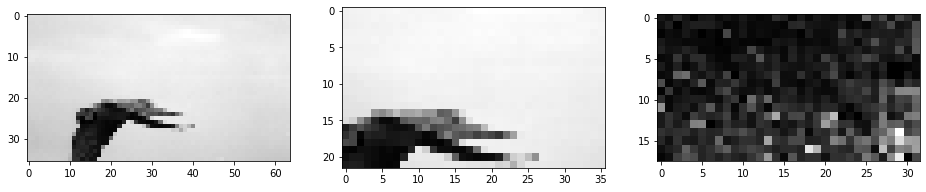

In [7]:
### show data
sample_data_key = dataloaders["mouse_v1"]["test"].data_keys[0]
datapoint = next(iter(dataloaders["mouse_v1"]["test"].dataloaders[0]))
stim, resp = datapoint.images, datapoint.responses
pupil_center = datapoint.pupil_center
print(
    f"Training dataset:\t {sum(len(dl) * config['data']['mouse_v1']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['train'].dataloaders)} samples"
    f"\nValidation dataset:\t {sum(len(dl) * config['data']['mouse_v1']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['val'].dataloaders)} samples"
    f"\nTest dataset:\t\t {sum(len(dl) * config['data']['mouse_v1']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['test'].dataloaders)} samples"
    f"\nTest (no resp) dataset:\t {sum(len(dl) * config['data']['mouse_v1']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['test_no_resp'].dataloaders)} samples"

    "\n\nstimuli:"
    f"\n  {stim.shape}"
    f"\n  min={stim.min().item():.3f}  max={stim.max().item():.3f}"
    f"\n  mean={stim.mean().item():.3f}  std={stim.std().item():.3f}"
    "\nresponses:"
    f"\n  {resp.shape}"
    f"\n  min={resp.min().item():.3f}  max={resp.max().item():.3f}"
    f"\n  mean={resp.mean().item():.3f}  std={resp.std().item():.3f}"
    "\nneuronal coordinates:"
    f"\n  {neuron_coords[sample_data_key].shape}"
    f"\n  min={neuron_coords[sample_data_key].min():.3f}  max={neuron_coords[sample_data_key].max():.3f}"
    f"\n  mean={neuron_coords[sample_data_key].mean():.3f}  std={neuron_coords[sample_data_key].std():.3f}"
)

### plot sample data
sample_idx = 0

fig = plt.figure(figsize=(16, 6))
ax = fig.add_subplot(131)
ax.imshow(stim[sample_idx].squeeze().unsqueeze(-1).cpu(), cmap="gray")

ax = fig.add_subplot(132)
ax.imshow(crop(stim[sample_idx].cpu(), config["crop_win"]).squeeze().unsqueeze(-1), cmap="gray")

### bin the neuronal responses based on their neuron coordinates and sum within each bin -> 2D grid of vals
coords = neuron_coords[sample_data_key]
H, W = stim.shape[-2:] # the size of the grid
n_x_bins, n_y_bins = 32, 18 # number of bins in each dimension
min_x, max_x, min_y, max_y = coords[:,0].min().item(), coords[:,0].max().item(), coords[:,1].min().item(), coords[:,1].max().item()
x_bins = torch.linspace(min_x, max_x, n_x_bins + 1)
y_bins = torch.linspace(min_y, max_y, n_y_bins + 1)
binned_resp = torch.zeros(n_y_bins, n_x_bins)
for i in range(n_y_bins):
    for j in range(n_x_bins):
        ### mask of the neurons in the bin
        mask = (x_bins[j] <= coords[:,0]) &\
               (coords[:,0] < x_bins[j + 1]) &\
               (y_bins[i] <= coords[:,1]) &\
               (coords[:,1] < y_bins[i + 1])
        binned_resp[i,j] = resp[sample_idx, mask.cpu()].sum(0)
ax = fig.add_subplot(133)
ax.imshow(binned_resp.squeeze().cpu(), cmap="gray")
plt.show()

### Synthetic dataset (different image stimuli -> encoder -> responses)

In [ ]:
### append synthetic data
config["data"]["syn_dataset_config"] = {
    "data_keys": [
        # "21067-10-18",
        # "22846-10-16",
        # "23343-5-17",
        # "23656-14-22",
        # "23964-4-22",
    ],
    "batch_size": 3,
    "append_data_parts": ["train"],
    # "data_key_prefix": "syn",
    "data_key_prefix": None,
}

dataloaders = append_syn_dataloaders(dataloaders, config=config["data"]["syn_dataset_config"])

In [ ]:
### show data
syn_stim, syn_resp, syn_pupil_center = next(iter(dataloaders["mouse_v1"]["train"].dataloaders[-1]))
syn_sample_data_key = dataloaders["mouse_v1"]["train"].data_keys[-1]
print(
    f"Training dataset:\t {sum(len(dl) * config['data']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['train'].dataloaders)} samples"
    f"\nValidation dataset:\t {sum(len(dl) * config['data']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['val'].dataloaders)} samples"
    f"\nTest dataset:\t\t {sum(len(dl) * config['data']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['test'].dataloaders)} samples"
    f"\nTest (no resp) dataset:\t {sum(len(dl) * config['data']['dataset_config']['batch_size'] for dl in dataloaders['mouse_v1']['test_no_resp'].dataloaders)} samples"

    "\n\nstimuli:"
    f"\n  {syn_stim.shape}"
    f"\n  min={syn_stim.min().item():.3f}  max={syn_stim.max().item():.3f}"
    f"\n  mean={syn_stim.mean().item():.3f}  std={syn_stim.std().item():.3f}"
    "\nresponses:"
    f"\n  {syn_resp.shape}"
    f"\n  min={syn_resp.min().item():.3f}  max={syn_resp.max().item():.3f}"
    f"\n  mean={syn_resp.mean().item():.3f}  std={syn_resp.std().item():.3f}"
    "\nNeuron coordinates:"
    f"\n  {neuron_coords[sample_data_key].shape}"
    f"\n  min={neuron_coords[sample_data_key].min():.3f}  max={neuron_coords[sample_data_key].max():.3f}"
    f"\n  mean={neuron_coords[sample_data_key].mean():.3f}  std={neuron_coords[sample_data_key].std():.3f}"
    "\nPupil center:"
    f"\n  {syn_pupil_center.shape}"
    f"\n  min={syn_pupil_center.min().item():.3f}  max={syn_pupil_center.max().item():.3f}"
    f"\n  mean={syn_pupil_center.mean().item():.3f}  std={syn_pupil_center.std().item():.3f}"
)

### plot sample data
sample_idx = 0

fig = plt.figure(figsize=(16, 6))
ax = fig.add_subplot(131)
ax.imshow(syn_stim[sample_idx].squeeze().unsqueeze(-1).cpu(), cmap="gray")

ax = fig.add_subplot(132)
ax.imshow(crop(syn_stim[sample_idx].cpu(), config["crop_win"]).squeeze().unsqueeze(-1), cmap="gray")

### bin the neuronal responses based on their neuron coordinates and sum within each bin -> 2D grid of vals
coords = neuron_coords[syn_sample_data_key]
H, W = syn_stim.shape[-2:] # the size of the grid
n_x_bins, n_y_bins = 32, 18 # number of bins in each dimension
min_x, max_x, min_y, max_y = coords[:,0].min().item(), coords[:,0].max().item(), coords[:,1].min().item(), coords[:,1].max().item()
x_bins = torch.linspace(min_x, max_x, n_x_bins + 1)
y_bins = torch.linspace(min_y, max_y, n_y_bins + 1)
binned_resp = torch.zeros(n_y_bins, n_x_bins)
for i in range(n_x_bins):
    for j in range(n_y_bins):
        ### mask of the neurons in the bin
        mask = (x_bins[i] <= coords[:,0]) &\
               (coords[:,0] < x_bins[i + 1]) &\
               (y_bins[j] <= coords[:,1]) &\
               (coords[:,1] < y_bins[j + 1])
        binned_resp[j,i] = syn_resp[sample_idx, mask.cpu()].sum(0)
ax = fig.add_subplot(133)
ax.imshow(binned_resp.squeeze().cpu(), cmap="gray")
plt.show()

## Encoder

In [8]:
encoder = get_encoder(device=config["device"], eval_mode=True)

Loading encoder checkpoint from /media/jsobotka/ext_ssd/csng_data/mouse_v1_sensorium22/models/encoder_sens22.pth


In [ ]:
### load encoder
print("Loading encoder...")

from lurz2020.models.models import se2d_fullgaussian2d

### load pretrained encoder ckpt
encoder_ckpt = torch.load(
    os.path.join(DATA_PATH, "models", "encoder.pt"),
    map_location=config["device"],
    pickle_module=dill,
)

### get temporary dataloaders for the encoder
_dataloaders = get_data(
    encoder_ckpt["config"]["data"]["dataset_fn"],
    encoder_ckpt["config"]["data"]["dataset_config"]
)

### init encoder
encoder = se2d_fullgaussian2d(
    **encoder_ckpt["config"]["encoder"]["model_config"],
    dataloaders=_dataloaders,
    seed=encoder_ckpt["config"]["seed"],
).float()
encoder.load_state_dict(encoder_ckpt["encoder_state"], strict=True)
encoder.to(config["device"])
encoder.eval()
del _dataloaders

## Decoder

In [9]:
def train(model, dataloader, verbose=True):
    model.train()
    train_loss = 0
    n_batches = len(dataloader)

    ### run
    for batch_idx, b in enumerate(dataloader):
        loss = 0

        ### combine from all data keys
        for data_key, stim, resp, neuron_coords, pupil_center in b:
            ### get loss
            # stim_pred, _, _ = model(
            #     resp=resp,
            #     data_key=data_key,
            #     train=True,
            #     stim_target=stim,
            #     neuron_coords=neuron_coords,
            #     pupil_center=pupil_center,
            # )
            loss += model.fit_direct_iter(
                resp=resp,
                stim_target=stim,
                data_key=data_key,
                neuron_coords=neuron_coords,
                pupil_center=pupil_center,
            )
            # loss += loss_fn(stim_pred, stim, data_key=data_key, phase="train", neuron_coords=neuron_coords, pupil_center=pupil_center)
            # model.refiner.set_additional_loss(
            #     inp={
            #         "resp": resp,
            #         "stim": stim,
            #         "neuron_coords": neuron_coords,
            #         "pupil_center": pupil_center,
            #         "data_key": data_key,
            #     }, out={
            #         "stim_pred": stim_pred,
            #     },
            # )
            # loss += model.refiner.get_additional_loss(data_key=data_key)

        ### update
        loss /= len(b)

        ### log
        train_loss += loss
        if verbose and batch_idx % 100 == 0:
            print(f"Training progress: [{batch_idx}/{n_batches} ({100. * batch_idx / n_batches:.0f}%)]"
                  f"  Loss: {loss:.6f}")

    train_loss /= n_batches
    return train_loss

In [10]:
def val(model, dataloader, loss_fn, config, only_data_keys=None):
    model.eval()
    val_losses = {"total": 0}
    n_samples = 0
    denom_data_keys = {}

    for b in dataloader:
        ### combine from all data keys
        for data_key, stim, resp, neuron_coords, pupil_center in b:
            if only_data_keys is not None and data_key not in only_data_keys:
                continue
            stim_pred, _, _ = model(
                resp=resp,
                data_key=data_key,
                train=False,
                stim_target=None,
                neuron_coords=neuron_coords,
                pupil_center=pupil_center,
            )
            loss = loss_fn(stim_pred, stim, data_key=data_key, phase="val").item()
            val_losses["total"] += loss
            val_losses[data_key] = loss if data_key not in val_losses else val_losses[data_key] + loss
            denom_data_keys[data_key] = denom_data_keys[data_key] + resp.shape[0] if data_key in denom_data_keys else resp.shape[0]
            n_samples += resp.shape[0]

    val_losses["total"] /= n_samples
    for k in denom_data_keys:
        val_losses[k] /= denom_data_keys[k]
    return val_losses

In [11]:
def get_all_data(config):
    dls, neuron_coords = get_mouse_v1_data(config=config["data"])
    if "syn_dataset_config" in config["data"] and config["data"]["syn_dataset_config"] is not None:
        dls = append_syn_dataloaders(dls, config=config["data"]["syn_dataset_config"]) # append synthetic data
    if "data_augmentation" in config["data"] and config["data"]["data_augmentation"] is not None:
        dls = append_data_aug_dataloaders(
            dataloaders=dls,
            config=config["data"]["data_augmentation"],
        )
    return dls, neuron_coords

In [12]:
l1 = nn.MSELoss()
l2 = SSIMLoss(log_loss=True, inp_normalized=True, inp_standardized=False)
loss_fn_combined = lambda pred, target: 0.7 * l1(pred, target) + 0.3 * l2(pred, target)

[WARNING] Setting nonnegative_ssim to True as log_loss is set to True.


In [14]:
config["decoder"] = {
    "model": {
        "encoder": encoder,
        "img_dims": (1, 36, 64),
        "stim_pred_init": "zeros",
        "opter_cls": torch.optim.SGD,
        "opter_config": {"lr": 1500, "momentum": 0},
        "n_steps": 10,
        "last_enc_inv_step": 1,
        "resp_loss_fn": nn.MSELoss(reduction="sum"),
        "stim_loss_fn": SSIMLoss(
            window=config["crop_win"],
            log_loss=True,
            inp_normalized=True,
            inp_standardized=False,
        ),
        "img_gauss_blur_config": None,
        "img_grad_gauss_blur_config": {"kernel_size": 17, "sigma": 2},
        "img_normalize": True,
        "refiner_cls": MultiReadIn,
        "refiner_config": {
            "readins_config": [
                {
                    "data_key": data_key,
                    "in_shape": n_coords.shape[-2],
                    "decoding_objective_config": None,
                    "layers": [
                        (ConvReadIn, {
                            # "H": 9,
                            # "W": 16,
                            # "H": 11,
                            # "W": 18,
                            "H": 5,
                            "W": 9,
                            "shift_coords": True,
                            "learn_grid": True,
                            "grid_net_config": {
                                "in_channels": 4, # x, y, z, resp
                                # "layers_config": [("fc", 32), ("fc", 64), ("fc", 9*16)],
                                # "layers_config": [("fc", 32), ("fc", 64), ("fc", 11*18)],
                                "layers_config": [("fc", 16), ("fc", 64), ("fc", 5*9)],
                                "act_fn": nn.LeakyReLU,
                                "out_act_fn": nn.Identity,
                                "dropout": 0.1,
                                "batch_norm": False,
                            },
                            "grid_l1_reg": 8e-3,
                            "in_channels_group_size": 1,
                            "pointwise_conv_config": {
                                "in_channels": n_coords.shape[-2],
                                "out_channels": 256,
                                "act_fn": nn.LeakyReLU,
                                # "act_fn": nn.Identity,
                                "bias": False,
                                "batch_norm": True,
                            },
                            "gauss_blur": False,
                            "gauss_blur_kernel_size": 9,
                            # "gauss_blur_sigma": "fixed", # "fixed", "single", "per_neuron"
                            "gauss_blur_sigma": "per_neuron", # "fixed", "single", "per_neuron"
                            "gauss_blur_sigma_init": 1,
                            "neuron_emb_dim": None,
                            # "out_channels": 145,
                        }),
                        # (nn.Upsample, {"scale_factor": 2}, 145),
                        # (nn.Linear, {"in_features": n_coords.shape[-2], "out_features": 512}, 512),
                    ],
                } for data_key, n_coords in dataloaders["mouse_v1"]["train"].neuron_coords.items()
            ],
            # "core_cls": CNN_Decoder,
            "core_cls": ContextUnet,
            "core_config": {
                ### CNN_Decoder
                # "resp_shape": [145],
                # "stim_shape": list(stim.shape[1:]),
                # "layers": [
                #     ### for conv_readin
                #     ("conv", 128, 7, 1, 3),
                #     ("conv", 64, 5, 1, 2),
                #     ("conv", 64, 3, 1, 1),
                #     # ("conv", 32, 3, 1, 1),
                #     ("conv", 1, 3, 1, 1),
                # ],
                # "act_fn": nn.ReLU,
                # "out_act_fn": nn.Identity,
                # "dropout": 0.3,
                # "batch_norm": True,
                
                ### ContextUnet
                # "in_channels": 145,
                "resp_channels": 256,
                "out_channels": 1,
                "channels": (64,128,256),
                "bottleneck_avgpool": False,
                "gn_mul_context": {
                    "in_shape": (1,),
                    "embed_type": "fc",
                },
                "gn_add_context": None,
                "c3_config": {
                    "in_shape": (1,22,36),
                    "use_as": "input",
                }
            },
        },
        "refiner_opter_cls": torch.optim.Adam,
        "refiner_opter_config": {"lr": 3e-4},
        "refiner_crop_win": (22, 36),
        "refiner_freq": 1,
        "refiner_loss_fn": {
            # "loss_fn": MSELossWithCrop(window=config["crop_win"], standardize=False),
            # "loss_fn": SSIMLoss(
            #     window=config["crop_win"],
            #     log_loss=True,
            #     inp_normalized=True,
            #     inp_standardized=False,
            # ),
            "loss_fn": CroppedLoss(
                window=config["crop_win"],
                # loss_fn=nn.MSELoss(),
                loss_fn=loss_fn_combined,
            ),
            "l1_reg_mul": 0,
            "l2_reg_mul": 3e-5,
            "con_reg_mul": 0,
            # "con_reg_mul": 1,
            "con_reg_loss_fn": SSIMLoss(
                window=config["crop_win"],
                log_loss=True,
                inp_normalized=True,
                inp_standardized=False,
            ),
            "encoder": None,
            # "encoder": encoder,
        },
        "eps_noise_after_refiner": 0.003,
        "device": config["device"],
    },
    "n_epochs": 600,
    "load_ckpt": None,
    # "load_ckpt": {
    #     # "load_only_core": False,
    #     "load_only_core": True,
    #     "ckpt_path": os.path.join(
    #         DATA_PATH, "models", "cat_v1_pretraining", "2024-02-27_19-17-39", "decoder.pt"),
    #         # DATA_PATH, "models", "cnn", "2023-08-25_09-07-46", "ckpt", "decoder_40.pt"),
    # },
    "save_run": False,
}

[WARNING] Setting nonnegative_ssim to True as log_loss is set to True.
[WARNING] Setting nonnegative_ssim to True as log_loss is set to True.


In [15]:
### initialize (and load ckpt if needed)
if config["decoder"]["load_ckpt"] != None:
    raise NotImplementedError("Loading ckpt not implemented yet.")
    print(f"[INFO] Loading checkpoint from {config['decoder']['load_ckpt']['ckpt_path']}...")
    ckpt = torch.load(config["decoder"]["load_ckpt"]["ckpt_path"], map_location=config["device"], pickle_module=dill)

    if config["decoder"]["load_ckpt"]["load_only_core"]:
        print("[INFO] Loading only the core of the model (no history, no best ckpt)...")

        ### init decoder (load only the core)
        config["decoder"]["model"]["core_cls"] = ckpt["config"]["decoder"]["model"]["core_cls"]
        config["decoder"]["model"]["core_config"] = ckpt["config"]["decoder"]["model"]["core_config"]
        decoder = MultiReadIn(**config["decoder"]["model"]).to(config["device"])
        decoder.load_state_dict({k:v for k,v in ckpt["best"]["model"].items() if "readin" not in k}, strict=False)

        ### init the rest
        opter = config["decoder"]["opter_cls"](decoder.parameters(), **config["decoder"]["opter_kwargs"])
        loss_fn = Loss(model=decoder, config=config["decoder"]["loss"])
        history = {"train_loss": [], "val_loss": []}
        best = {"val_loss": np.inf, "epoch": 0, "model": None}
    else:
        print("[INFO] Loading the whole model (the latest - not the BEST; with history and best ckpt)...")
        history, config["decoder"]["model"], best = ckpt["history"], ckpt["config"]["decoder"]["model"], ckpt["best"]

        decoder = MultiReadIn(**config["decoder"]["model"]).to(config["device"])
        decoder.load_state_dict(ckpt["decoder"])

        opter = config["decoder"]["opter_cls"](decoder.parameters(), **config["decoder"]["opter_kwargs"])
        opter.load_state_dict(ckpt["opter"])
        loss_fn = Loss(model=decoder, config=config["decoder"]["loss"])
else:
    print("[INFO] Initializing the model from scratch...")
    decoder = BoostedInvertedEncoder(**config["decoder"]["model"]).to(config["device"])
    decoder.refiner_loss_fn = Loss(model=decoder.refiner, config=config["decoder"]["model"]["refiner_loss_fn"])
    # loss_fn_train = decoder.refiner_loss_fn
    loss_fn_val = Loss(model=None, config={"loss_fn": decoder.stim_loss_fn})

    history = {"train_loss": [], "val_loss": []}
    best = {"val_loss": np.inf, "epoch": 0, "model": None}

[INFO] Initializing the model from scratch...


In [ ]:
### print model and fix sizes of stimuli
stim_pred, _, _ = decoder(resp.to(config["device"]), train=False, data_key=sample_data_key, neuron_coords=neuron_coords[sample_data_key], pupil_center=pupil_center.to(config["device"]))
if stim_pred.shape != crop(stim, config["crop_win"]).shape:
    print(f"[WARNING] Stimulus prediction shape {stim_pred.shape} does not match stimulus shape {crop(stim, config['crop_win']).shape}.")
    assert stim_pred.shape[-2] >= crop(stim, config["crop_win"]).shape[-2] \
        and stim_pred.shape[-1] >= crop(stim, config["crop_win"]).shape[-1]
    
    # ### set crop function
    # decoder.crop_stim_fn = lambda x: x[:, :, :crop(stim, config["crop_win"]).shape[-2], :crop(stim, config["crop_win"]).shape[-1]]
    # stim_pred = decoder(resp.to(config["device"]), data_key=sample_data_key, neuron_coords=neuron_coords[sample_data_key], pupil_center=pupil_center.to(config["device"]))
    # print(f"[INFO] Stimulus prediction shape cropped to {stim_pred.shape}.")

print(stim_pred.shape)
del stim_pred

print(
    f"Number of parameters:"
    f"\n  whole refiner model: {count_parameters(decoder.refiner)}"
    f"\n  refiner core: {count_parameters(decoder.refiner.core)} ({count_parameters(decoder.refiner.core) / count_parameters(decoder.refiner) * 100:.2f}%)"
    f"\n  refiner readins: {count_parameters(decoder.refiner.readins)} ({count_parameters(decoder.refiner.readins) / count_parameters(decoder.refiner) * 100:.2f}%)"
    f"\n    ({', '.join([f'{k}: {count_parameters(v)} [{count_parameters(v) / count_parameters(decoder.refiner) * 100:.2f}%]' for k, v in decoder.refiner.readins.items()])})"
)

decoder

In [16]:
### prepare checkpointing and wandb logging
config["run_name"] = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
if config["decoder"]["save_run"]:
    ### save config
    config["dir"] = os.path.join(DATA_PATH, "models", "boosted_inverted_encoder", config["run_name"])
    os.makedirs(config["dir"], exist_ok=True)
    with open(os.path.join(config["dir"], "config.json"), "w") as f:
        json.dump(config, f, indent=4, default=str)
    os.makedirs(os.path.join(config["dir"], "samples"), exist_ok=True)
    os.makedirs(os.path.join(config["dir"], "ckpt"), exist_ok=True)
    make_sample_path = lambda epoch, prefix: os.path.join(
        config["dir"], "samples", f"{prefix}stim_comparison_{epoch}e.png"
    )

    print(f"Run name: {config['run_name']}\nRun dir: {config['dir']}")
else:
    make_sample_path = lambda epoch, prefix: None
    print("[WARNING] Not saving the run and the config.")

if config["wandb"]:
    wdb_run = wandb.init(**config["wandb"], name=config["run_name"], config=config,
        tags=[
            config["decoder"]["model"]["core_cls"].__name__,
            config["decoder"]["model"]["readins_config"][0]["layers"][0][0].__name__,
            # "contrastive_regularization",
            # "cat_v1_pretraining"
        ],
        notes=None)
    wdb_run.watch(decoder)
else:
    print("[WARNING] Not using wandb.")

[WARNING] Not saving the run and the config.
[WARNING] Not using wandb.


[1/600]
Training progress: [0/280 (0%)]  Loss: 4.055120
Training progress: [100/280 (36%)]  Loss: 0.408842
Training progress: [200/280 (71%)]  Loss: 0.265444
train_loss=0.4383


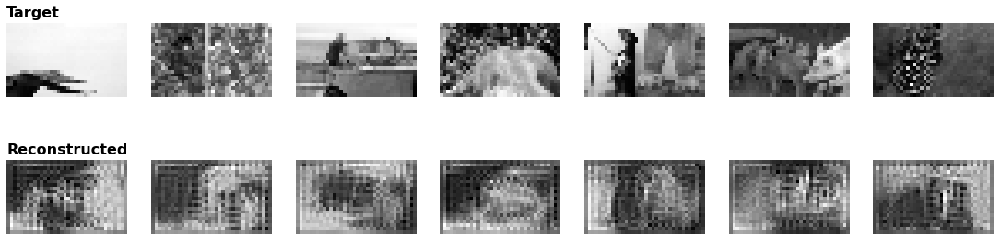

[2/600]
Training progress: [0/280 (0%)]  Loss: 0.294376
Training progress: [100/280 (36%)]  Loss: 0.277951
Training progress: [200/280 (71%)]  Loss: 0.187510
train_loss=0.2947


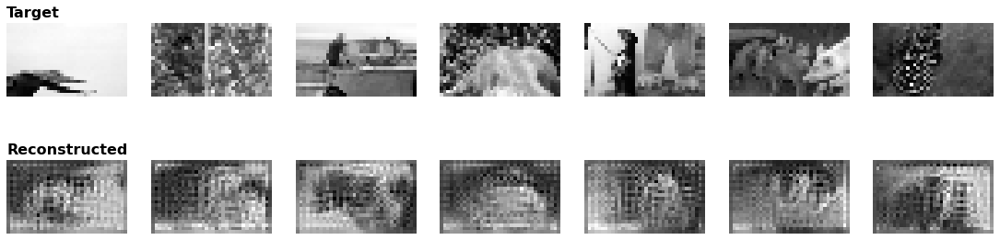

[3/600]
Training progress: [0/280 (0%)]  Loss: 0.256048
Training progress: [100/280 (36%)]  Loss: 0.203308
Training progress: [200/280 (71%)]  Loss: 0.157711
train_loss=0.2512


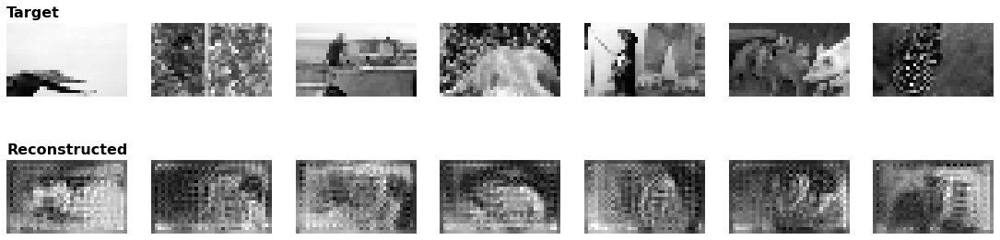

[4/600]
Training progress: [0/280 (0%)]  Loss: 0.231977
Training progress: [100/280 (36%)]  Loss: 0.163405
Training progress: [200/280 (71%)]  Loss: 0.142680
train_loss=0.2172


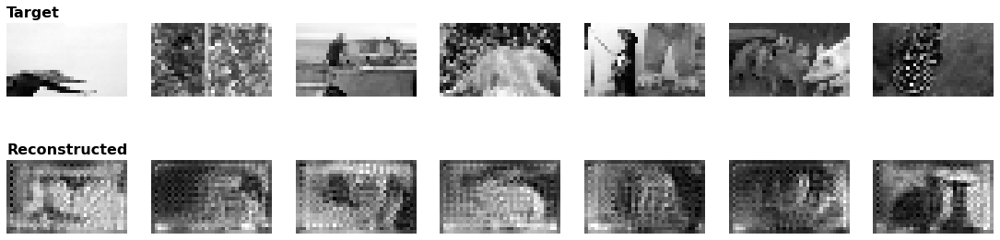

[5/600]
Training progress: [0/280 (0%)]  Loss: 0.191681
Training progress: [100/280 (36%)]  Loss: 0.155937
Training progress: [200/280 (71%)]  Loss: 0.125656
train_loss=0.1897


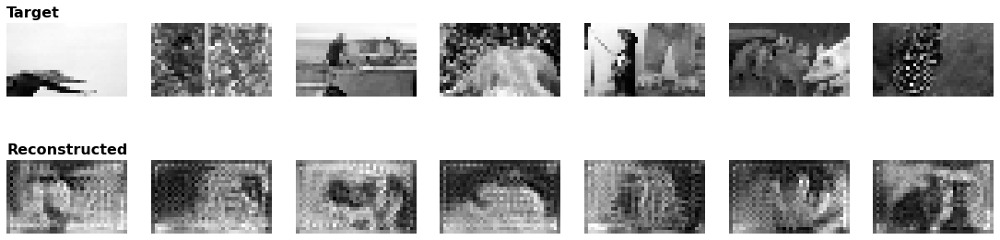

[6/600]
Training progress: [0/280 (0%)]  Loss: 0.176058
Training progress: [100/280 (36%)]  Loss: 0.149975
Training progress: [200/280 (71%)]  Loss: 0.125396
train_loss=0.1717


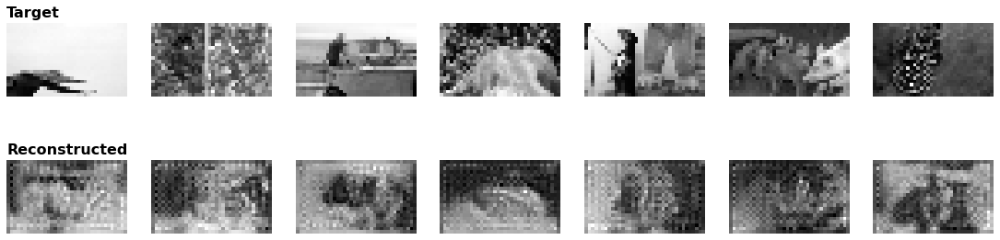

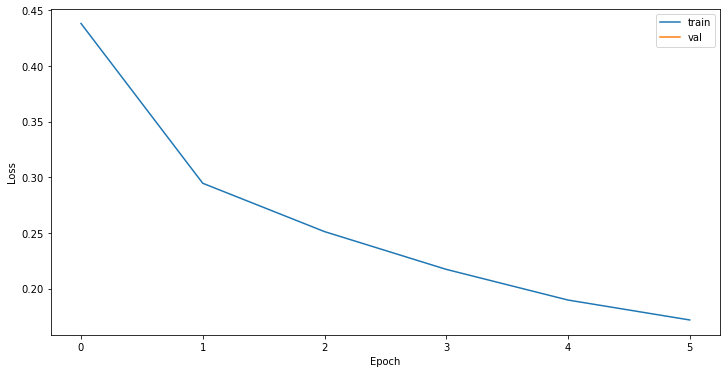

[7/600]
Training progress: [0/280 (0%)]  Loss: 0.148565
Training progress: [100/280 (36%)]  Loss: 0.127122
Training progress: [200/280 (71%)]  Loss: 0.117041
train_loss=0.1581


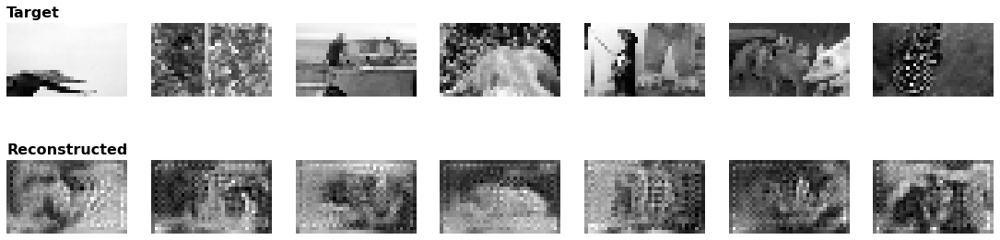

[8/600]
Training progress: [0/280 (0%)]  Loss: 0.128144
Training progress: [100/280 (36%)]  Loss: 0.115096
Training progress: [200/280 (71%)]  Loss: 0.122548
train_loss=0.1462


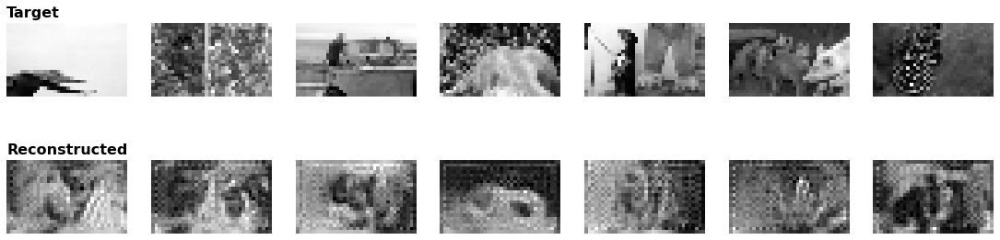

[9/600]
Training progress: [0/280 (0%)]  Loss: 0.121301
Training progress: [100/280 (36%)]  Loss: 0.102403
Training progress: [200/280 (71%)]  Loss: 0.098578
train_loss=0.1385


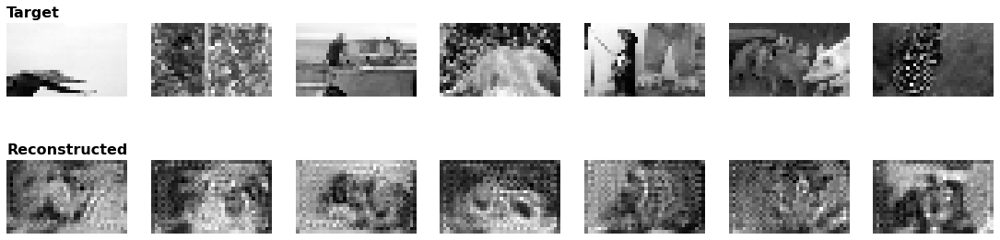

[10/600]
Training progress: [0/280 (0%)]  Loss: 0.124612
Training progress: [100/280 (36%)]  Loss: 0.087043
Training progress: [200/280 (71%)]  Loss: 0.091625
train_loss=0.1322


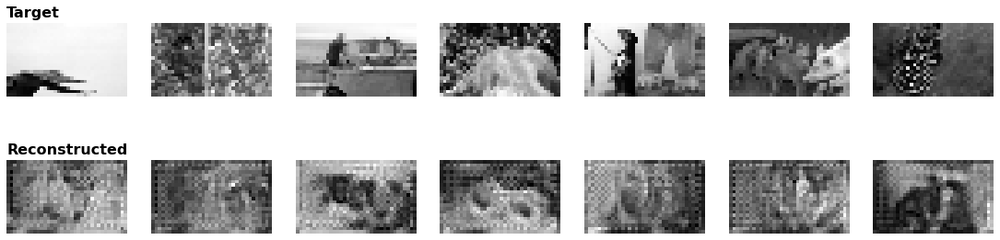

[11/600]
Training progress: [0/280 (0%)]  Loss: 0.113644
Training progress: [100/280 (36%)]  Loss: 0.089880
Training progress: [200/280 (71%)]  Loss: 0.105185
train_loss=0.1261


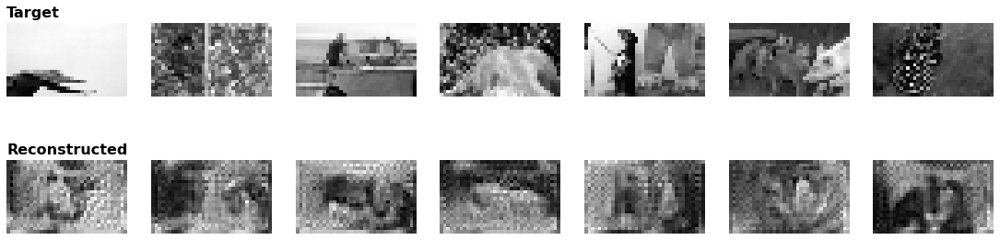

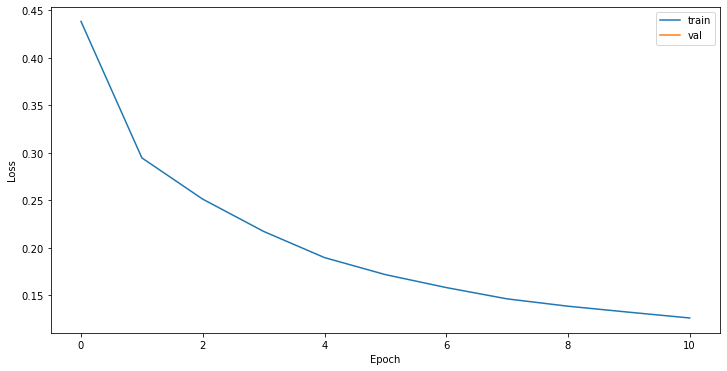

[12/600]
Training progress: [0/280 (0%)]  Loss: 0.117392
Training progress: [100/280 (36%)]  Loss: 0.096508
Training progress: [200/280 (71%)]  Loss: 0.085323
train_loss=0.1201


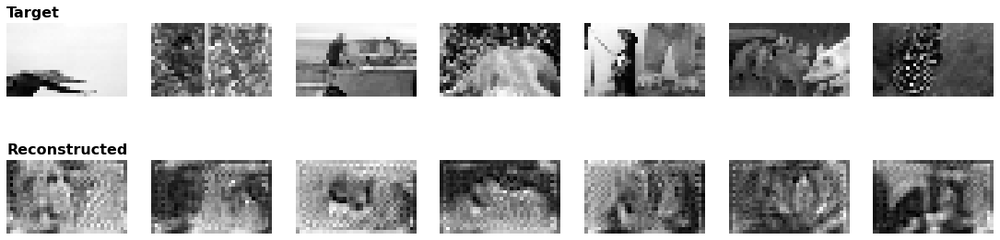

[13/600]
Training progress: [0/280 (0%)]  Loss: 0.103454
Training progress: [100/280 (36%)]  Loss: 0.094901
Training progress: [200/280 (71%)]  Loss: 0.087554
train_loss=0.1124


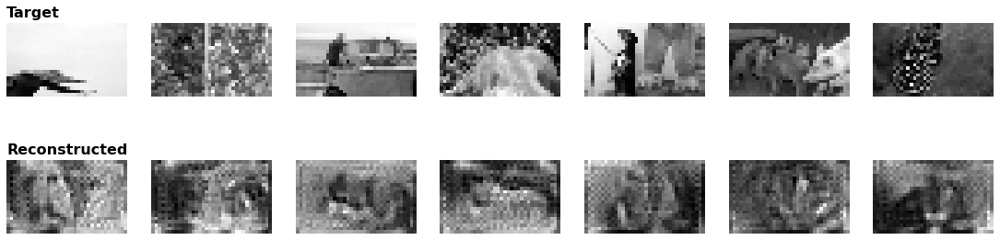

[14/600]
Training progress: [0/280 (0%)]  Loss: 0.104970
Training progress: [100/280 (36%)]  Loss: 0.088340
Training progress: [200/280 (71%)]  Loss: 0.085048
train_loss=0.1062


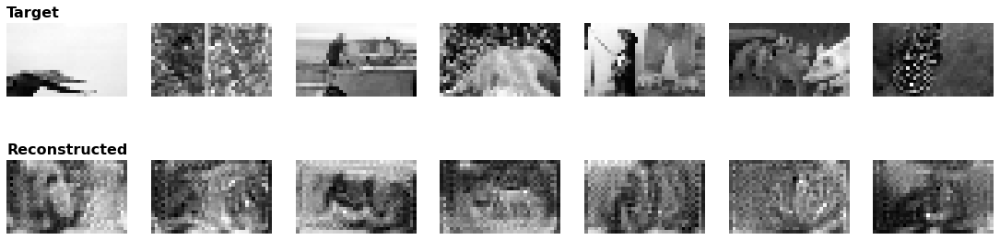

[15/600]
Training progress: [0/280 (0%)]  Loss: 0.096724
Training progress: [100/280 (36%)]  Loss: 0.085308
Training progress: [200/280 (71%)]  Loss: 0.081564
train_loss=0.1072


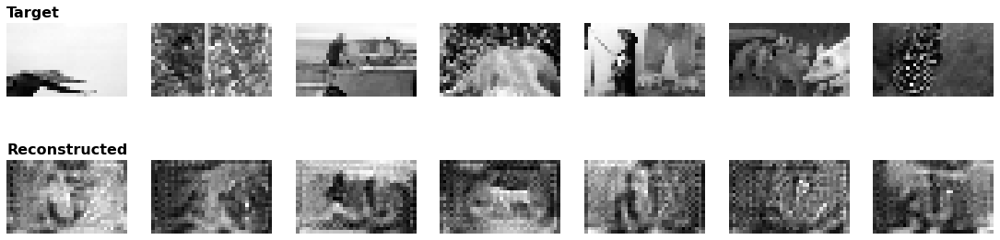

[16/600]
Training progress: [0/280 (0%)]  Loss: 0.104559
Training progress: [100/280 (36%)]  Loss: 0.083575
Training progress: [200/280 (71%)]  Loss: 0.092866
train_loss=0.1069


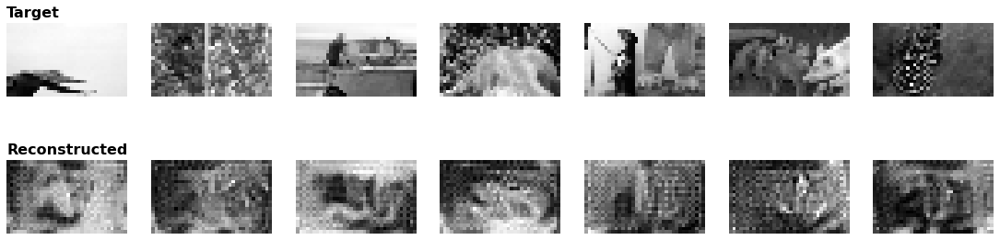

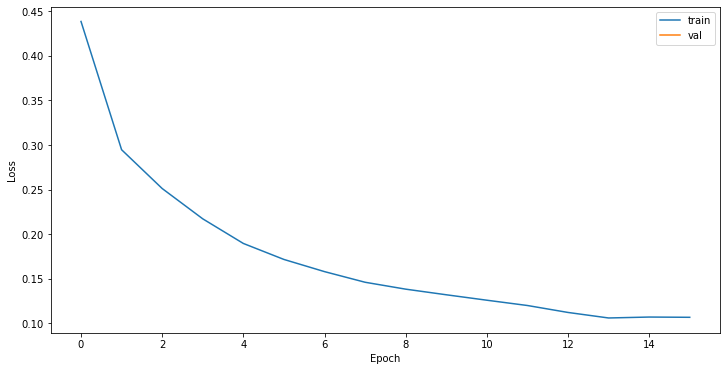

[17/600]
Training progress: [0/280 (0%)]  Loss: 0.083760
Training progress: [100/280 (36%)]  Loss: 0.077893
Training progress: [200/280 (71%)]  Loss: 0.077858
train_loss=0.1032


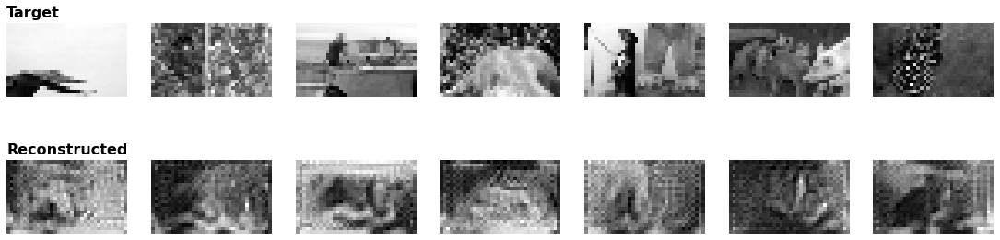

[18/600]
Training progress: [0/280 (0%)]  Loss: 0.089872
Training progress: [100/280 (36%)]  Loss: 0.067574
Training progress: [200/280 (71%)]  Loss: 0.076175
train_loss=0.0983


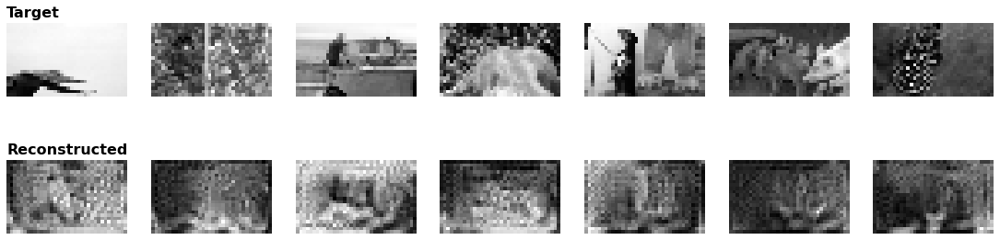

[19/600]
Training progress: [0/280 (0%)]  Loss: 0.093462
Training progress: [100/280 (36%)]  Loss: 0.076190
Training progress: [200/280 (71%)]  Loss: 0.067063
train_loss=0.0925


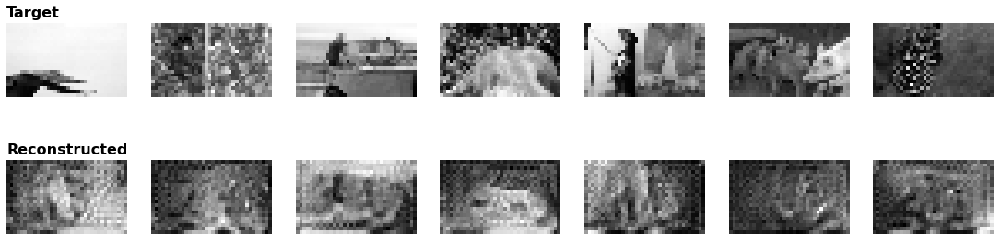

[20/600]
Training progress: [0/280 (0%)]  Loss: 0.091633
Training progress: [100/280 (36%)]  Loss: 0.067565
Training progress: [200/280 (71%)]  Loss: 0.076187
train_loss=0.0880


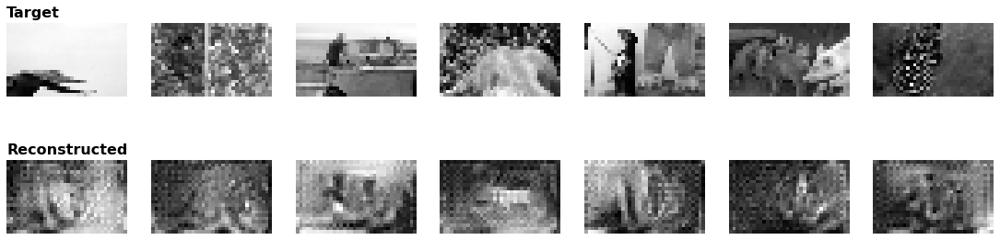

[21/600]
Training progress: [0/280 (0%)]  Loss: 0.078125
Training progress: [100/280 (36%)]  Loss: 0.082484
Training progress: [200/280 (71%)]  Loss: 0.078957
train_loss=0.0885


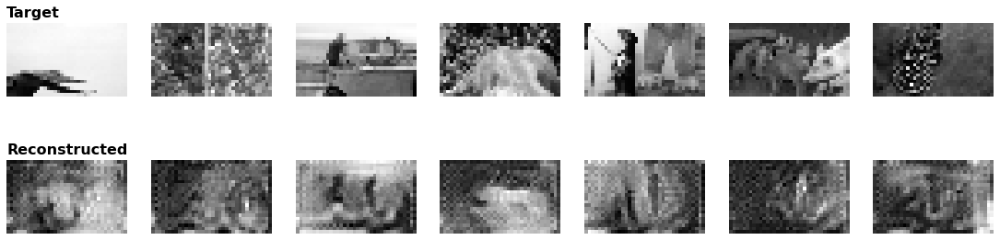

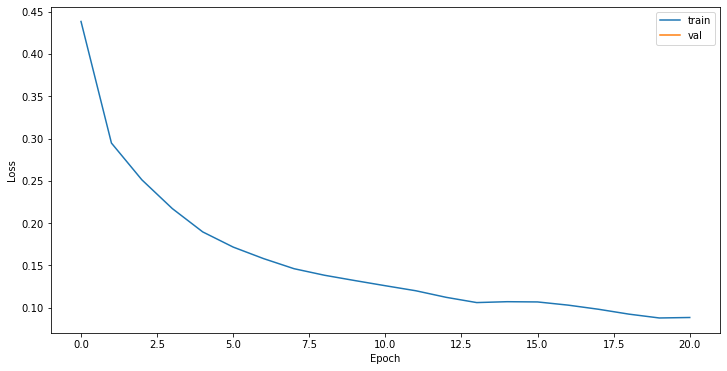

[22/600]
Training progress: [0/280 (0%)]  Loss: 0.068440
Training progress: [100/280 (36%)]  Loss: 0.094996
Training progress: [200/280 (71%)]  Loss: 0.066822
train_loss=0.0923


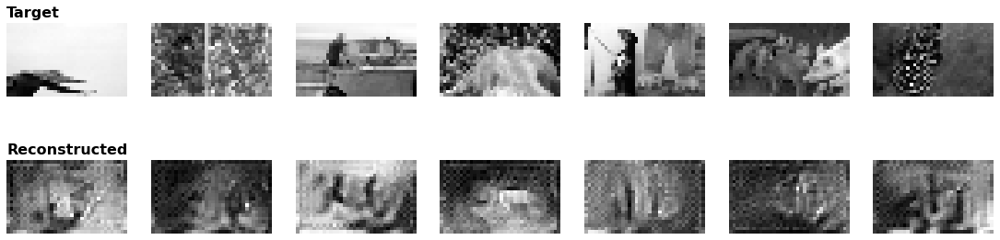

[23/600]
Training progress: [0/280 (0%)]  Loss: 0.070342
Training progress: [100/280 (36%)]  Loss: 0.073802
Training progress: [200/280 (71%)]  Loss: 0.067193
train_loss=0.0913


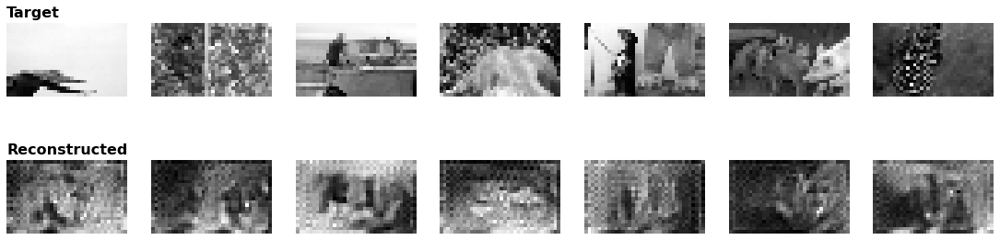

[24/600]
Training progress: [0/280 (0%)]  Loss: 0.073026
Training progress: [100/280 (36%)]  Loss: 0.068100
Training progress: [200/280 (71%)]  Loss: 0.063030
train_loss=0.0844


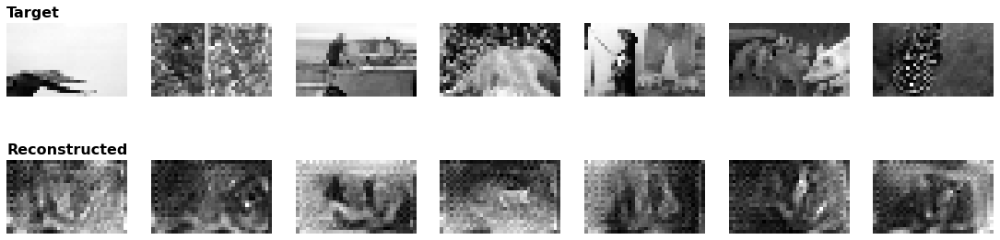

[25/600]
Training progress: [0/280 (0%)]  Loss: 0.075911
Training progress: [100/280 (36%)]  Loss: 0.064504
Training progress: [200/280 (71%)]  Loss: 0.080439
train_loss=0.0807


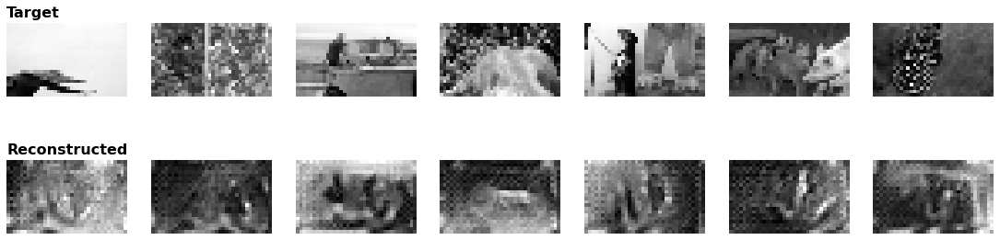

[26/600]
Training progress: [0/280 (0%)]  Loss: 0.065180
Training progress: [100/280 (36%)]  Loss: 0.066338
Training progress: [200/280 (71%)]  Loss: 0.098495
train_loss=0.0802


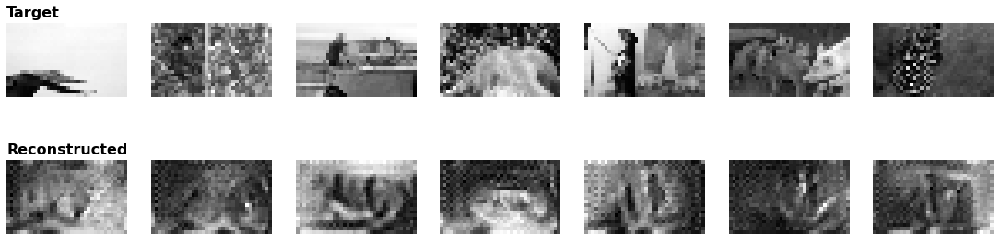

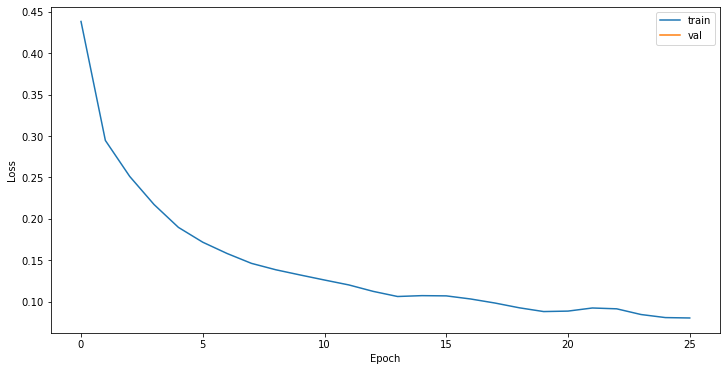

[27/600]
Training progress: [0/280 (0%)]  Loss: 0.071753
Training progress: [100/280 (36%)]  Loss: 0.067829
Training progress: [200/280 (71%)]  Loss: 0.101630
train_loss=0.0828


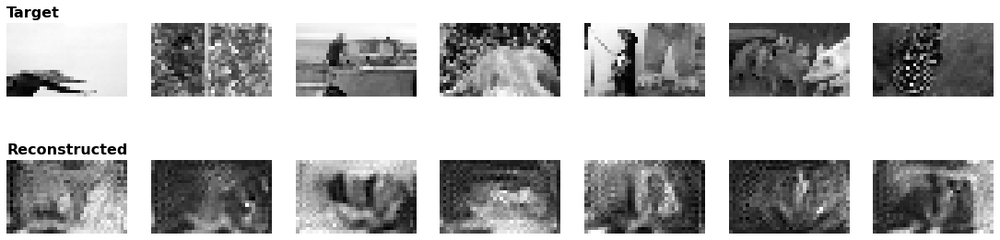

[28/600]
Training progress: [0/280 (0%)]  Loss: 0.070288
Training progress: [100/280 (36%)]  Loss: 0.072605
Training progress: [200/280 (71%)]  Loss: 0.076878
train_loss=0.0851


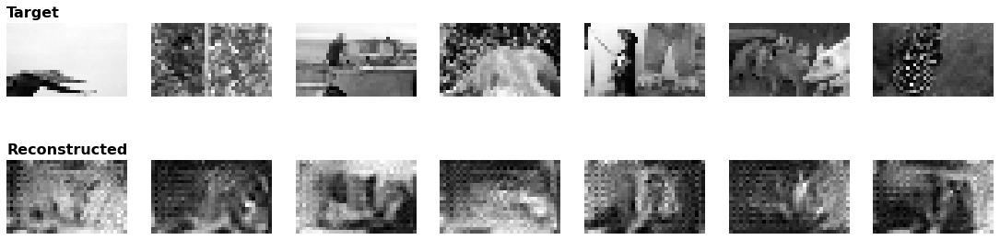

[29/600]
Training progress: [0/280 (0%)]  Loss: 0.057025
Training progress: [100/280 (36%)]  Loss: 0.064343
Training progress: [200/280 (71%)]  Loss: 0.090366
train_loss=0.0775


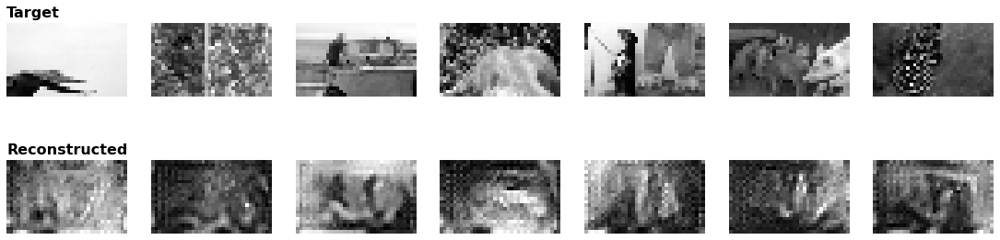

[30/600]
Training progress: [0/280 (0%)]  Loss: 0.060674
Training progress: [100/280 (36%)]  Loss: 0.049451
Training progress: [200/280 (71%)]  Loss: 0.076536
train_loss=0.0701


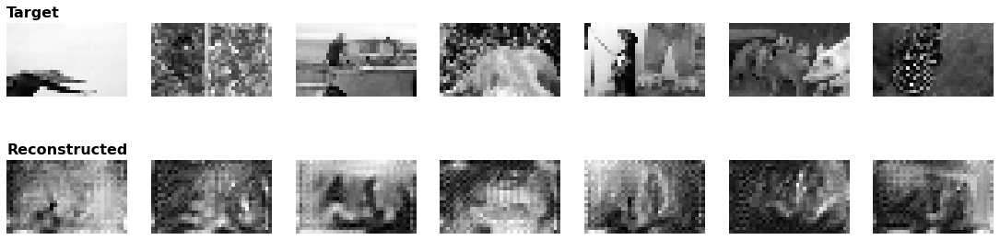

[31/600]
Training progress: [0/280 (0%)]  Loss: 0.056242
Training progress: [100/280 (36%)]  Loss: 0.059378
Training progress: [200/280 (71%)]  Loss: 0.064460
train_loss=0.0664


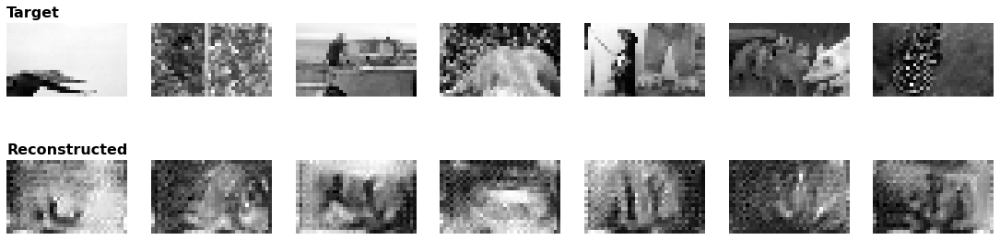

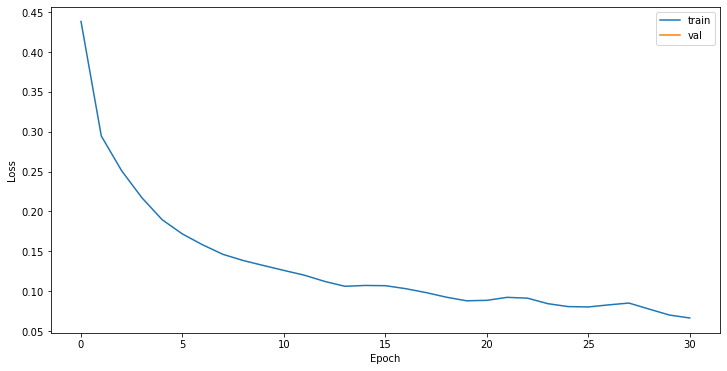

[32/600]
Training progress: [0/280 (0%)]  Loss: 0.049494
Training progress: [100/280 (36%)]  Loss: 0.055248
Training progress: [200/280 (71%)]  Loss: 0.056466
train_loss=0.0650


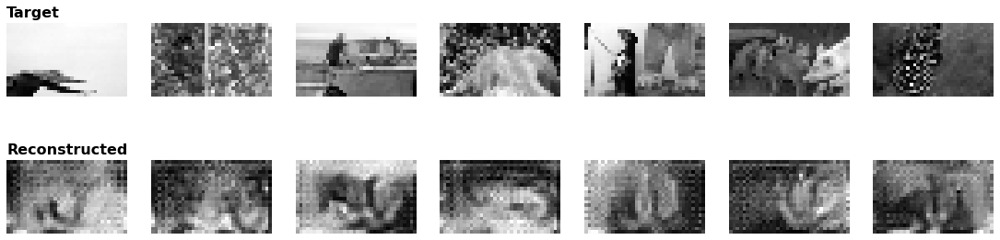

[33/600]
Training progress: [0/280 (0%)]  Loss: 0.055197
Training progress: [100/280 (36%)]  Loss: 0.059899
Training progress: [200/280 (71%)]  Loss: 0.059252
train_loss=0.0644


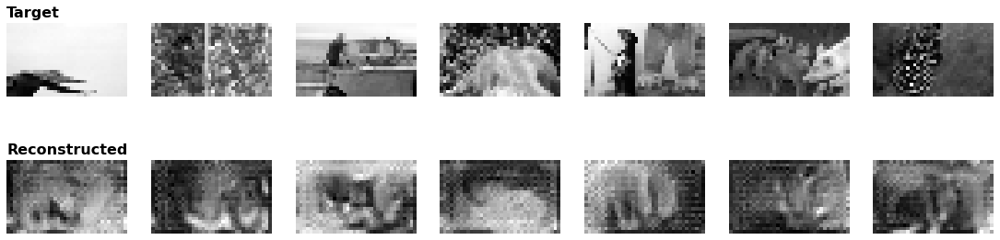

[34/600]
Training progress: [0/280 (0%)]  Loss: 0.055983
Training progress: [100/280 (36%)]  Loss: 0.053536
Training progress: [200/280 (71%)]  Loss: 0.060298
train_loss=0.0656


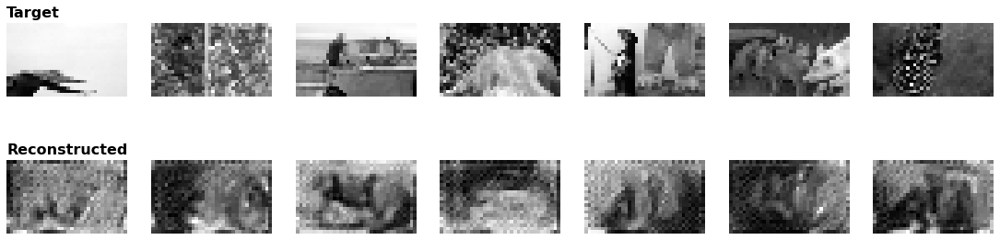

[35/600]
Training progress: [0/280 (0%)]  Loss: 0.065701
Training progress: [100/280 (36%)]  Loss: 0.055678
Training progress: [200/280 (71%)]  Loss: 0.060915
train_loss=0.0715


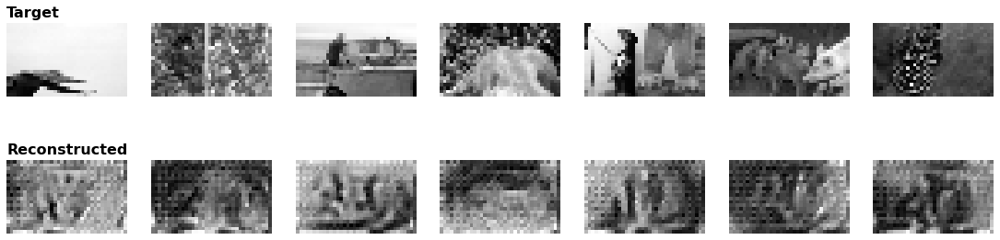

[36/600]
Training progress: [0/280 (0%)]  Loss: 0.071860
Training progress: [100/280 (36%)]  Loss: 0.062943
Training progress: [200/280 (71%)]  Loss: 0.057994
train_loss=0.0738


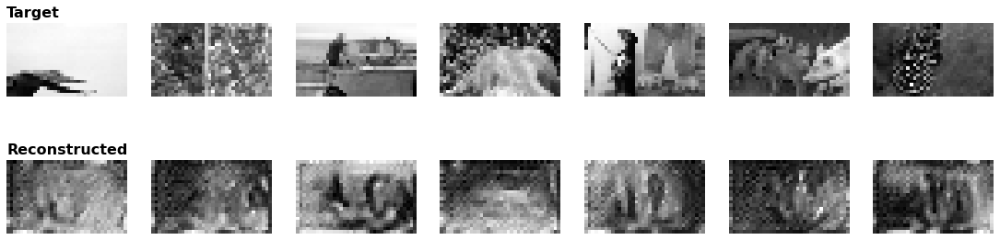

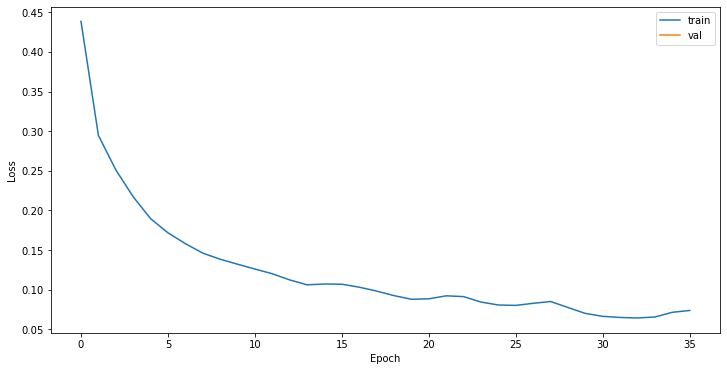

[37/600]
Training progress: [0/280 (0%)]  Loss: 0.066482
Training progress: [100/280 (36%)]  Loss: 0.052439
Training progress: [200/280 (71%)]  Loss: 0.047840
train_loss=0.0681


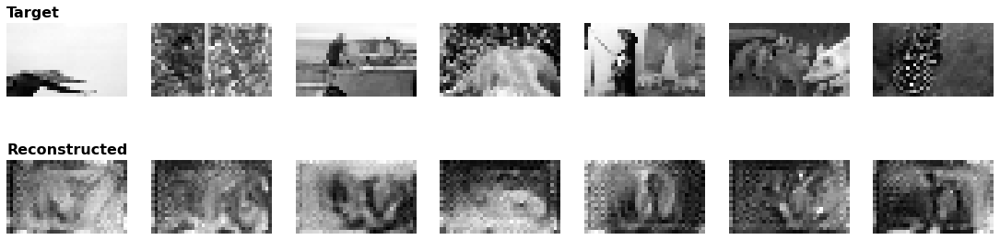

[38/600]
Training progress: [0/280 (0%)]  Loss: 0.045009
Training progress: [100/280 (36%)]  Loss: 0.047890
Training progress: [200/280 (71%)]  Loss: 0.057117
train_loss=0.0602


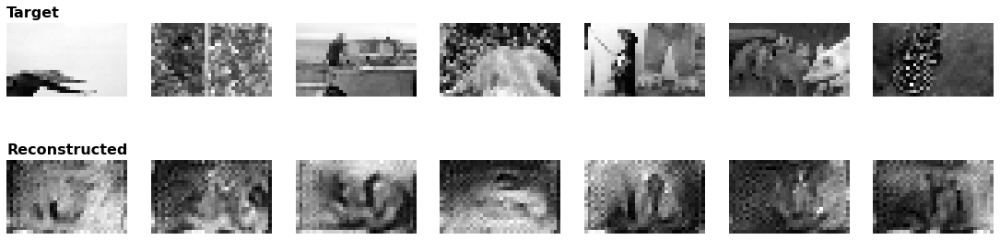

[39/600]
Training progress: [0/280 (0%)]  Loss: 0.040892
Training progress: [100/280 (36%)]  Loss: 0.042532
Training progress: [200/280 (71%)]  Loss: 0.049520
train_loss=0.0554


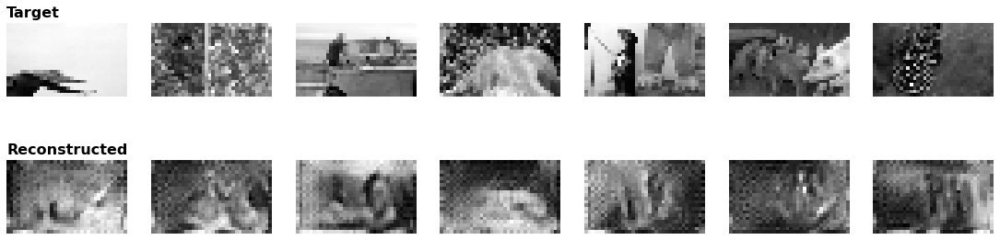

[40/600]
Training progress: [0/280 (0%)]  Loss: 0.038335
Training progress: [100/280 (36%)]  Loss: 0.052590
Training progress: [200/280 (71%)]  Loss: 0.046466
train_loss=0.0540


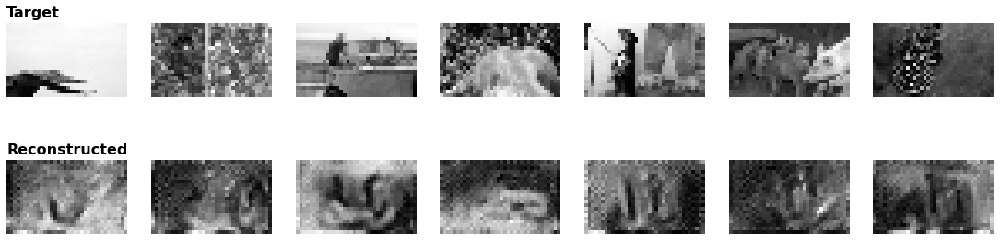

[41/600]
Training progress: [0/280 (0%)]  Loss: 0.040343
Training progress: [100/280 (36%)]  Loss: 0.051724
Training progress: [200/280 (71%)]  Loss: 0.044491
train_loss=0.0551


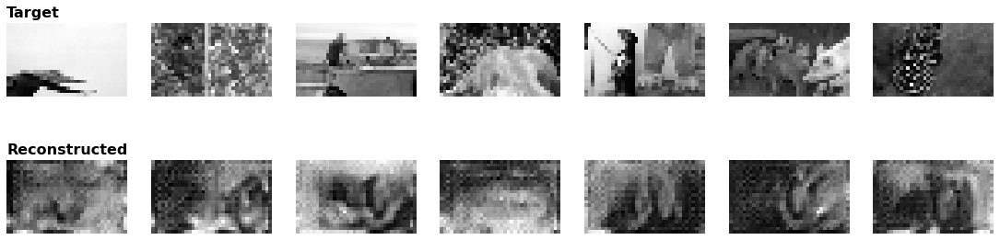

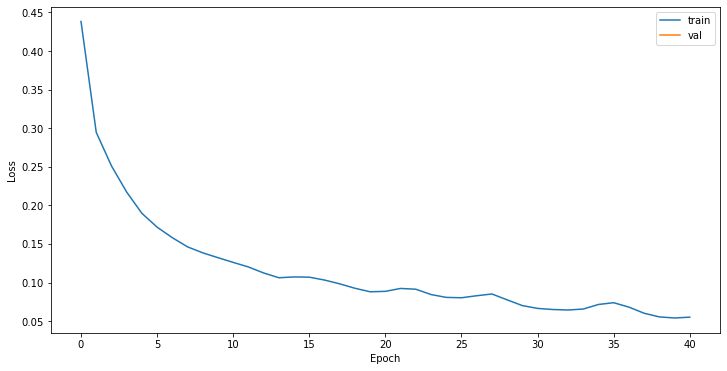

[42/600]
Training progress: [0/280 (0%)]  Loss: 0.044823
Training progress: [100/280 (36%)]  Loss: 0.054940
Training progress: [200/280 (71%)]  Loss: 0.052026
train_loss=0.0562


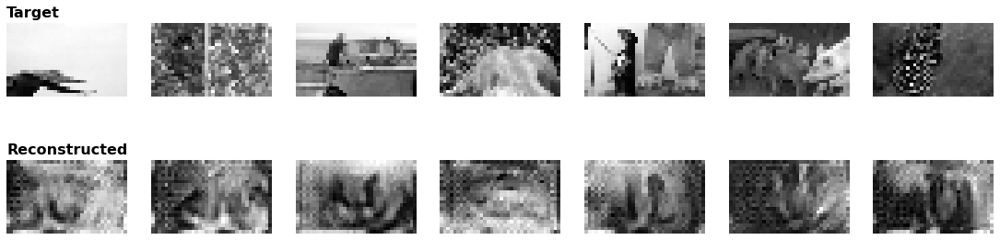

[43/600]
Training progress: [0/280 (0%)]  Loss: 0.057466
Training progress: [100/280 (36%)]  Loss: 0.066904
Training progress: [200/280 (71%)]  Loss: 0.044266
train_loss=0.0562


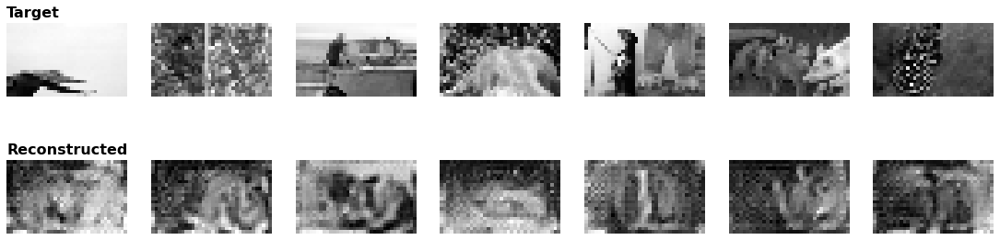

[44/600]
Training progress: [0/280 (0%)]  Loss: 0.060954
Training progress: [100/280 (36%)]  Loss: 0.045424
Training progress: [200/280 (71%)]  Loss: 0.040178
train_loss=0.0530


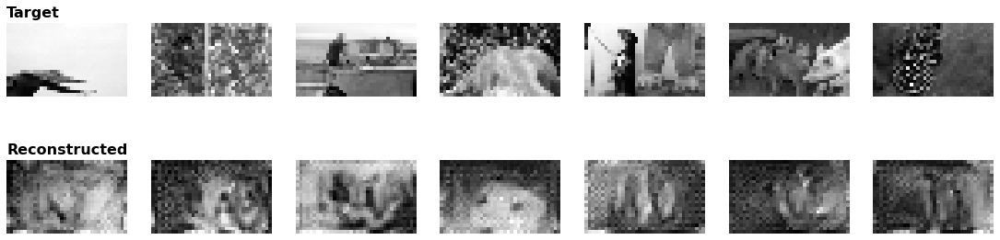

[45/600]
Training progress: [0/280 (0%)]  Loss: 0.066975
Training progress: [100/280 (36%)]  Loss: 0.038950
Training progress: [200/280 (71%)]  Loss: 0.035524
train_loss=0.0512


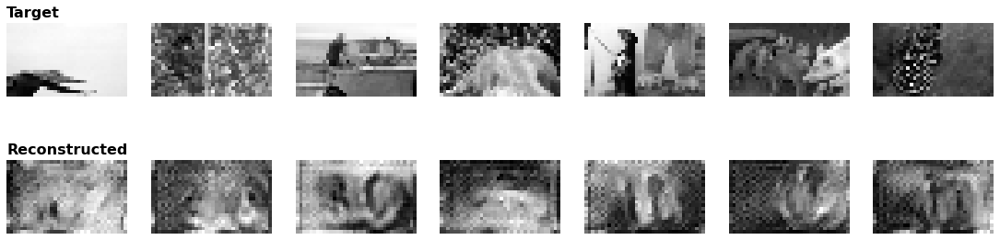

[46/600]
Training progress: [0/280 (0%)]  Loss: 0.041839
Training progress: [100/280 (36%)]  Loss: 0.037342
Training progress: [200/280 (71%)]  Loss: 0.037632
train_loss=0.0526


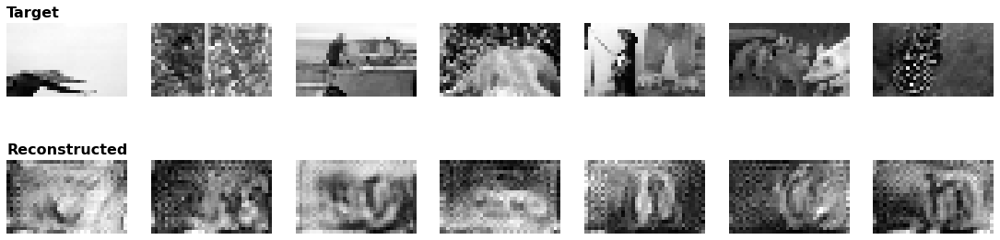

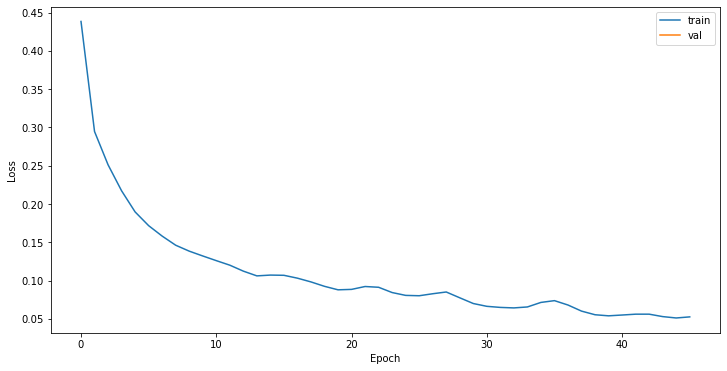

[47/600]
Training progress: [0/280 (0%)]  Loss: 0.039176
Training progress: [100/280 (36%)]  Loss: 0.037082
Training progress: [200/280 (71%)]  Loss: 0.043233
train_loss=0.0537


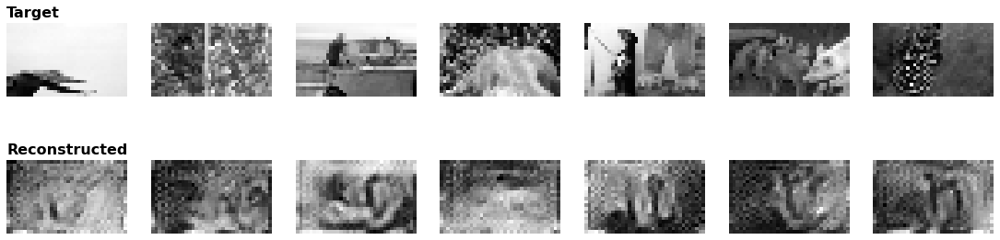

[48/600]
Training progress: [0/280 (0%)]  Loss: 0.038063
Training progress: [100/280 (36%)]  Loss: 0.040634
Training progress: [200/280 (71%)]  Loss: 0.043860
train_loss=0.0499


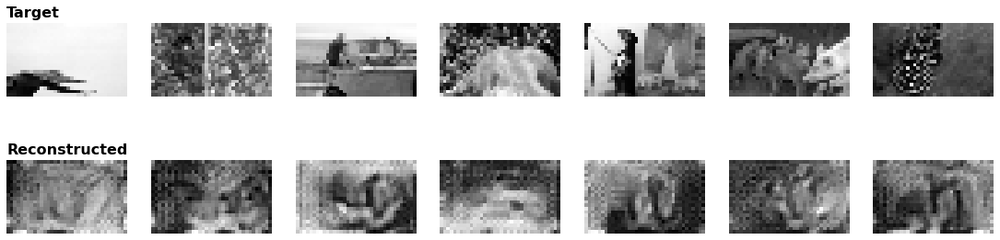

[49/600]
Training progress: [0/280 (0%)]  Loss: 0.034778
Training progress: [100/280 (36%)]  Loss: 0.042919
Training progress: [200/280 (71%)]  Loss: 0.041743
train_loss=0.0467


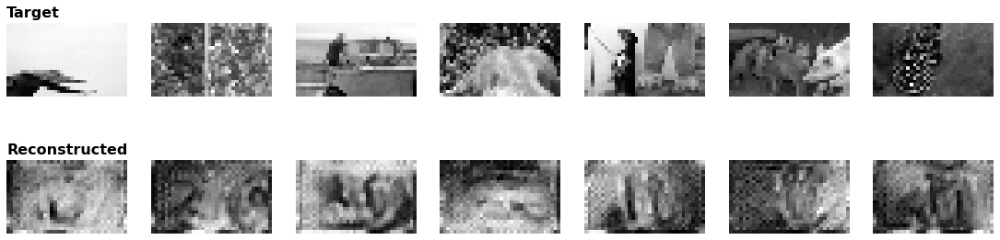

[50/600]
Training progress: [0/280 (0%)]  Loss: 0.038942
Training progress: [100/280 (36%)]  Loss: 0.042577
Training progress: [200/280 (71%)]  Loss: 0.042892
train_loss=0.0467


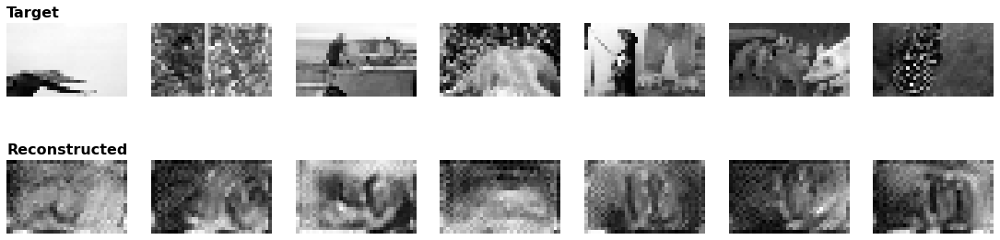

[51/600]
Training progress: [0/280 (0%)]  Loss: 0.044125
Training progress: [100/280 (36%)]  Loss: 0.039218
Training progress: [200/280 (71%)]  Loss: 0.034455
train_loss=0.0477


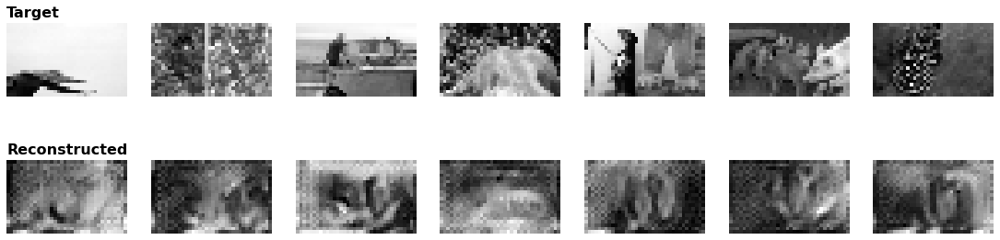

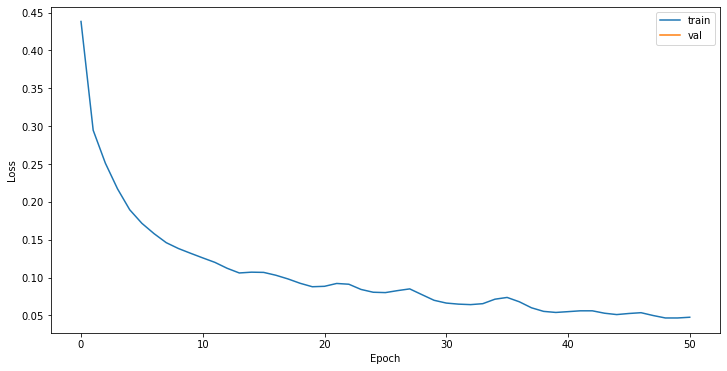

[52/600]
Training progress: [0/280 (0%)]  Loss: 0.042553
Training progress: [100/280 (36%)]  Loss: 0.047756
Training progress: [200/280 (71%)]  Loss: 0.037530
train_loss=0.0490


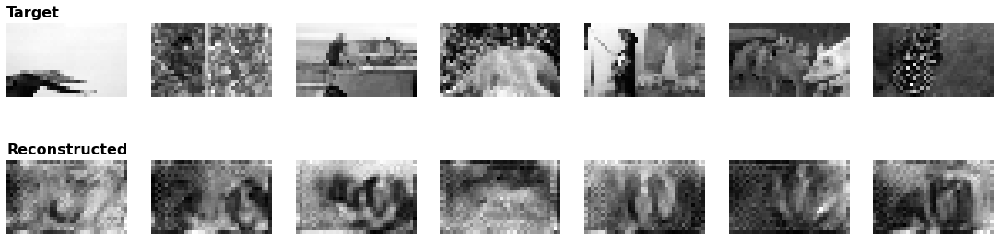

[53/600]
Training progress: [0/280 (0%)]  Loss: 0.049202
Training progress: [100/280 (36%)]  Loss: 0.043069
Training progress: [200/280 (71%)]  Loss: 0.042011
train_loss=0.0522


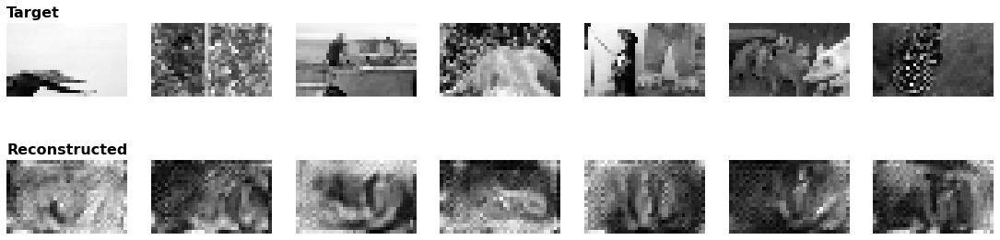

[54/600]
Training progress: [0/280 (0%)]  Loss: 0.056100
Training progress: [100/280 (36%)]  Loss: 0.045900
Training progress: [200/280 (71%)]  Loss: 0.032373
train_loss=0.0526


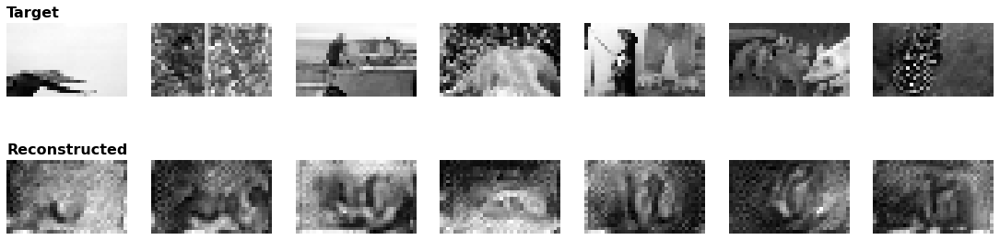

[55/600]
Training progress: [0/280 (0%)]  Loss: 0.044106
Training progress: [100/280 (36%)]  Loss: 0.040618
Training progress: [200/280 (71%)]  Loss: 0.039142
train_loss=0.0484


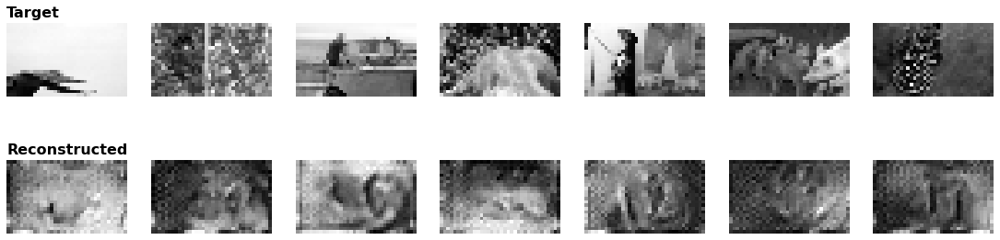

[56/600]
Training progress: [0/280 (0%)]  Loss: 0.035576
Training progress: [100/280 (36%)]  Loss: 0.040236
Training progress: [200/280 (71%)]  Loss: 0.037369
train_loss=0.0455


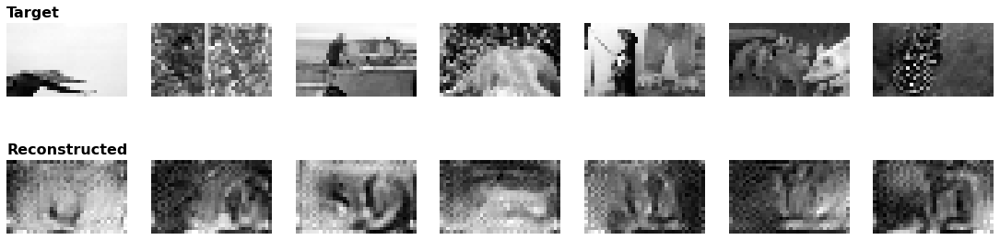

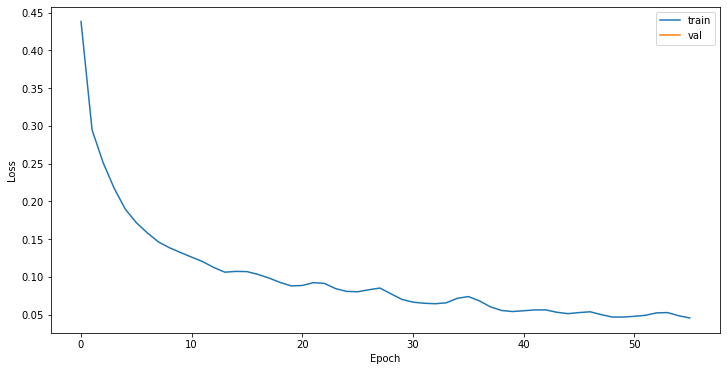

[57/600]
Training progress: [0/280 (0%)]  Loss: 0.034650
Training progress: [100/280 (36%)]  Loss: 0.042220
Training progress: [200/280 (71%)]  Loss: 0.036777
train_loss=0.0430


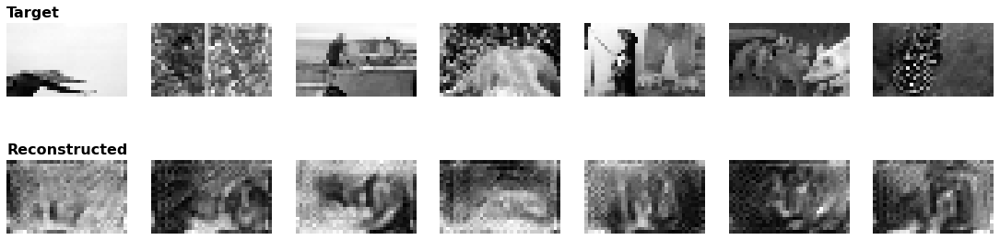

[58/600]
Training progress: [0/280 (0%)]  Loss: 0.034030
Training progress: [100/280 (36%)]  Loss: 0.034262
Training progress: [200/280 (71%)]  Loss: 0.035764
train_loss=0.0415


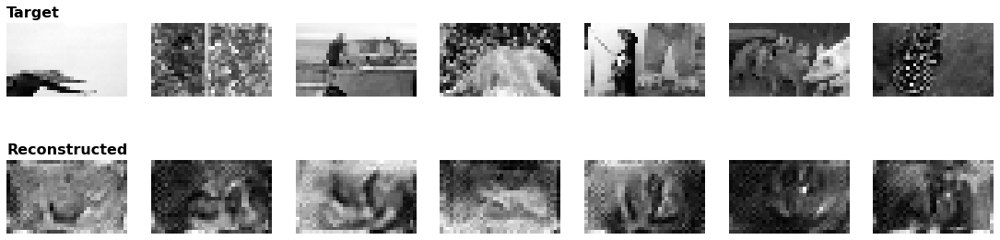

[59/600]
Training progress: [0/280 (0%)]  Loss: 0.032203
Training progress: [100/280 (36%)]  Loss: 0.033278
Training progress: [200/280 (71%)]  Loss: 0.036457
train_loss=0.0420


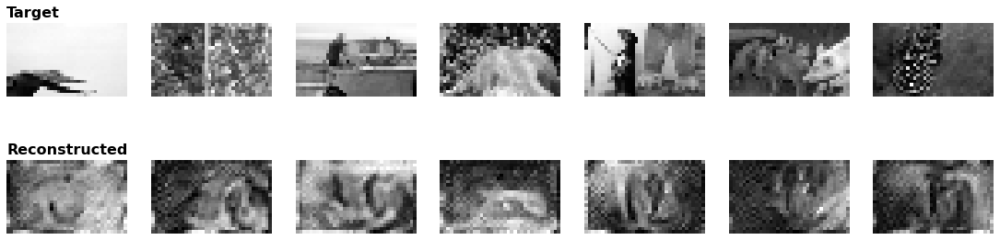

[60/600]
Training progress: [0/280 (0%)]  Loss: 0.037532
Training progress: [100/280 (36%)]  Loss: 0.037961
Training progress: [200/280 (71%)]  Loss: 0.034684
train_loss=0.0441


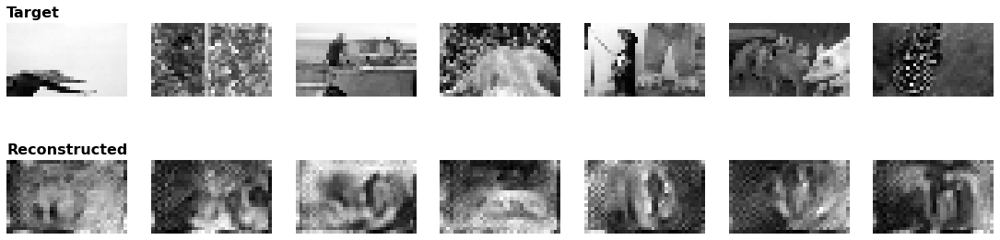

[61/600]
Training progress: [0/280 (0%)]  Loss: 0.033652
Training progress: [100/280 (36%)]  Loss: 0.051164
Training progress: [200/280 (71%)]  Loss: 0.036445
train_loss=0.0472


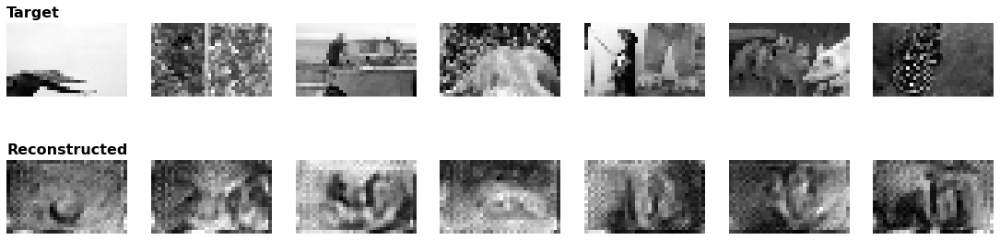

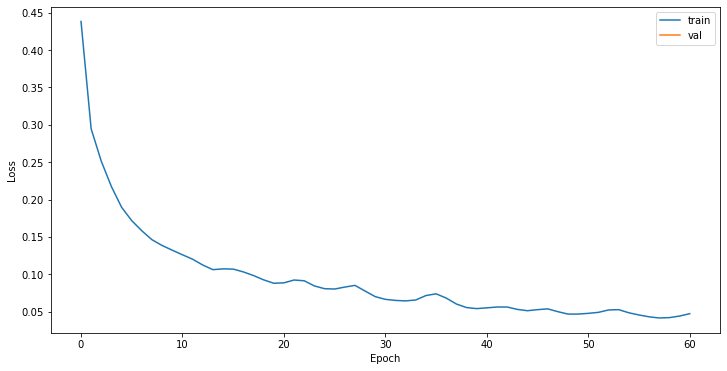

[62/600]
Training progress: [0/280 (0%)]  Loss: 0.047088
Training progress: [100/280 (36%)]  Loss: 0.035744
Training progress: [200/280 (71%)]  Loss: 0.050069
train_loss=0.0459


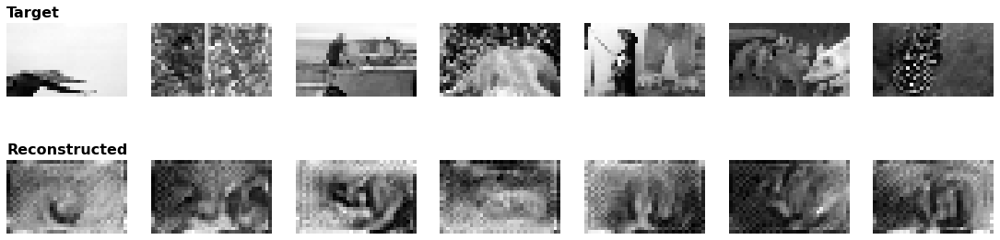

[63/600]
Training progress: [0/280 (0%)]  Loss: 0.045173
Training progress: [100/280 (36%)]  Loss: 0.032120
Training progress: [200/280 (71%)]  Loss: 0.036272
train_loss=0.0425


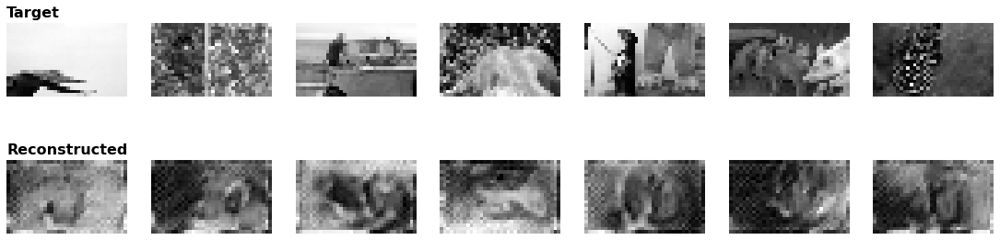

[64/600]
Training progress: [0/280 (0%)]  Loss: 0.044881
Training progress: [100/280 (36%)]  Loss: 0.031375
Training progress: [200/280 (71%)]  Loss: 0.030103
train_loss=0.0413


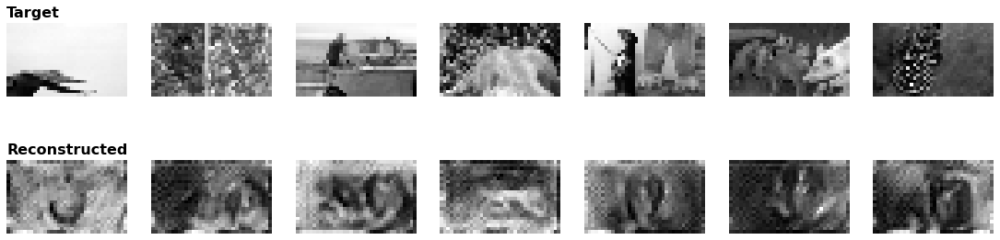

[65/600]
Training progress: [0/280 (0%)]  Loss: 0.035471
Training progress: [100/280 (36%)]  Loss: 0.033118
Training progress: [200/280 (71%)]  Loss: 0.035050
train_loss=0.0426


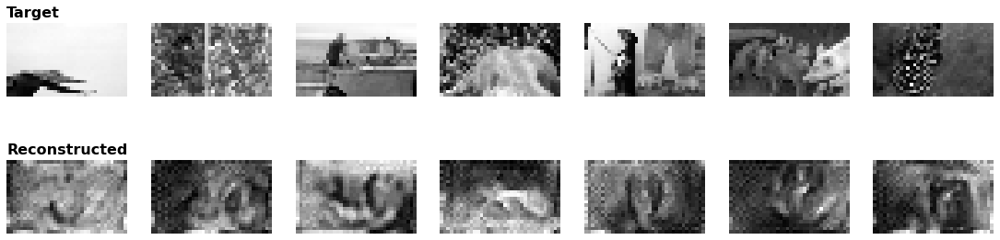

[66/600]
Training progress: [0/280 (0%)]  Loss: 0.039202
Training progress: [100/280 (36%)]  Loss: 0.031585
Training progress: [200/280 (71%)]  Loss: 0.034523
train_loss=0.0438


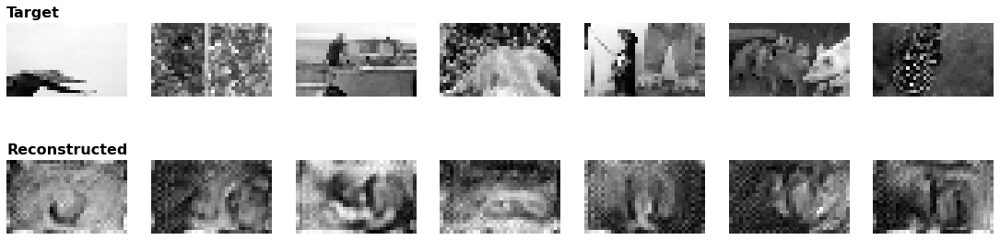

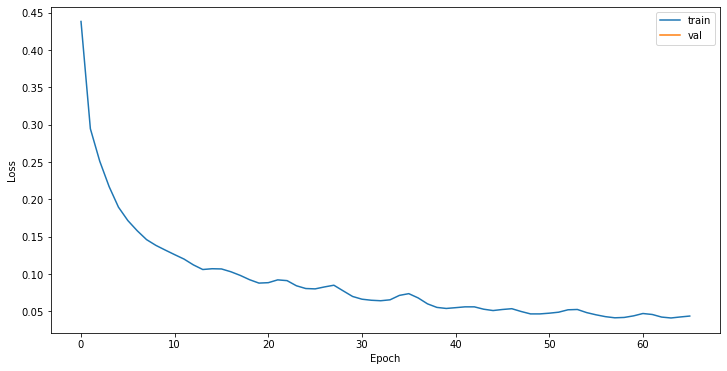

[67/600]
Training progress: [0/280 (0%)]  Loss: 0.042337
Training progress: [100/280 (36%)]  Loss: 0.044319
Training progress: [200/280 (71%)]  Loss: 0.032731
train_loss=0.0448


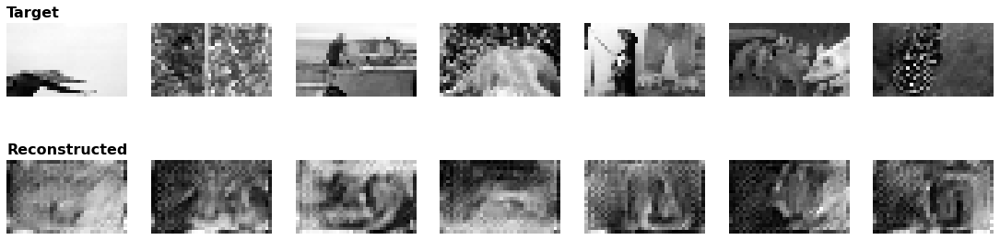

[68/600]
Training progress: [0/280 (0%)]  Loss: 0.036410
Training progress: [100/280 (36%)]  Loss: 0.035124
Training progress: [200/280 (71%)]  Loss: 0.034469
train_loss=0.0418


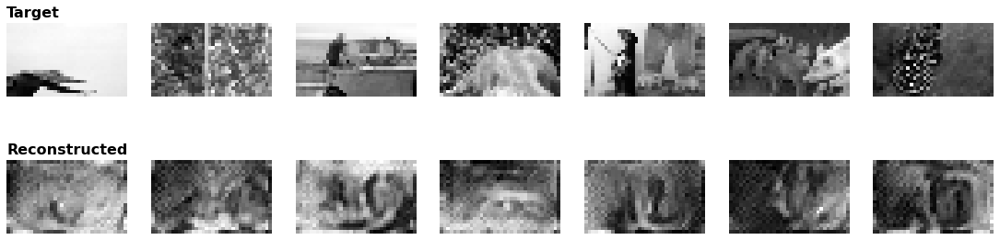

[69/600]
Training progress: [0/280 (0%)]  Loss: 0.036558
Training progress: [100/280 (36%)]  Loss: 0.038455
Training progress: [200/280 (71%)]  Loss: 0.030844
train_loss=0.0387


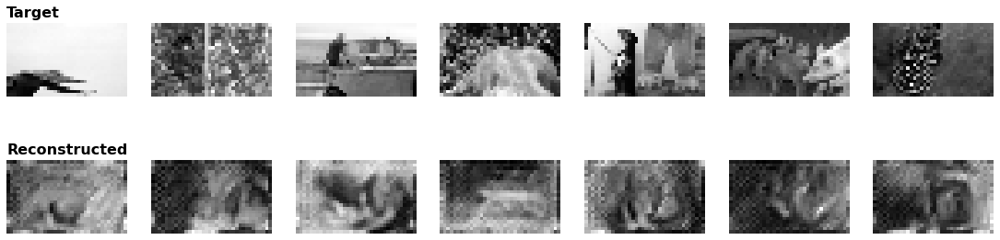

[70/600]
Training progress: [0/280 (0%)]  Loss: 0.033695
Training progress: [100/280 (36%)]  Loss: 0.034509
Training progress: [200/280 (71%)]  Loss: 0.030675
train_loss=0.0369


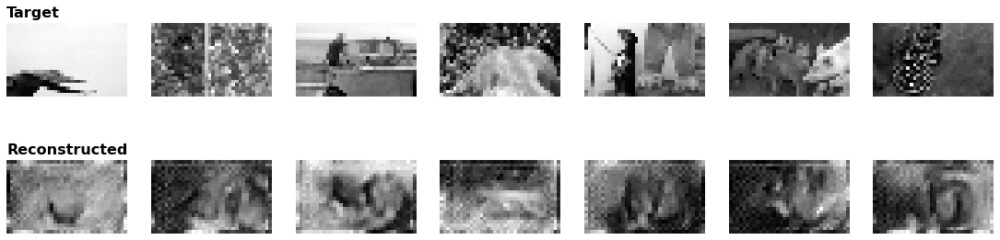

[71/600]
Training progress: [0/280 (0%)]  Loss: 0.034825
Training progress: [100/280 (36%)]  Loss: 0.028928
Training progress: [200/280 (71%)]  Loss: 0.032830
train_loss=0.0368


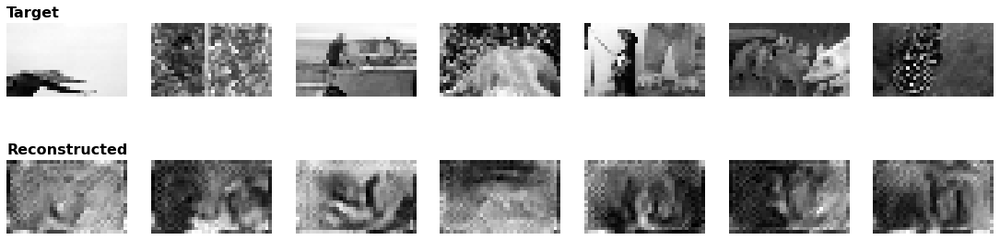

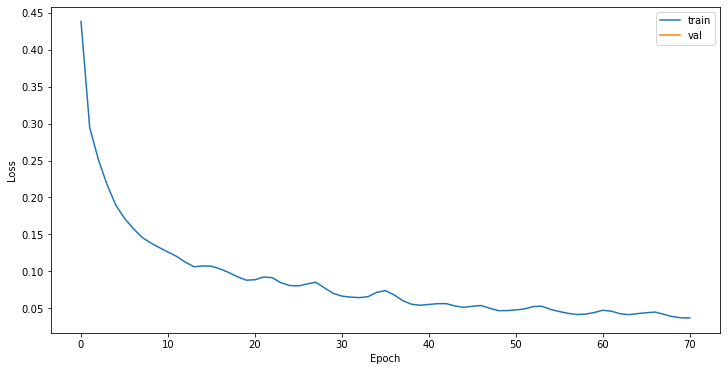

[72/600]
Training progress: [0/280 (0%)]  Loss: 0.034899
Training progress: [100/280 (36%)]  Loss: 0.028187
Training progress: [200/280 (71%)]  Loss: 0.057641
train_loss=0.0377


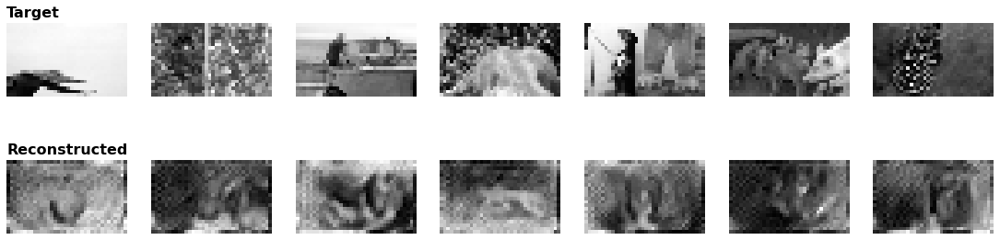

[73/600]
Training progress: [0/280 (0%)]  Loss: 0.033342
Training progress: [100/280 (36%)]  Loss: 0.030571
Training progress: [200/280 (71%)]  Loss: 0.033851
train_loss=0.0387


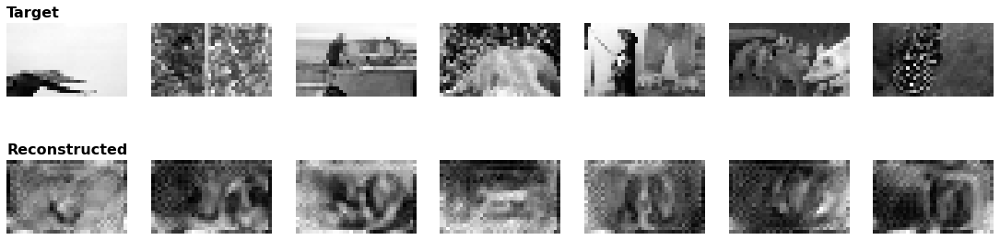

[74/600]
Training progress: [0/280 (0%)]  Loss: 0.034794
Training progress: [100/280 (36%)]  Loss: 0.028065
Training progress: [200/280 (71%)]  Loss: 0.034391
train_loss=0.0411


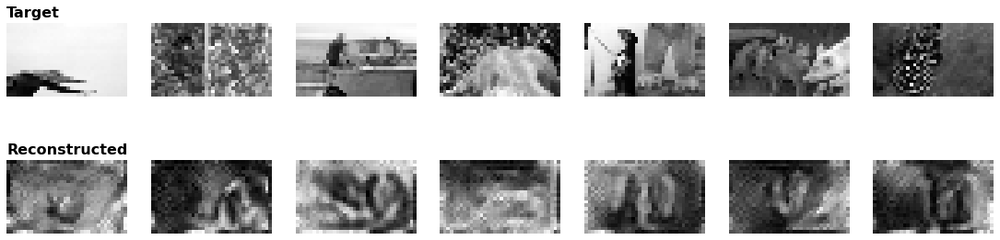

[75/600]
Training progress: [0/280 (0%)]  Loss: 0.038396
Training progress: [100/280 (36%)]  Loss: 0.036805
Training progress: [200/280 (71%)]  Loss: 0.040369
train_loss=0.0437


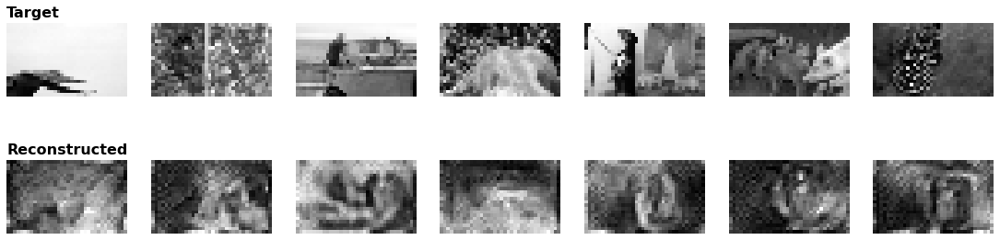

[76/600]
Training progress: [0/280 (0%)]  Loss: 0.048500
Training progress: [100/280 (36%)]  Loss: 0.037490
Training progress: [200/280 (71%)]  Loss: 0.036416
train_loss=0.0448


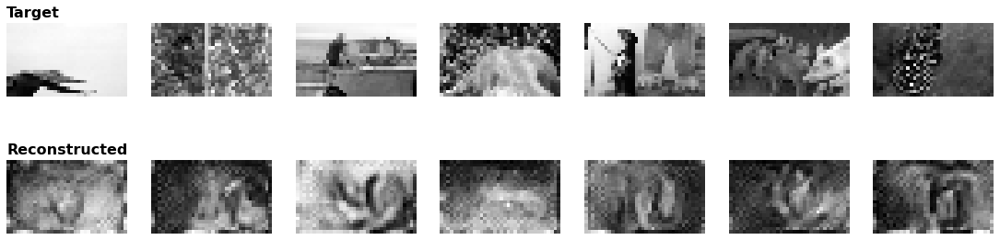

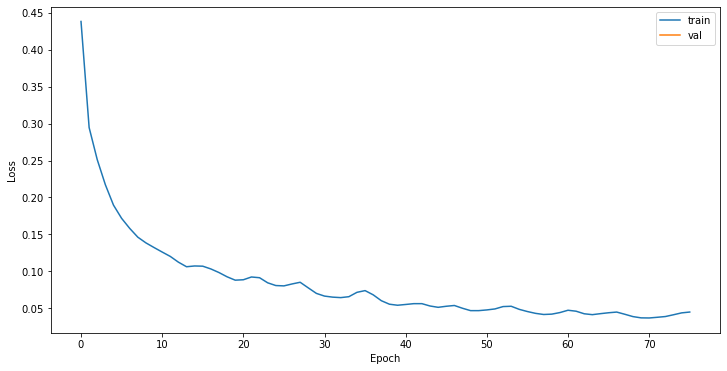

[77/600]
Training progress: [0/280 (0%)]  Loss: 0.033328
Training progress: [100/280 (36%)]  Loss: 0.038997
Training progress: [200/280 (71%)]  Loss: 0.052107
train_loss=0.0419


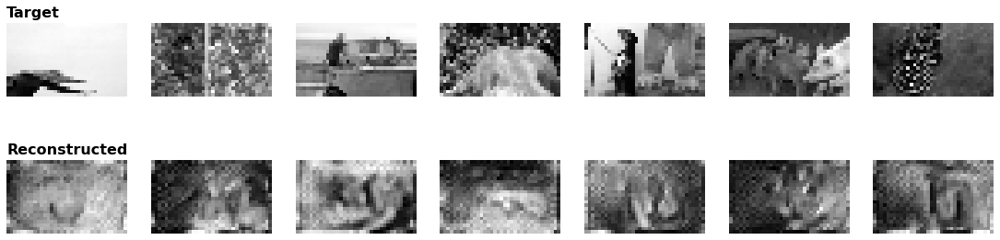

[78/600]
Training progress: [0/280 (0%)]  Loss: 0.031795
Training progress: [100/280 (36%)]  Loss: 0.037541
Training progress: [200/280 (71%)]  Loss: 0.032364
train_loss=0.0374


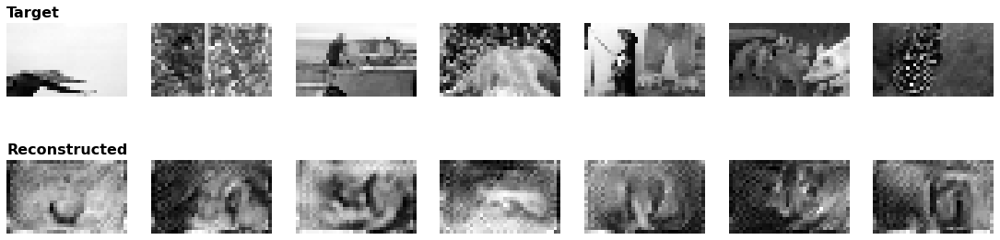

[79/600]
Training progress: [0/280 (0%)]  Loss: 0.031545
Training progress: [100/280 (36%)]  Loss: 0.028984
Training progress: [200/280 (71%)]  Loss: 0.026187
train_loss=0.0343


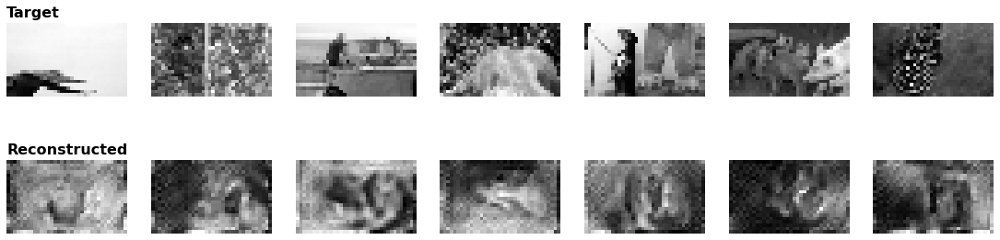

[80/600]
Training progress: [0/280 (0%)]  Loss: 0.025939
Training progress: [100/280 (36%)]  Loss: 0.028298
Training progress: [200/280 (71%)]  Loss: 0.032312
train_loss=0.0340


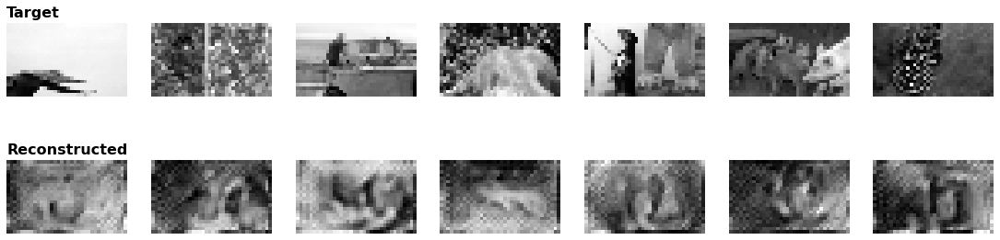

[81/600]
Training progress: [0/280 (0%)]  Loss: 0.026445
Training progress: [100/280 (36%)]  Loss: 0.032194
Training progress: [200/280 (71%)]  Loss: 0.029749
train_loss=0.0345


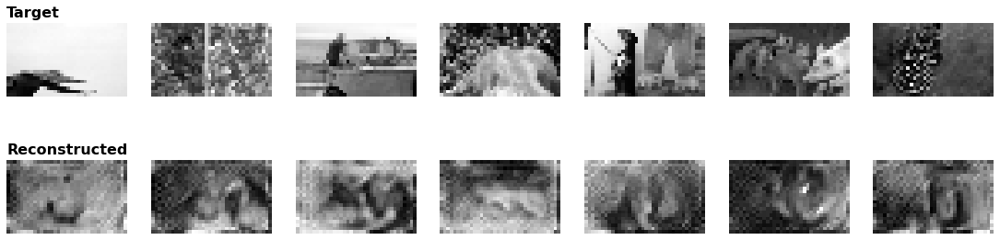

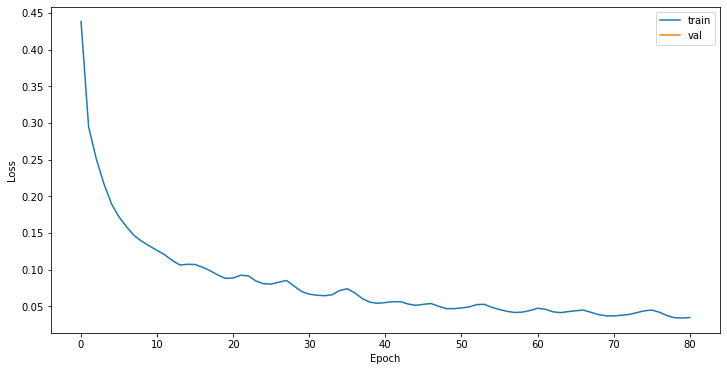

[82/600]
Training progress: [0/280 (0%)]  Loss: 0.034731
Training progress: [100/280 (36%)]  Loss: 0.033443
Training progress: [200/280 (71%)]  Loss: 0.031308
train_loss=0.0360


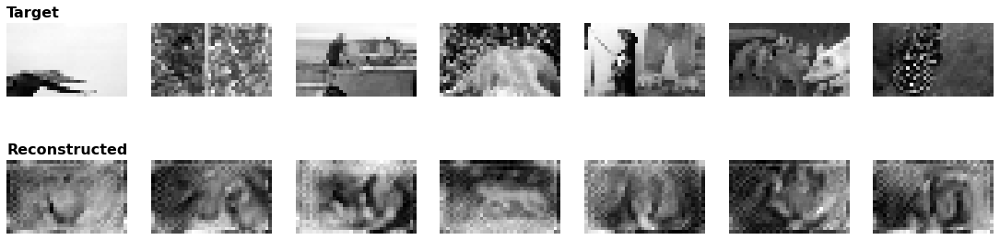

[83/600]
Training progress: [0/280 (0%)]  Loss: 0.036791
Training progress: [100/280 (36%)]  Loss: 0.034142
Training progress: [200/280 (71%)]  Loss: 0.033246
train_loss=0.0380


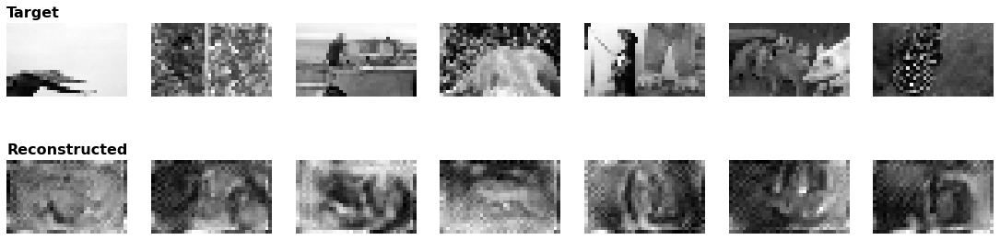

[84/600]
Training progress: [0/280 (0%)]  Loss: 0.031277
Training progress: [100/280 (36%)]  Loss: 0.036263
Training progress: [200/280 (71%)]  Loss: 0.036608
train_loss=0.0388


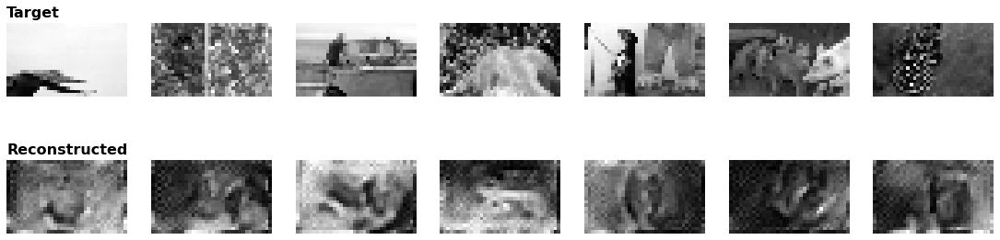

[85/600]
Training progress: [0/280 (0%)]  Loss: 0.028600
Training progress: [100/280 (36%)]  Loss: 0.033774
Training progress: [200/280 (71%)]  Loss: 0.029409
train_loss=0.0395


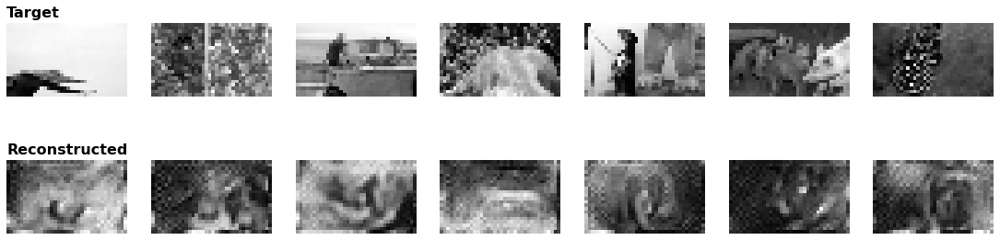

[86/600]
Training progress: [0/280 (0%)]  Loss: 0.031912
Training progress: [100/280 (36%)]  Loss: 0.039574
Training progress: [200/280 (71%)]  Loss: 0.032357
train_loss=0.0409


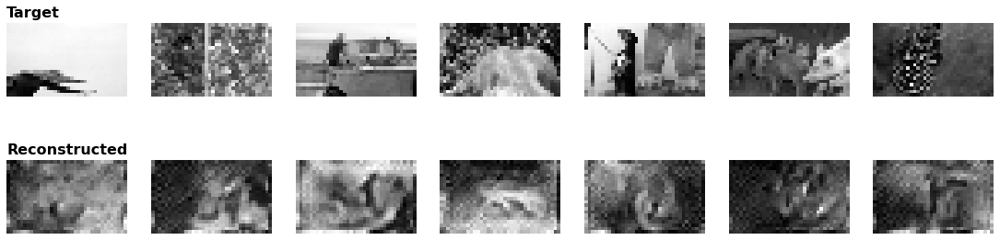

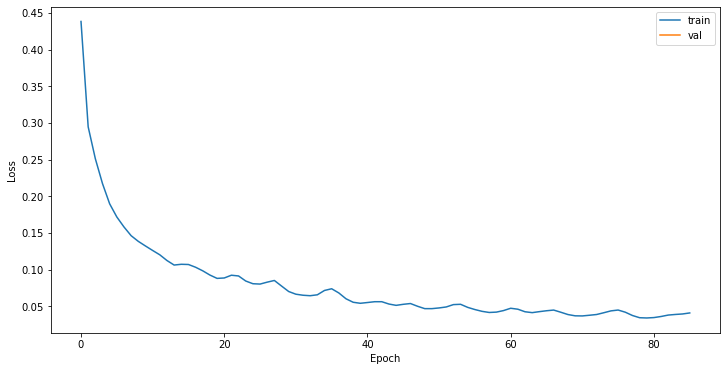

[87/600]
Training progress: [0/280 (0%)]  Loss: 0.032021
Training progress: [100/280 (36%)]  Loss: 0.030188
Training progress: [200/280 (71%)]  Loss: 0.028981
train_loss=0.0394


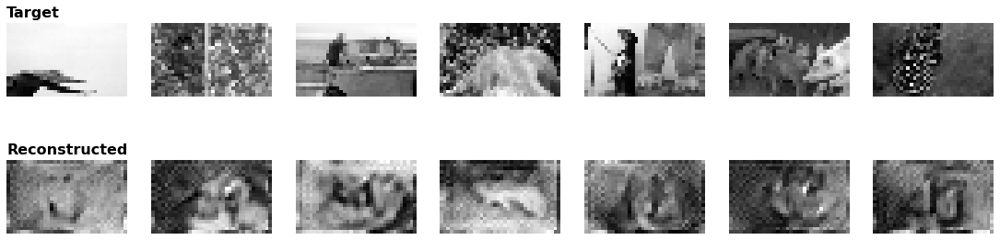

[88/600]
Training progress: [0/280 (0%)]  Loss: 0.033090
Training progress: [100/280 (36%)]  Loss: 0.026412
Training progress: [200/280 (71%)]  Loss: 0.030788
train_loss=0.0366


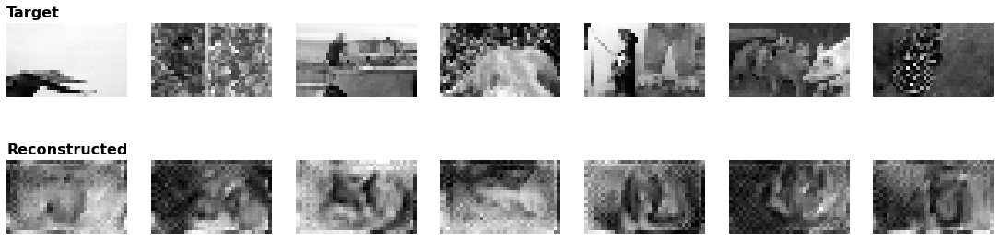

[89/600]
Training progress: [0/280 (0%)]  Loss: 0.042339
Training progress: [100/280 (36%)]  Loss: 0.028564
Training progress: [200/280 (71%)]  Loss: 0.026715
train_loss=0.0355


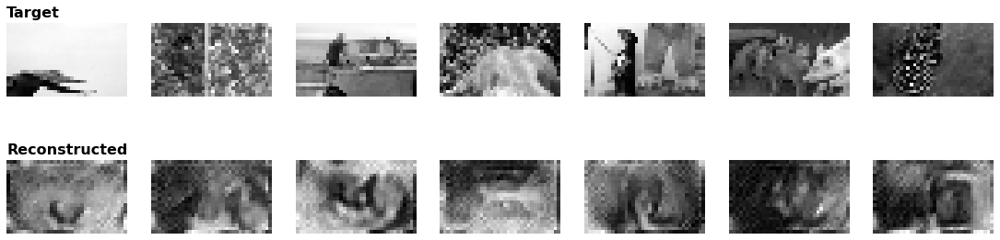

[90/600]
Training progress: [0/280 (0%)]  Loss: 0.032523
Training progress: [100/280 (36%)]  Loss: 0.028721
Training progress: [200/280 (71%)]  Loss: 0.026951
train_loss=0.0339


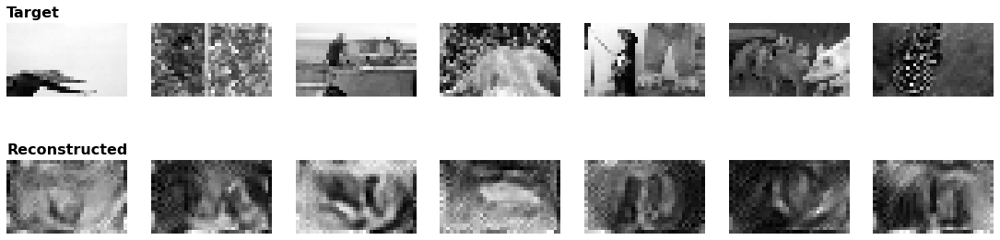

[91/600]
Training progress: [0/280 (0%)]  Loss: 0.034132
Training progress: [100/280 (36%)]  Loss: 0.027316
Training progress: [200/280 (71%)]  Loss: 0.025186
train_loss=0.0308


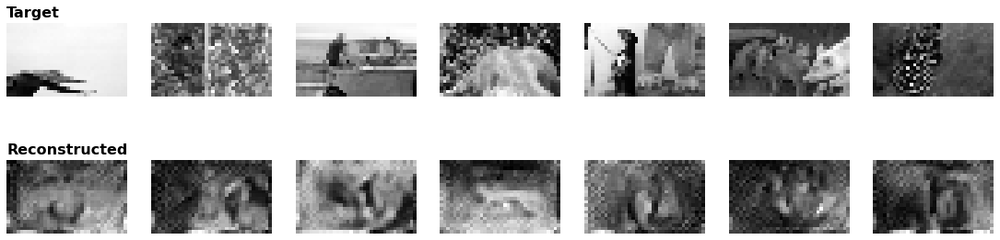

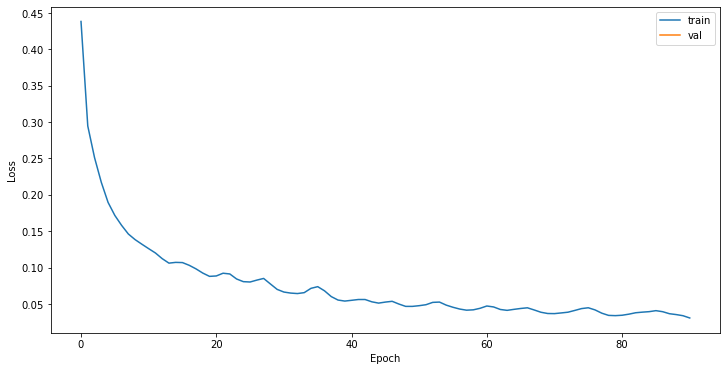

[92/600]
Training progress: [0/280 (0%)]  Loss: 0.036459
Training progress: [100/280 (36%)]  Loss: 0.028086
Training progress: [200/280 (71%)]  Loss: 0.023869
train_loss=0.0311


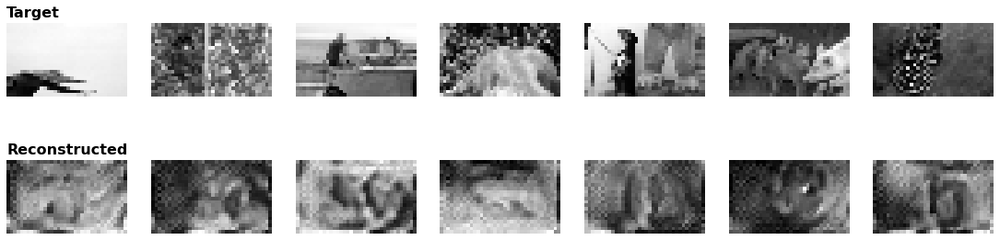

[93/600]
Training progress: [0/280 (0%)]  Loss: 0.025328
Training progress: [100/280 (36%)]  Loss: 0.024300
Training progress: [200/280 (71%)]  Loss: 0.023498
train_loss=0.0320


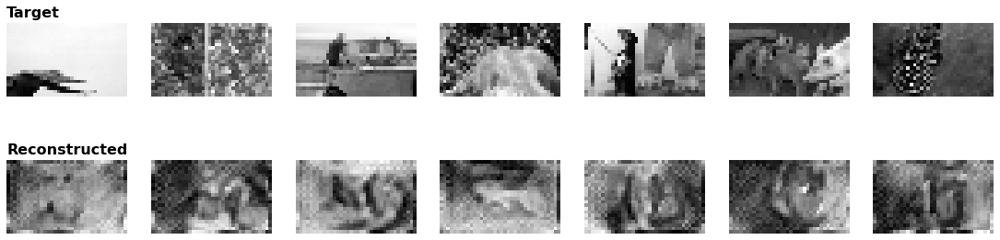

[94/600]
Training progress: [0/280 (0%)]  Loss: 0.028592
Training progress: [100/280 (36%)]  Loss: 0.025040
Training progress: [200/280 (71%)]  Loss: 0.024585
train_loss=0.0319


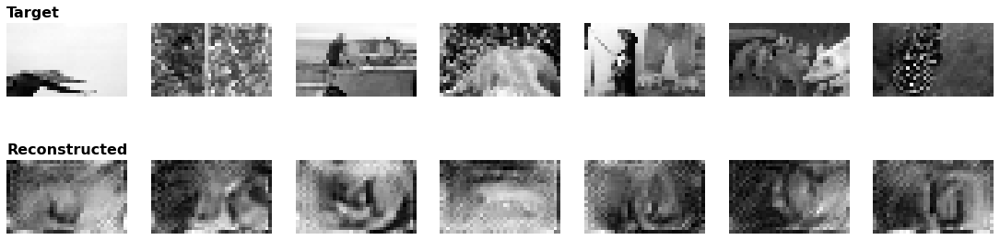

[95/600]
Training progress: [0/280 (0%)]  Loss: 0.027809
Training progress: [100/280 (36%)]  Loss: 0.028142
Training progress: [200/280 (71%)]  Loss: 0.026299
train_loss=0.0325


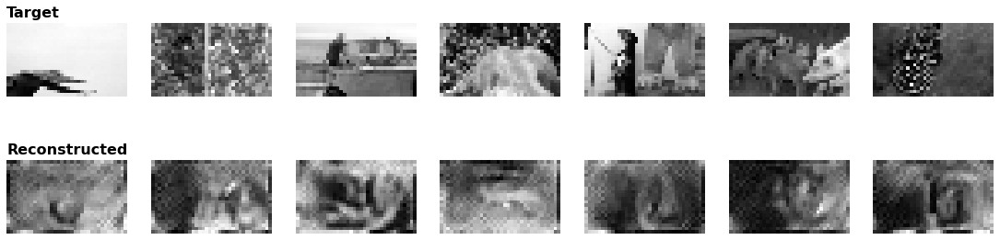

[96/600]
Training progress: [0/280 (0%)]  Loss: 0.027865
Training progress: [100/280 (36%)]  Loss: 0.031466
Training progress: [200/280 (71%)]  Loss: 0.029538
train_loss=0.0328


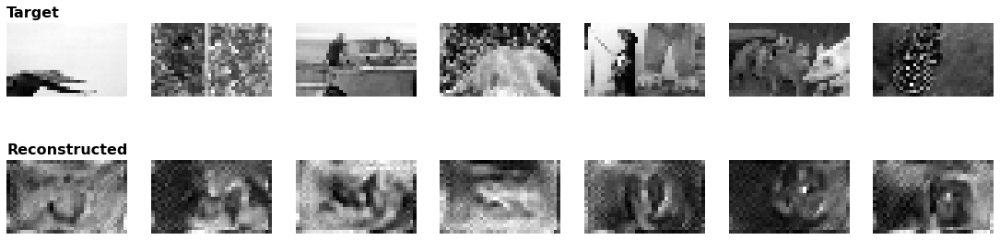

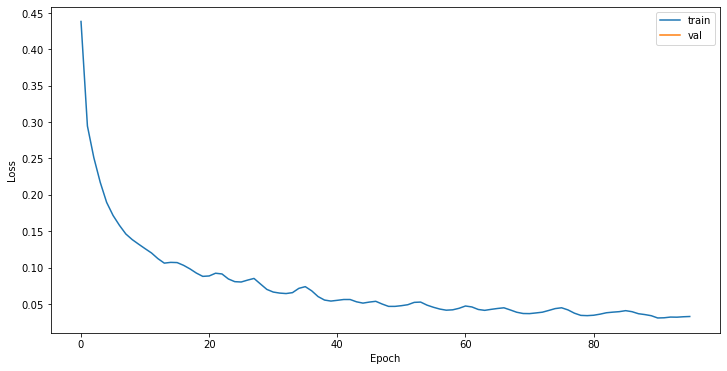

[97/600]
Training progress: [0/280 (0%)]  Loss: 0.026779
Training progress: [100/280 (36%)]  Loss: 0.030111
Training progress: [200/280 (71%)]  Loss: 0.031130
train_loss=0.0312


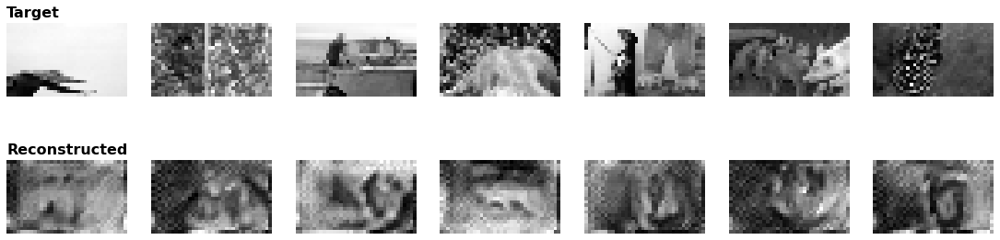

[98/600]
Training progress: [0/280 (0%)]  Loss: 0.022592
Training progress: [100/280 (36%)]  Loss: 0.023745
Training progress: [200/280 (71%)]  Loss: 0.028141
train_loss=0.0293


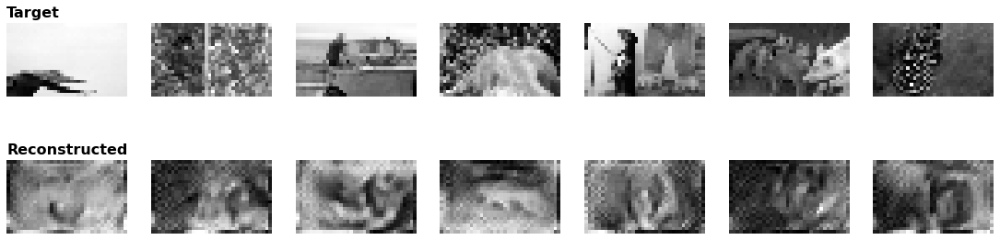

[99/600]
Training progress: [0/280 (0%)]  Loss: 0.025888
Training progress: [100/280 (36%)]  Loss: 0.025418
Training progress: [200/280 (71%)]  Loss: 0.030268
train_loss=0.0302


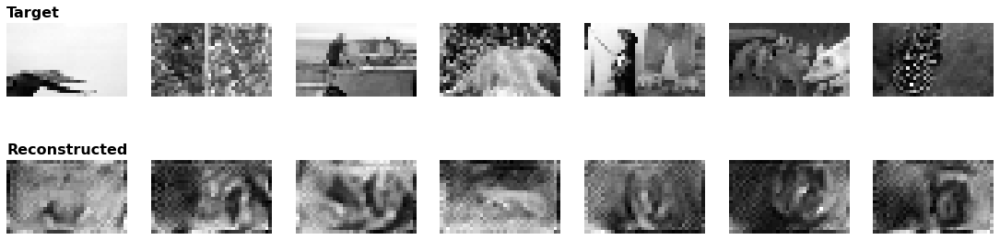

[100/600]
Training progress: [0/280 (0%)]  Loss: 0.028333
Training progress: [100/280 (36%)]  Loss: 0.025881
Training progress: [200/280 (71%)]  Loss: 0.025857
train_loss=0.0309


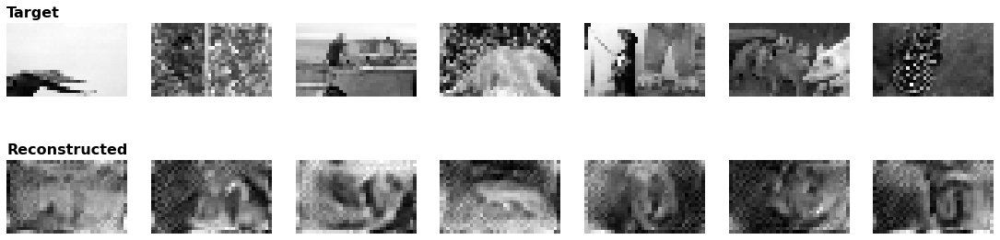

[101/600]
Training progress: [0/280 (0%)]  Loss: 0.024647
Training progress: [100/280 (36%)]  Loss: 0.026798
Training progress: [200/280 (71%)]  Loss: 0.024258
train_loss=0.0300


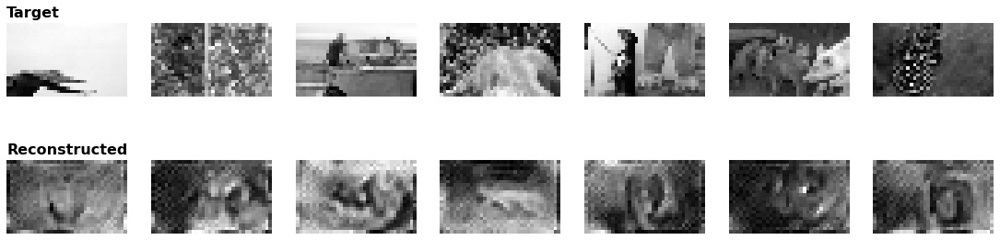

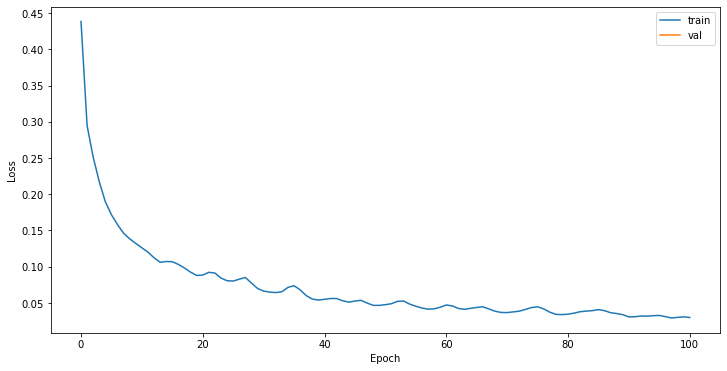

[102/600]
Training progress: [0/280 (0%)]  Loss: 0.025647
Training progress: [100/280 (36%)]  Loss: 0.024950
Training progress: [200/280 (71%)]  Loss: 0.022384
train_loss=0.0284


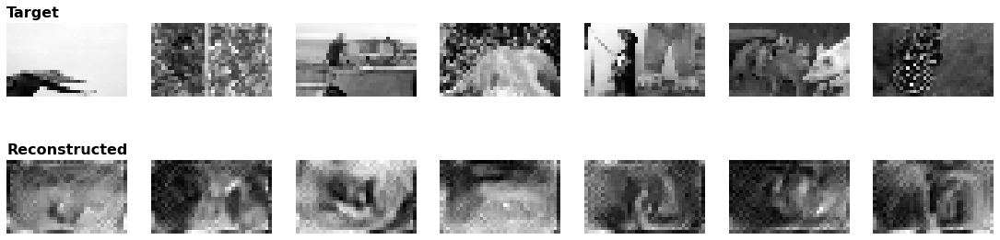

[103/600]
Training progress: [0/280 (0%)]  Loss: 0.029324
Training progress: [100/280 (36%)]  Loss: 0.023475
Training progress: [200/280 (71%)]  Loss: 0.020556
train_loss=0.0275


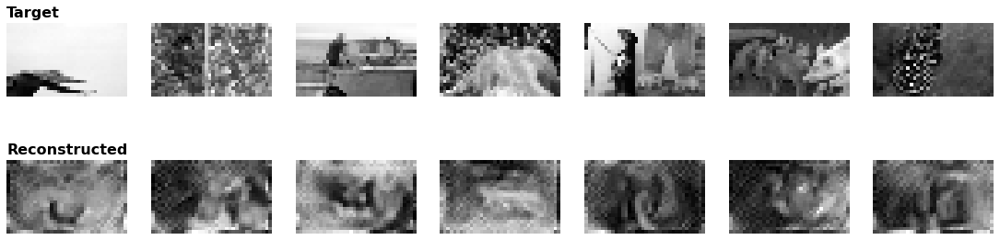

[104/600]
Training progress: [0/280 (0%)]  Loss: 0.027703
Training progress: [100/280 (36%)]  Loss: 0.027419
Training progress: [200/280 (71%)]  Loss: 0.021813
train_loss=0.0277


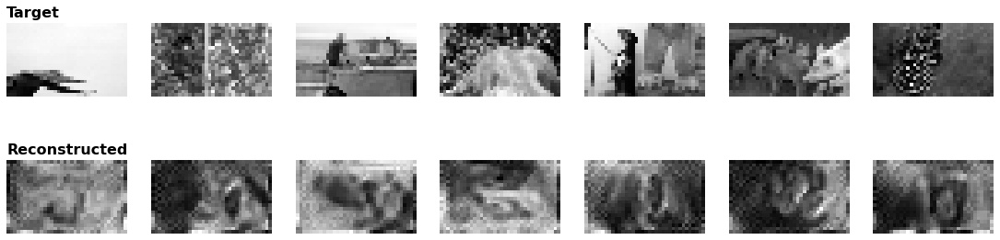

[105/600]
Training progress: [0/280 (0%)]  Loss: 0.028617
Training progress: [100/280 (36%)]  Loss: 0.023461
Training progress: [200/280 (71%)]  Loss: 0.020670
train_loss=0.0277


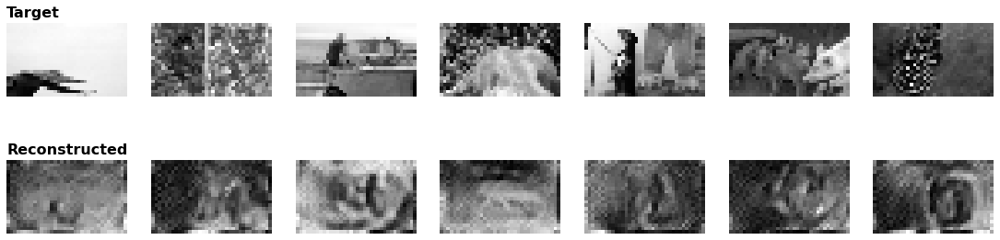

[106/600]
Training progress: [0/280 (0%)]  Loss: 0.026280
Training progress: [100/280 (36%)]  Loss: 0.028459
Training progress: [200/280 (71%)]  Loss: 0.024985
train_loss=0.0289


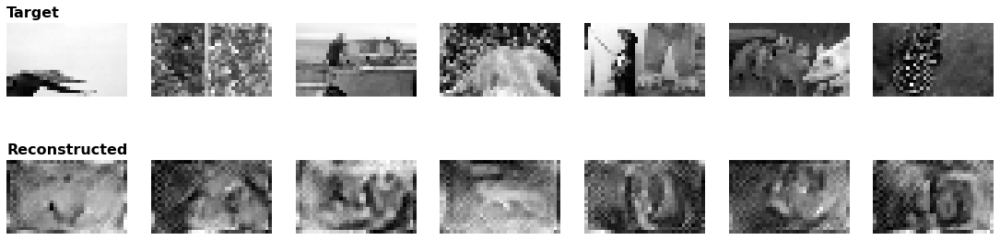

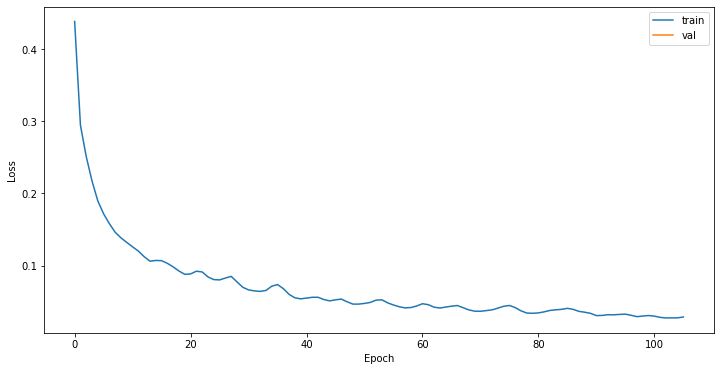

[107/600]
Training progress: [0/280 (0%)]  Loss: 0.022843
Training progress: [100/280 (36%)]  Loss: 0.026016
Training progress: [200/280 (71%)]  Loss: 0.028903
train_loss=0.0300


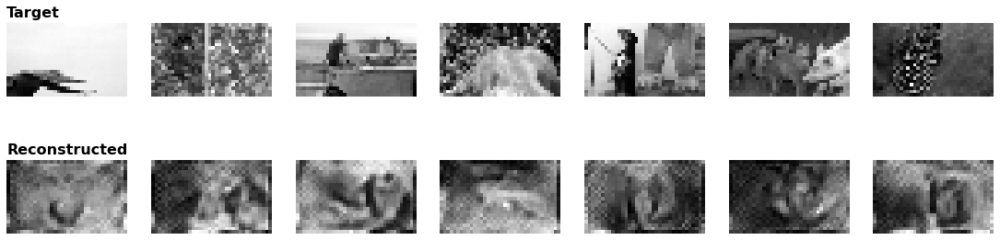

[108/600]
Training progress: [0/280 (0%)]  Loss: 0.022038
Training progress: [100/280 (36%)]  Loss: 0.025733
Training progress: [200/280 (71%)]  Loss: 0.031455
train_loss=0.0295


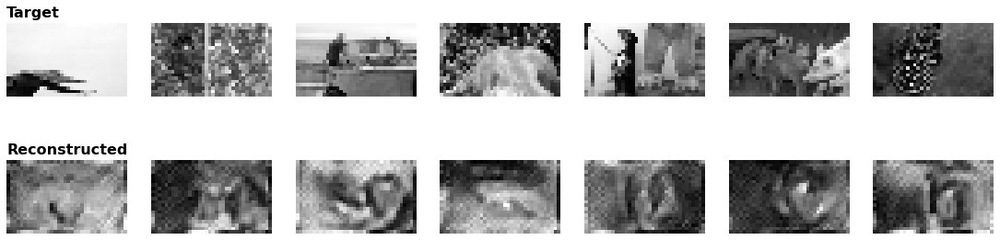

[109/600]
Training progress: [0/280 (0%)]  Loss: 0.020299
Training progress: [100/280 (36%)]  Loss: 0.028679
Training progress: [200/280 (71%)]  Loss: 0.024229
train_loss=0.0287


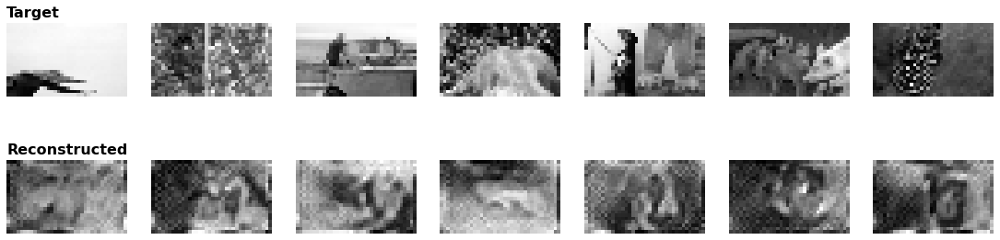

[110/600]
Training progress: [0/280 (0%)]  Loss: 0.018490
Training progress: [100/280 (36%)]  Loss: 0.028563
Training progress: [200/280 (71%)]  Loss: 0.019728
train_loss=0.0281


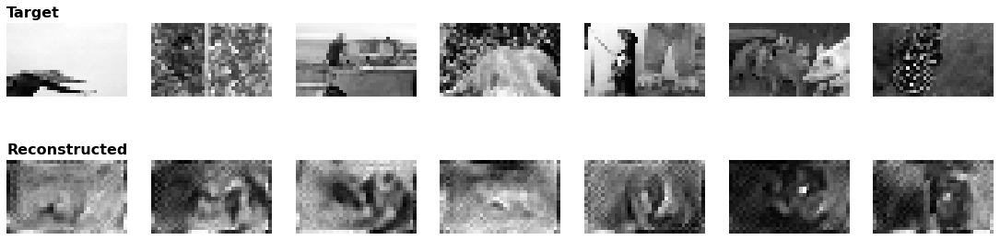

[111/600]
Training progress: [0/280 (0%)]  Loss: 0.023053
Training progress: [100/280 (36%)]  Loss: 0.027555
Training progress: [200/280 (71%)]  Loss: 0.019699
train_loss=0.0274


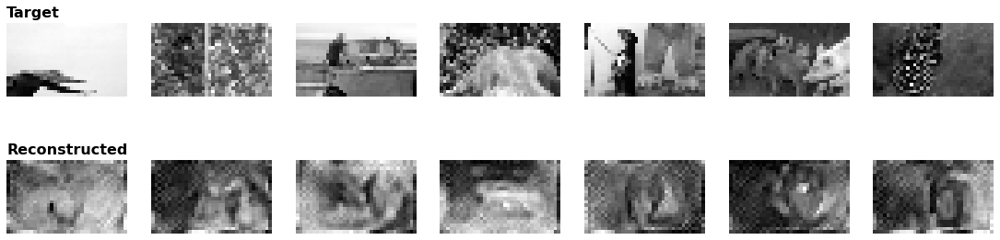

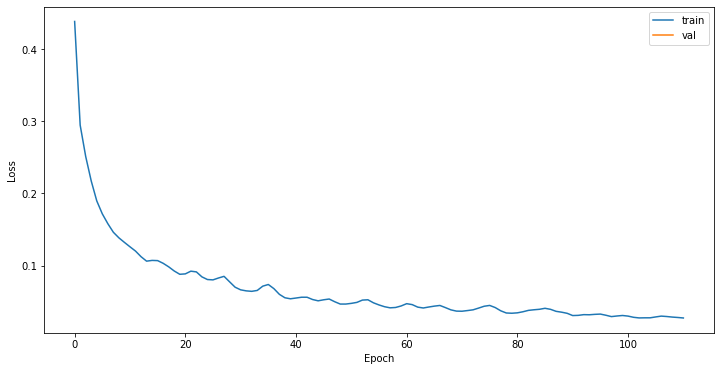

[112/600]
Training progress: [0/280 (0%)]  Loss: 0.024179
Training progress: [100/280 (36%)]  Loss: 0.027451
Training progress: [200/280 (71%)]  Loss: 0.019814
train_loss=0.0268


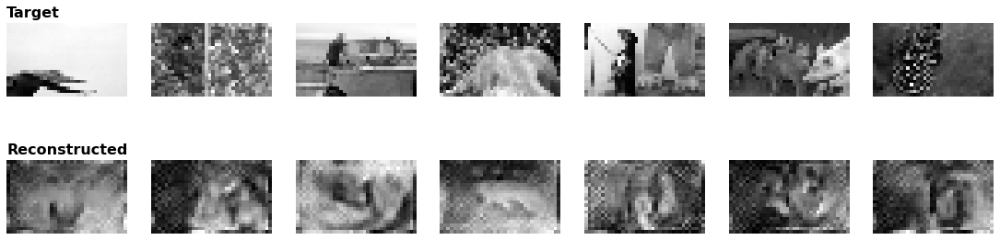

[113/600]
Training progress: [0/280 (0%)]  Loss: 0.025402
Training progress: [100/280 (36%)]  Loss: 0.028281
Training progress: [200/280 (71%)]  Loss: 0.021178
train_loss=0.0268


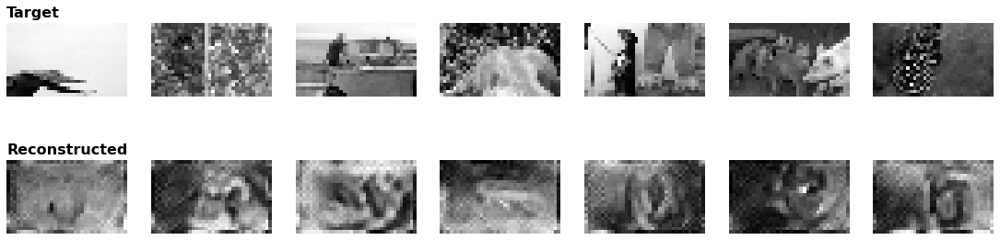

[114/600]
Training progress: [0/280 (0%)]  Loss: 0.023528
Training progress: [100/280 (36%)]  Loss: 0.025376
Training progress: [200/280 (71%)]  Loss: 0.025620
train_loss=0.0274


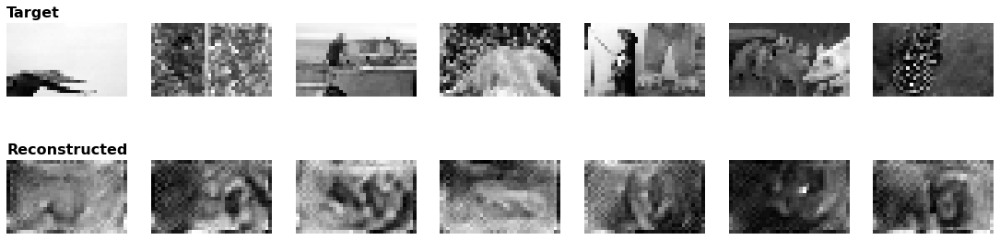

[115/600]
Training progress: [0/280 (0%)]  Loss: 0.023786
Training progress: [100/280 (36%)]  Loss: 0.021122
Training progress: [200/280 (71%)]  Loss: 0.024784
train_loss=0.0281


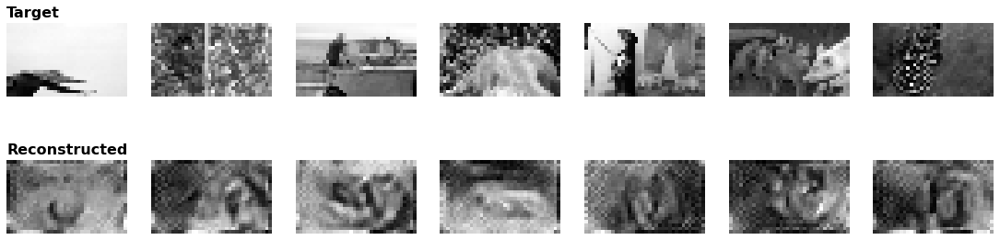

[116/600]
Training progress: [0/280 (0%)]  Loss: 0.020576
Training progress: [100/280 (36%)]  Loss: 0.021919
Training progress: [200/280 (71%)]  Loss: 0.040673
train_loss=0.0289


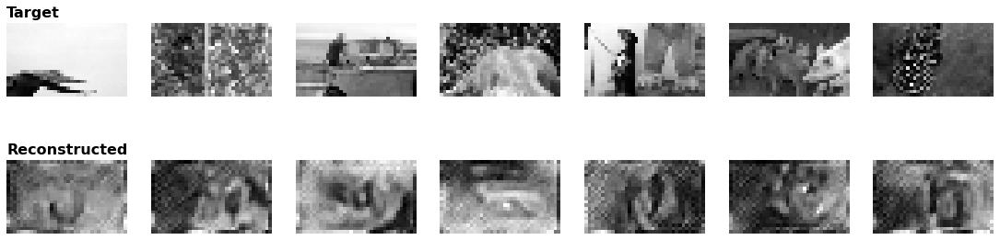

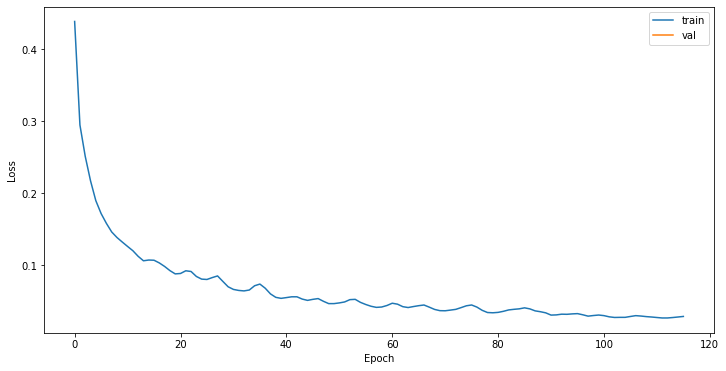

[117/600]
Training progress: [0/280 (0%)]  Loss: 0.021299
Training progress: [100/280 (36%)]  Loss: 0.020614
Training progress: [200/280 (71%)]  Loss: 0.027674
train_loss=0.0275


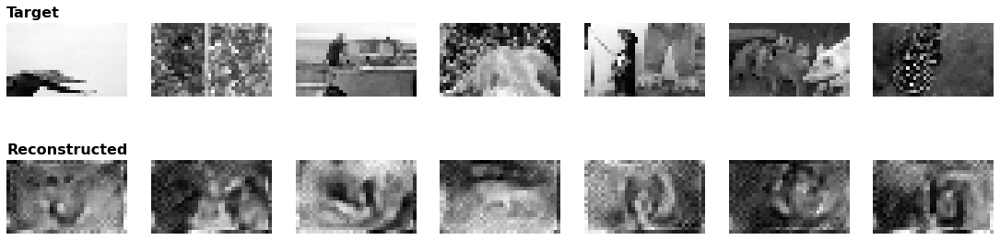

[118/600]
Training progress: [0/280 (0%)]  Loss: 0.023943
Training progress: [100/280 (36%)]  Loss: 0.020417
Training progress: [200/280 (71%)]  Loss: 0.021224
train_loss=0.0260


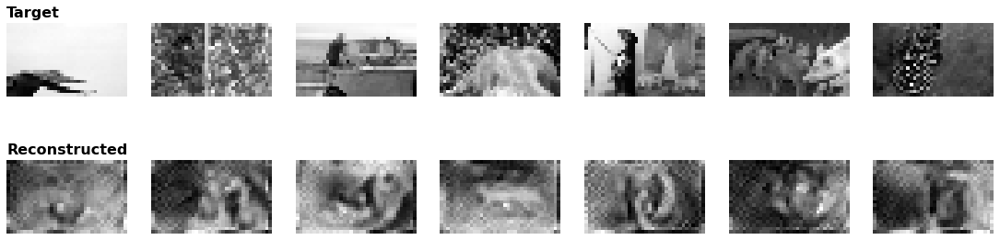

[119/600]
Training progress: [0/280 (0%)]  Loss: 0.024823
Training progress: [100/280 (36%)]  Loss: 0.021231
Training progress: [200/280 (71%)]  Loss: 0.021623
train_loss=0.0246


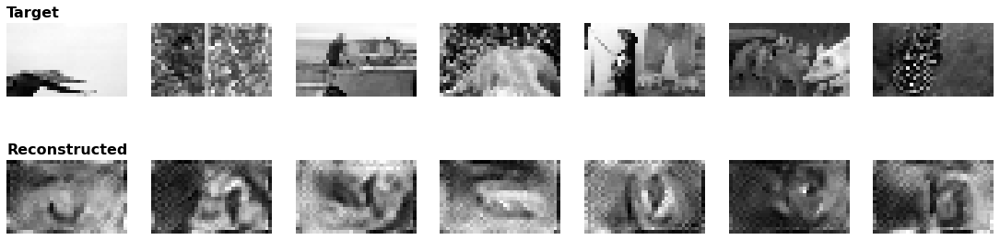

[120/600]
Training progress: [0/280 (0%)]  Loss: 0.026674
Training progress: [100/280 (36%)]  Loss: 0.020684
Training progress: [200/280 (71%)]  Loss: 0.021514
train_loss=0.0243


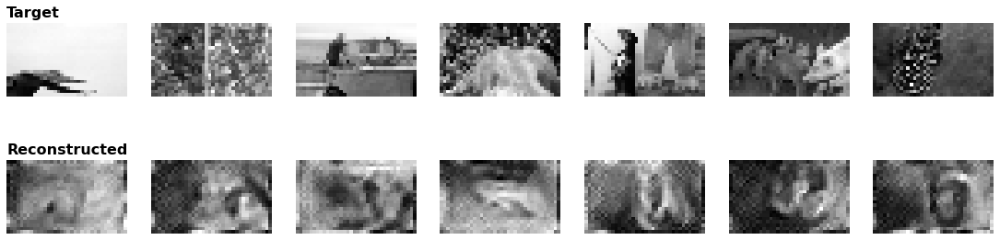

[121/600]
Training progress: [0/280 (0%)]  Loss: 0.022481
Training progress: [100/280 (36%)]  Loss: 0.026975
Training progress: [200/280 (71%)]  Loss: 0.022039
train_loss=0.0250


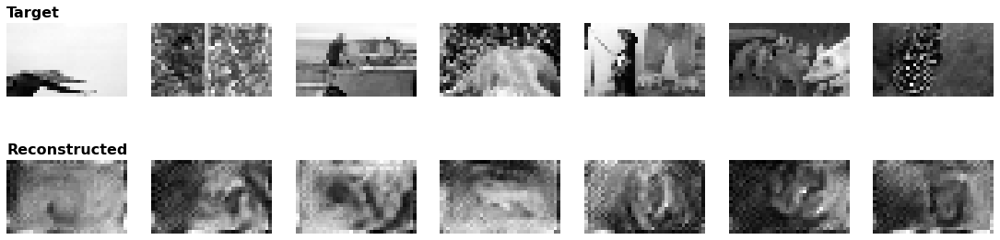

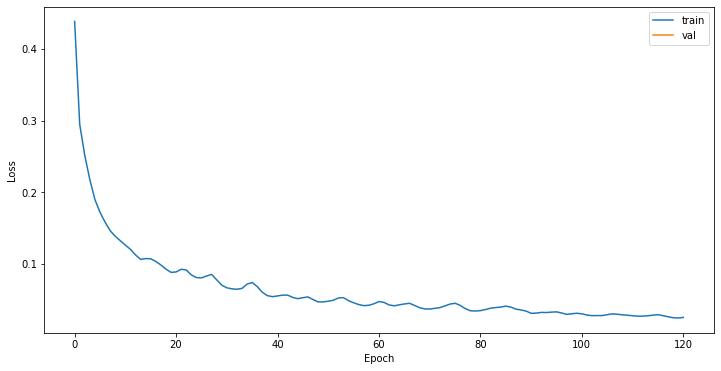

[122/600]
Training progress: [0/280 (0%)]  Loss: 0.022273
Training progress: [100/280 (36%)]  Loss: 0.021722
Training progress: [200/280 (71%)]  Loss: 0.022062
train_loss=0.0260


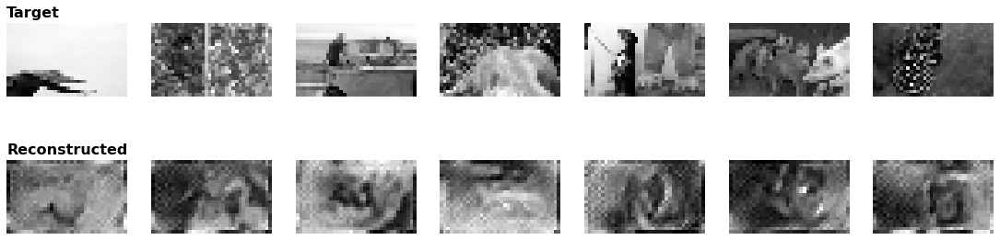

[123/600]
Training progress: [0/280 (0%)]  Loss: 0.027699
Training progress: [100/280 (36%)]  Loss: 0.026203
Training progress: [200/280 (71%)]  Loss: 0.021635
train_loss=0.0258


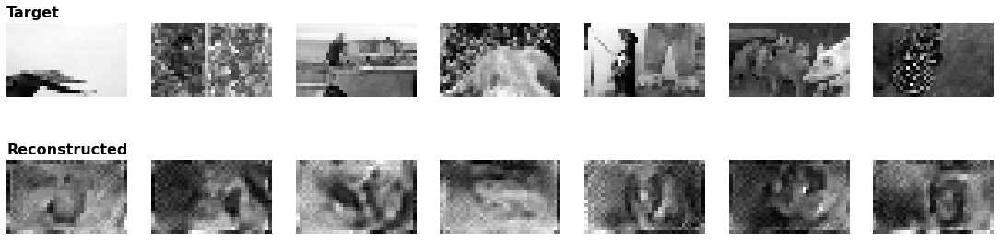

[124/600]
Training progress: [0/280 (0%)]  Loss: 0.023367
Training progress: [100/280 (36%)]  Loss: 0.020510
Training progress: [200/280 (71%)]  Loss: 0.020393
train_loss=0.0250


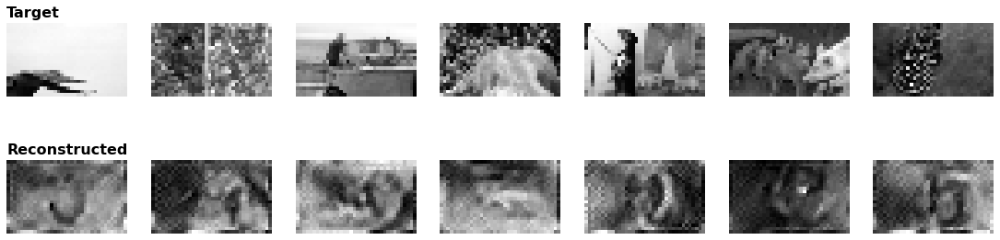

[125/600]
Training progress: [0/280 (0%)]  Loss: 0.019941
Training progress: [100/280 (36%)]  Loss: 0.023284
Training progress: [200/280 (71%)]  Loss: 0.019007
train_loss=0.0239


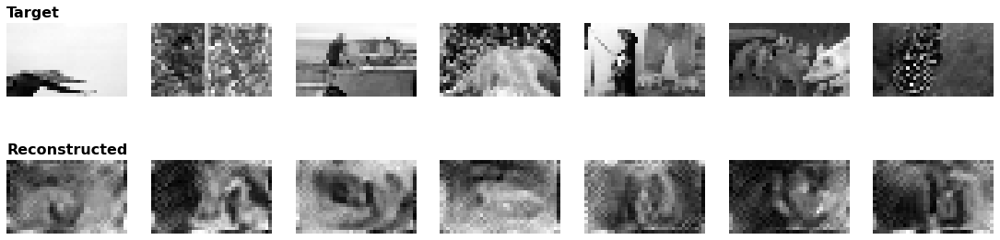

[126/600]
Training progress: [0/280 (0%)]  Loss: 0.019910
Training progress: [100/280 (36%)]  Loss: 0.020447
Training progress: [200/280 (71%)]  Loss: 0.018381
train_loss=0.0238


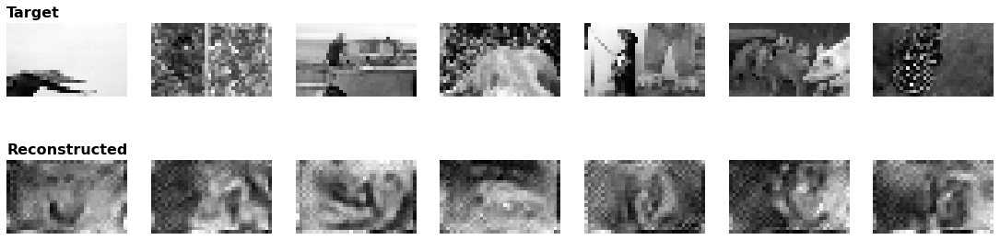

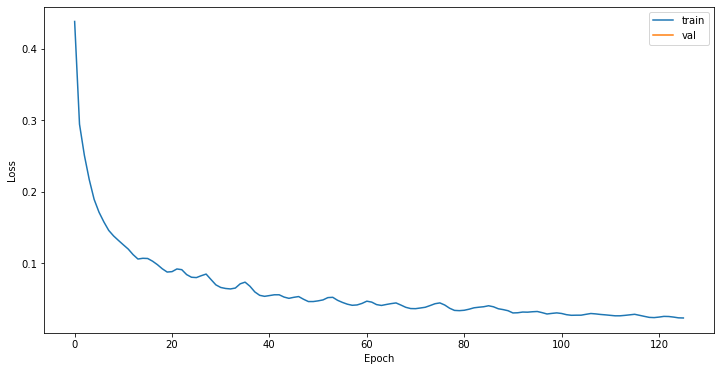

[127/600]
Training progress: [0/280 (0%)]  Loss: 0.020757
Training progress: [100/280 (36%)]  Loss: 0.028748
Training progress: [200/280 (71%)]  Loss: 0.020167
train_loss=0.0255


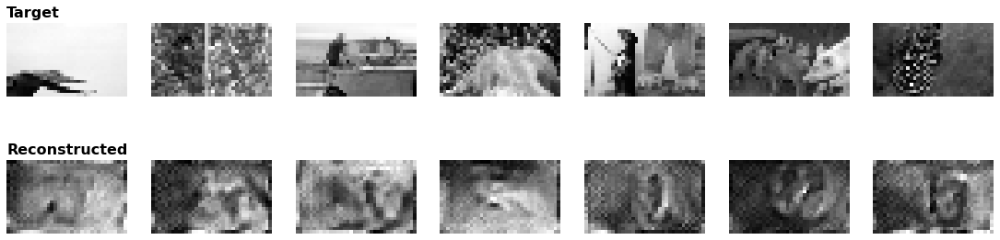

[128/600]
Training progress: [0/280 (0%)]  Loss: 0.024286
Training progress: [100/280 (36%)]  Loss: 0.026367
Training progress: [200/280 (71%)]  Loss: 0.019348
train_loss=0.0261


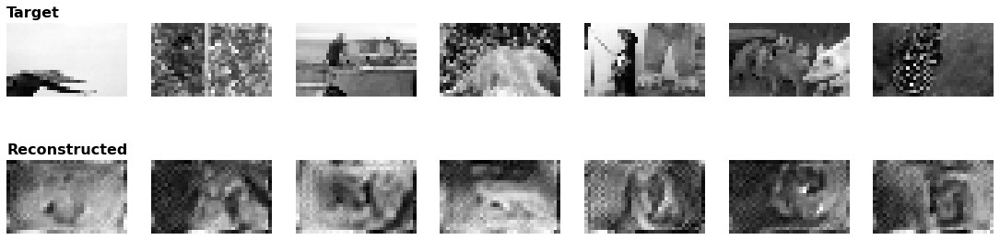

[129/600]
Training progress: [0/280 (0%)]  Loss: 0.022050
Training progress: [100/280 (36%)]  Loss: 0.024745
Training progress: [200/280 (71%)]  Loss: 0.019860
train_loss=0.0248


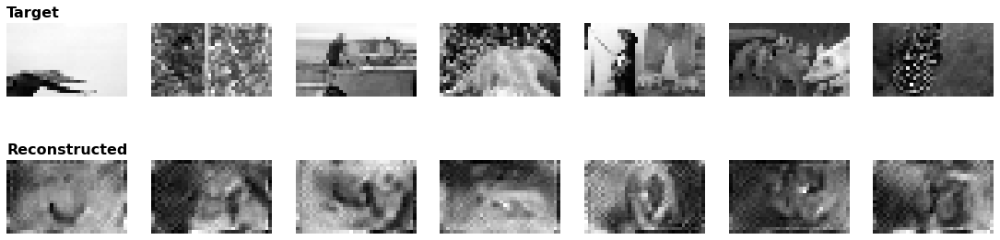

[130/600]
Training progress: [0/280 (0%)]  Loss: 0.023908
Training progress: [100/280 (36%)]  Loss: 0.023388
Training progress: [200/280 (71%)]  Loss: 0.019394
train_loss=0.0234


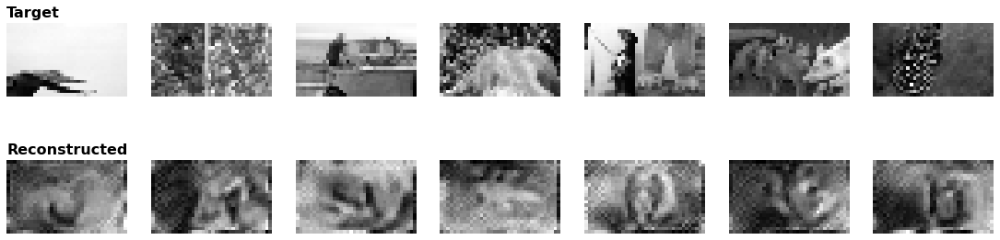

[131/600]
Training progress: [0/280 (0%)]  Loss: 0.020418
Training progress: [100/280 (36%)]  Loss: 0.020753
Training progress: [200/280 (71%)]  Loss: 0.019914
train_loss=0.0225


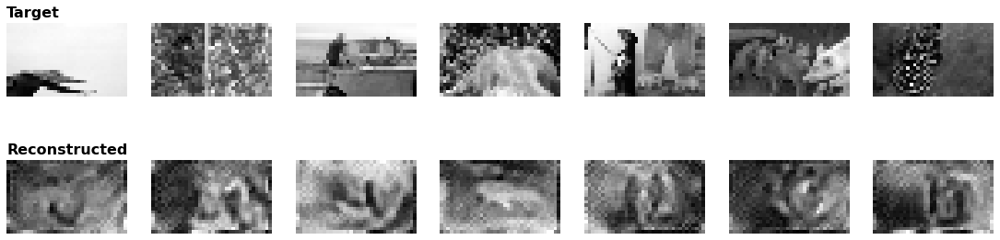

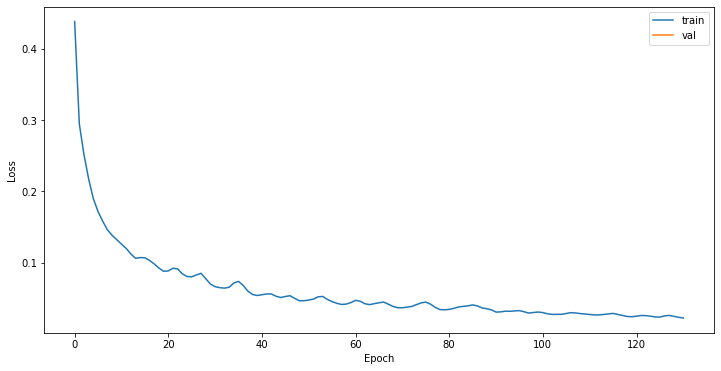

[132/600]
Training progress: [0/280 (0%)]  Loss: 0.019473
Training progress: [100/280 (36%)]  Loss: 0.019753
Training progress: [200/280 (71%)]  Loss: 0.017289
train_loss=0.0223


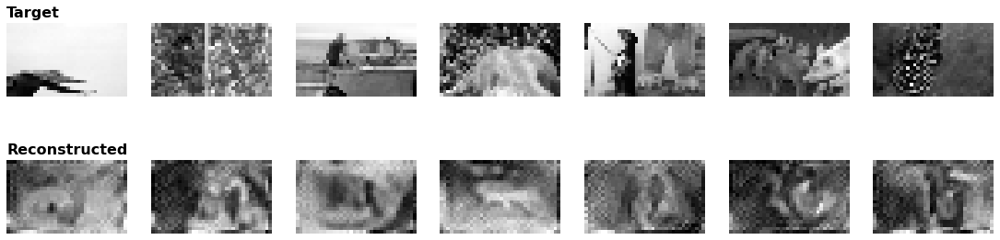

[133/600]
Training progress: [0/280 (0%)]  Loss: 0.019336
Training progress: [100/280 (36%)]  Loss: 0.021146
Training progress: [200/280 (71%)]  Loss: 0.018998
train_loss=0.0234


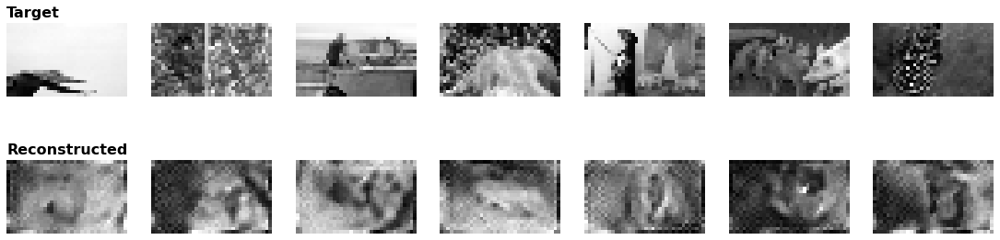

[134/600]
Training progress: [0/280 (0%)]  Loss: 0.019487
Training progress: [100/280 (36%)]  Loss: 0.020137
Training progress: [200/280 (71%)]  Loss: 0.021523
train_loss=0.0255


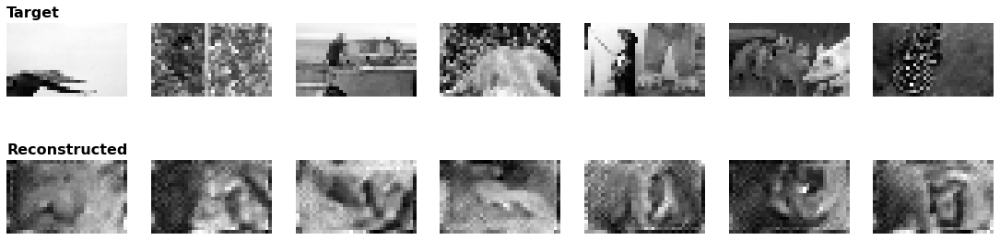

[135/600]
Training progress: [0/280 (0%)]  Loss: 0.018601
Training progress: [100/280 (36%)]  Loss: 0.021843
Training progress: [200/280 (71%)]  Loss: 0.028653
train_loss=0.0272


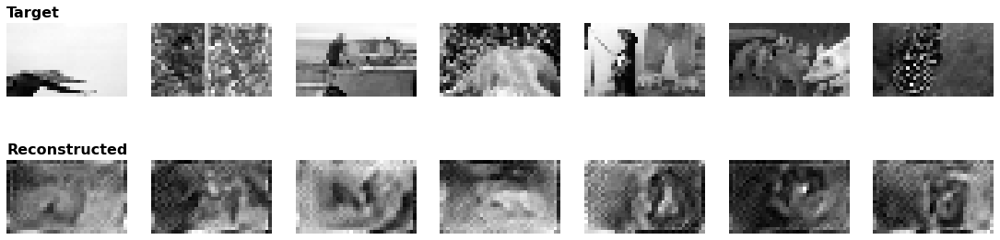

[136/600]
Training progress: [0/280 (0%)]  Loss: 0.028548
Training progress: [100/280 (36%)]  Loss: 0.020085
Training progress: [200/280 (71%)]  Loss: 0.026788
train_loss=0.0253


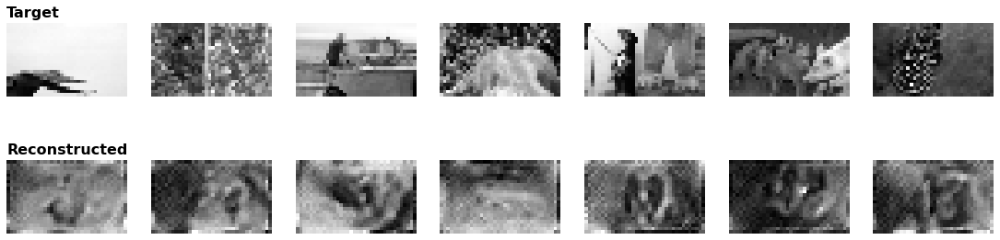

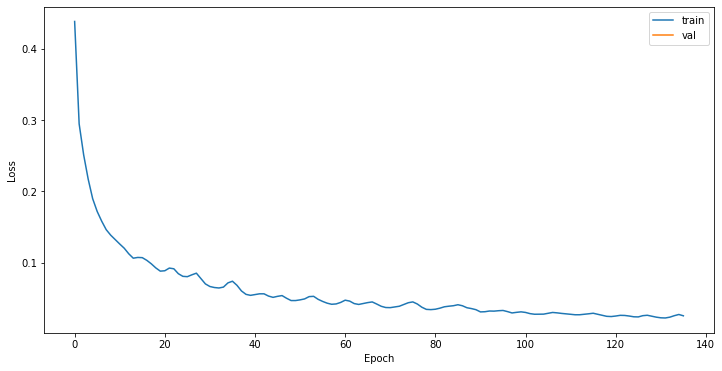

[137/600]
Training progress: [0/280 (0%)]  Loss: 0.022388
Training progress: [100/280 (36%)]  Loss: 0.018175
Training progress: [200/280 (71%)]  Loss: 0.024556
train_loss=0.0227


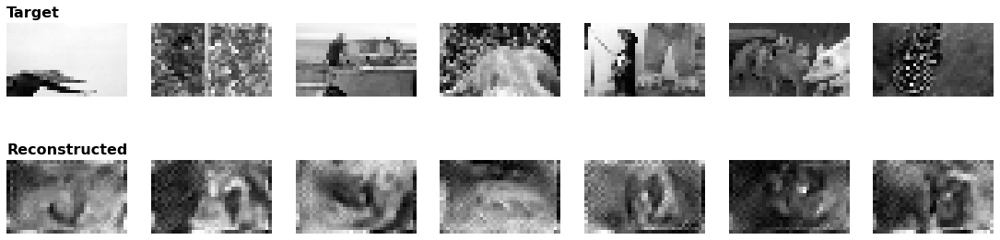

[138/600]
Training progress: [0/280 (0%)]  Loss: 0.018411
Training progress: [100/280 (36%)]  Loss: 0.022205
Training progress: [200/280 (71%)]  Loss: 0.020576
train_loss=0.0210


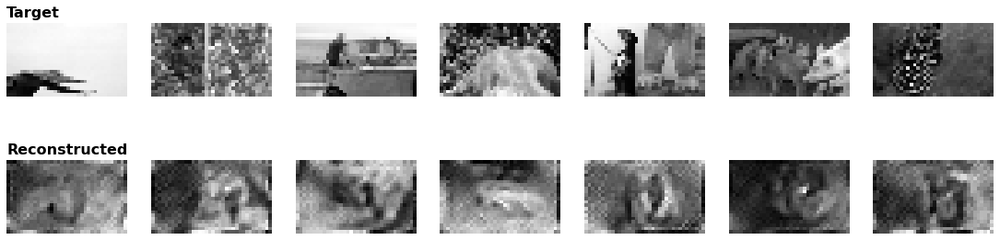

[139/600]
Training progress: [0/280 (0%)]  Loss: 0.015705
Training progress: [100/280 (36%)]  Loss: 0.018873
Training progress: [200/280 (71%)]  Loss: 0.018292
train_loss=0.0200


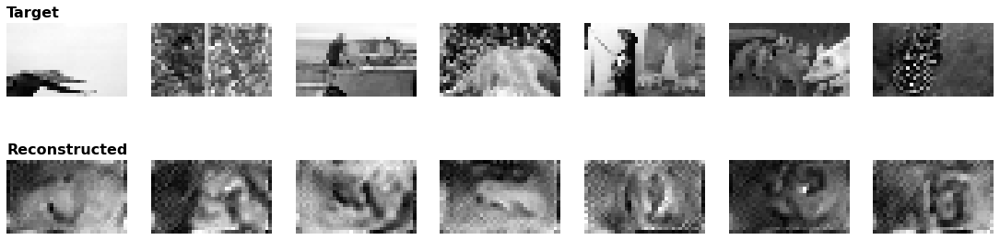

[140/600]
Training progress: [0/280 (0%)]  Loss: 0.017377
Training progress: [100/280 (36%)]  Loss: 0.016742
Training progress: [200/280 (71%)]  Loss: 0.017774
train_loss=0.0196


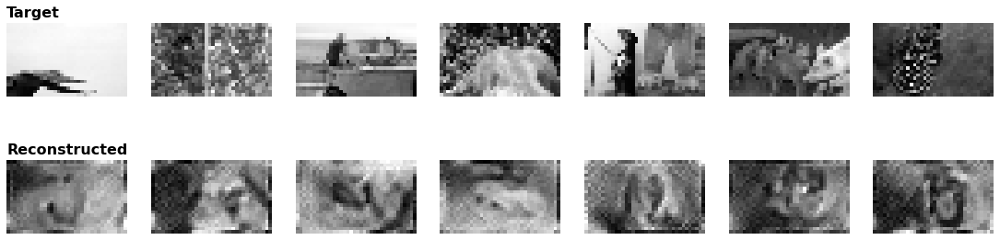

[141/600]
Training progress: [0/280 (0%)]  Loss: 0.022262
Training progress: [100/280 (36%)]  Loss: 0.018530
Training progress: [200/280 (71%)]  Loss: 0.015913
train_loss=0.0205


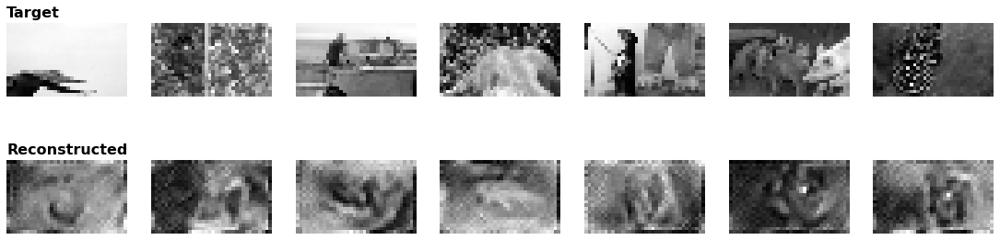

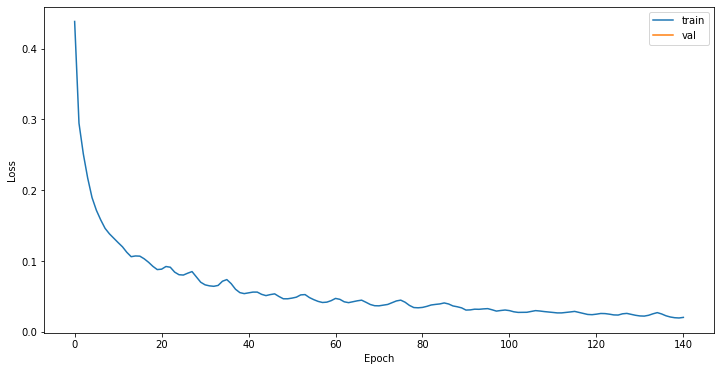

[142/600]
Training progress: [0/280 (0%)]  Loss: 0.020905
Training progress: [100/280 (36%)]  Loss: 0.019086
Training progress: [200/280 (71%)]  Loss: 0.020979
train_loss=0.0222


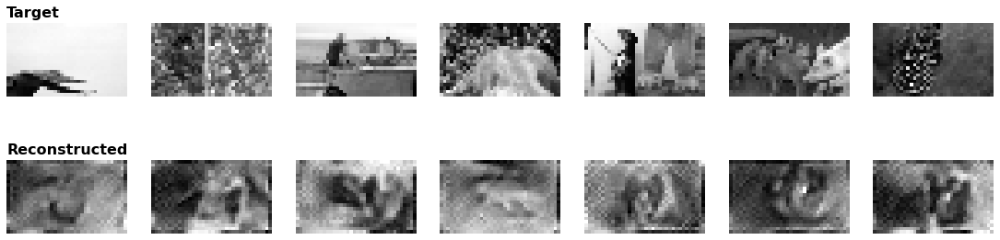

[143/600]
Training progress: [0/280 (0%)]  Loss: 0.021344
Training progress: [100/280 (36%)]  Loss: 0.019711
Training progress: [200/280 (71%)]  Loss: 0.017338
train_loss=0.0234


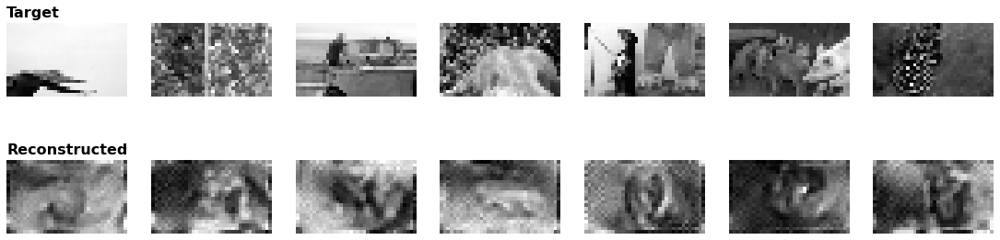

[144/600]
Training progress: [0/280 (0%)]  Loss: 0.019286
Training progress: [100/280 (36%)]  Loss: 0.018687
Training progress: [200/280 (71%)]  Loss: 0.017751
train_loss=0.0243


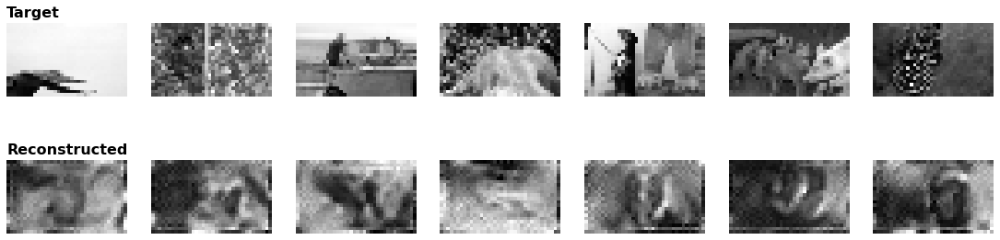

[145/600]
Training progress: [0/280 (0%)]  Loss: 0.021764
Training progress: [100/280 (36%)]  Loss: 0.026930
Training progress: [200/280 (71%)]  Loss: 0.018132
train_loss=0.0241


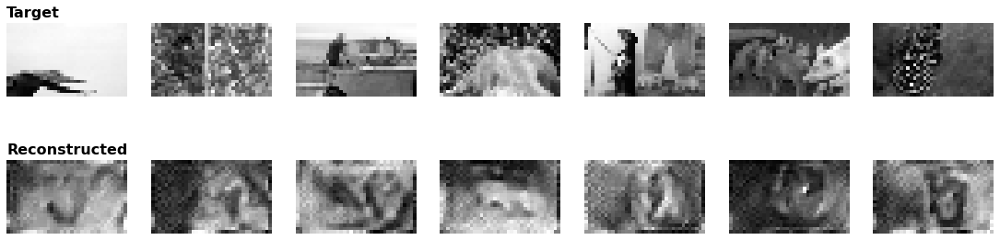

[146/600]
Training progress: [0/280 (0%)]  Loss: 0.023066
Training progress: [100/280 (36%)]  Loss: 0.021454
Training progress: [200/280 (71%)]  Loss: 0.017968
train_loss=0.0230


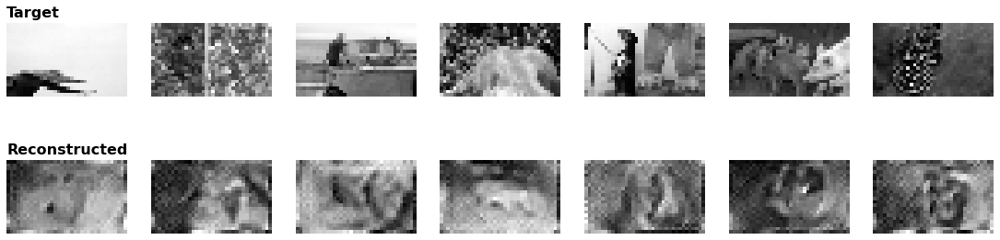

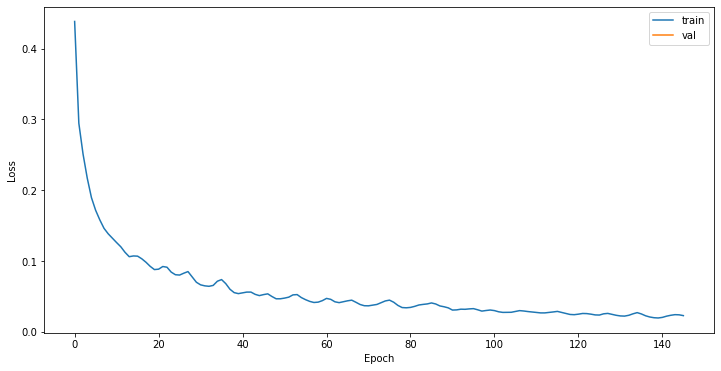

[147/600]
Training progress: [0/280 (0%)]  Loss: 0.016508
Training progress: [100/280 (36%)]  Loss: 0.022903
Training progress: [200/280 (71%)]  Loss: 0.016781
train_loss=0.0210


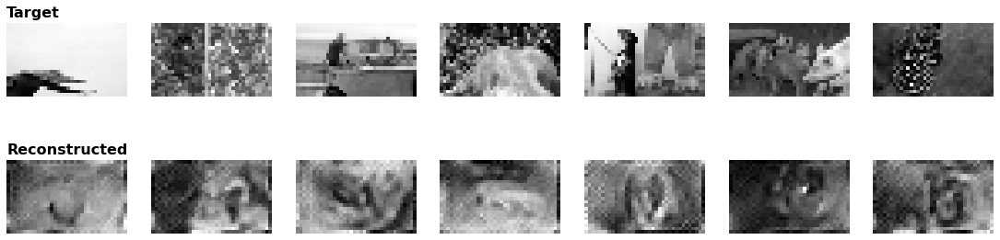

[148/600]
Training progress: [0/280 (0%)]  Loss: 0.016548
Training progress: [100/280 (36%)]  Loss: 0.018200
Training progress: [200/280 (71%)]  Loss: 0.017779
train_loss=0.0201


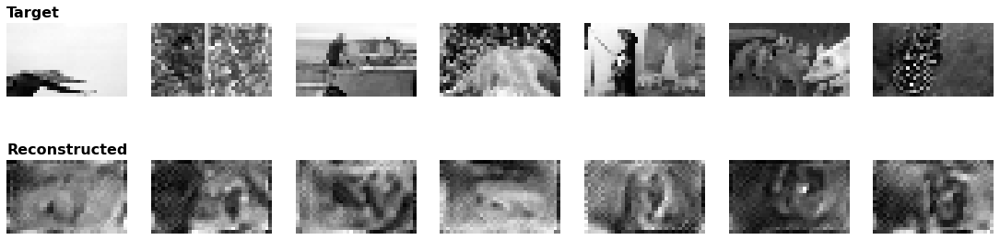

[149/600]
Training progress: [0/280 (0%)]  Loss: 0.016032
Training progress: [100/280 (36%)]  Loss: 0.020839
Training progress: [200/280 (71%)]  Loss: 0.015818
train_loss=0.0199


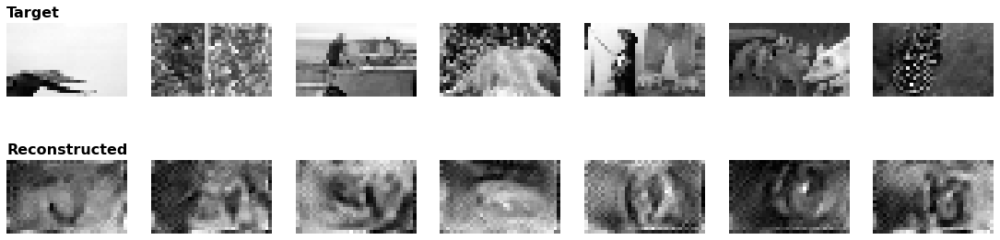

[150/600]
Training progress: [0/280 (0%)]  Loss: 0.016859
Training progress: [100/280 (36%)]  Loss: 0.022583
Training progress: [200/280 (71%)]  Loss: 0.015985
train_loss=0.0205


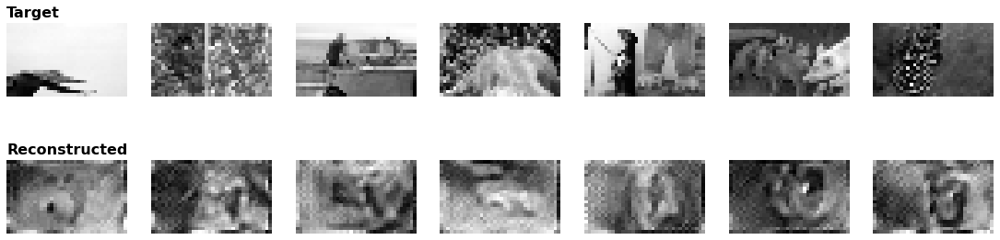

[151/600]
Training progress: [0/280 (0%)]  Loss: 0.018391
Training progress: [100/280 (36%)]  Loss: 0.016761
Training progress: [200/280 (71%)]  Loss: 0.016033
train_loss=0.0208


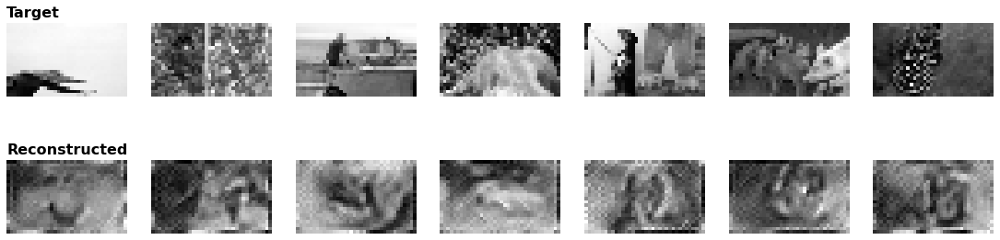

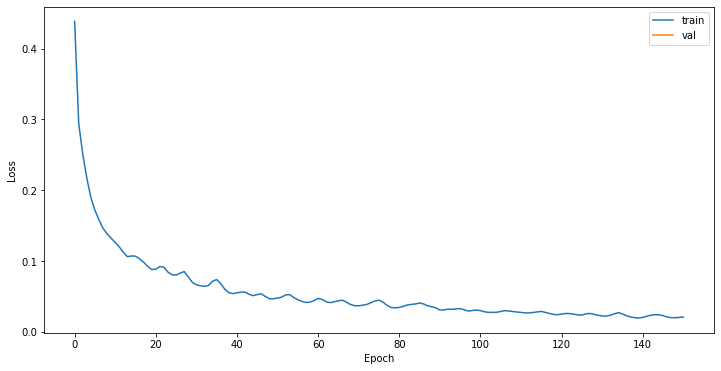

[152/600]
Training progress: [0/280 (0%)]  Loss: 0.020590
Training progress: [100/280 (36%)]  Loss: 0.015338
Training progress: [200/280 (71%)]  Loss: 0.021951
train_loss=0.0214


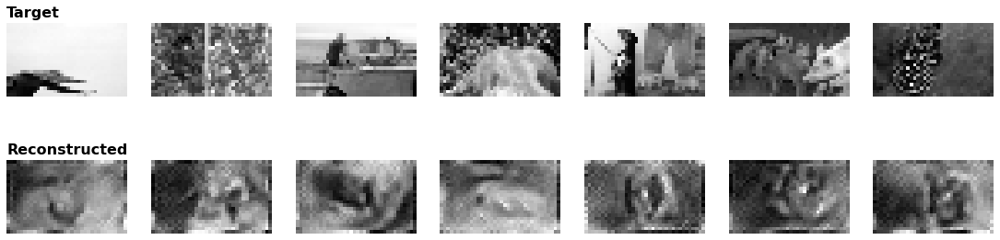

[153/600]
Training progress: [0/280 (0%)]  Loss: 0.019666
Training progress: [100/280 (36%)]  Loss: 0.016677
Training progress: [200/280 (71%)]  Loss: 0.018702
train_loss=0.0213


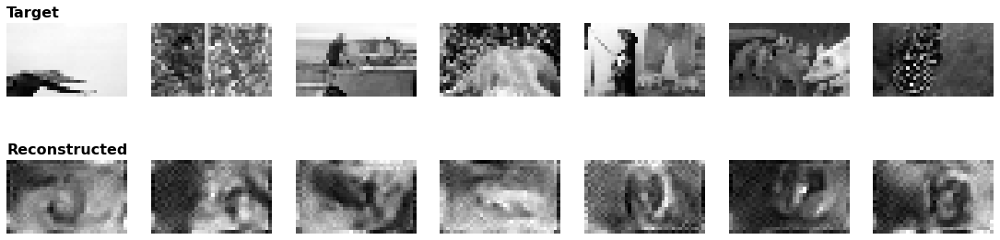

[154/600]
Training progress: [0/280 (0%)]  Loss: 0.017325
Training progress: [100/280 (36%)]  Loss: 0.020683
Training progress: [200/280 (71%)]  Loss: 0.019209
train_loss=0.0213


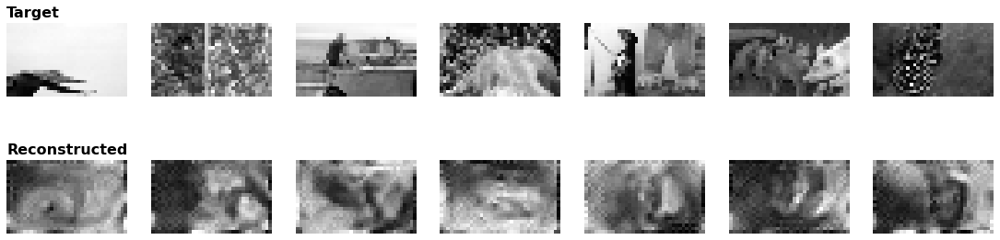

[155/600]
Training progress: [0/280 (0%)]  Loss: 0.016310
Training progress: [100/280 (36%)]  Loss: 0.017882
Training progress: [200/280 (71%)]  Loss: 0.023178
train_loss=0.0210


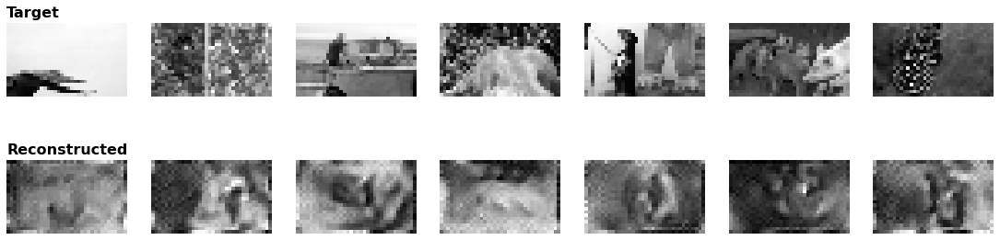

[156/600]
Training progress: [0/280 (0%)]  Loss: 0.020011
Training progress: [100/280 (36%)]  Loss: 0.015012
Training progress: [200/280 (71%)]  Loss: 0.018701
train_loss=0.0205


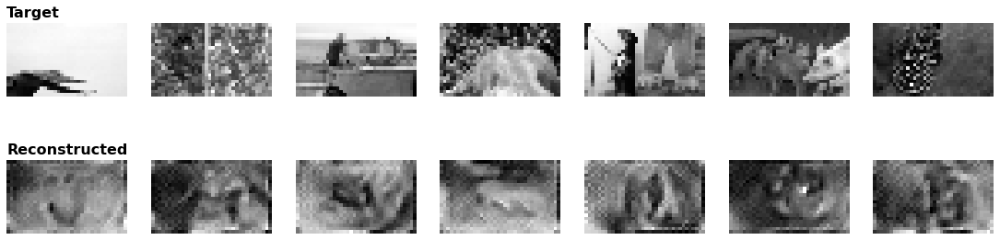

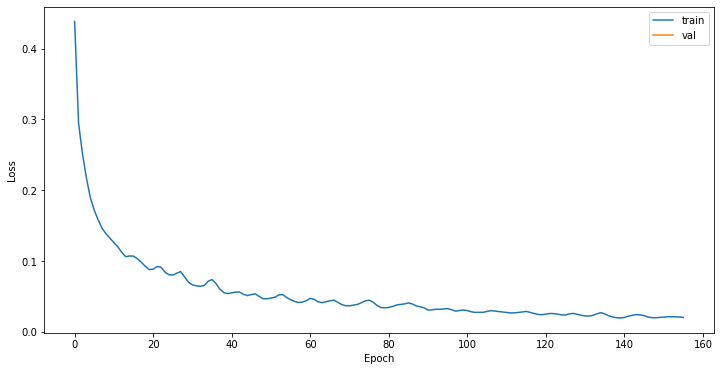

[157/600]
Training progress: [0/280 (0%)]  Loss: 0.021269
Training progress: [100/280 (36%)]  Loss: 0.015390
Training progress: [200/280 (71%)]  Loss: 0.015317
train_loss=0.0198


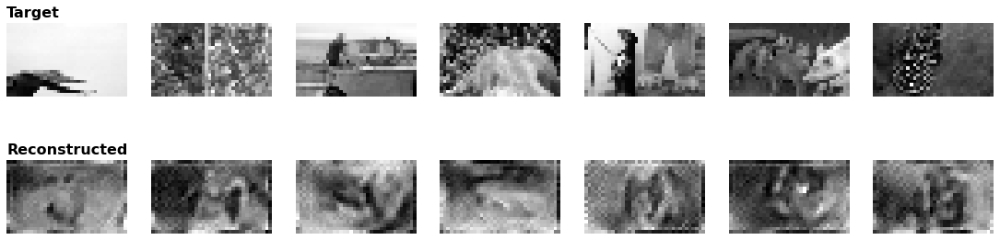

[158/600]
Training progress: [0/280 (0%)]  Loss: 0.019787
Training progress: [100/280 (36%)]  Loss: 0.015545
Training progress: [200/280 (71%)]  Loss: 0.015345
train_loss=0.0205


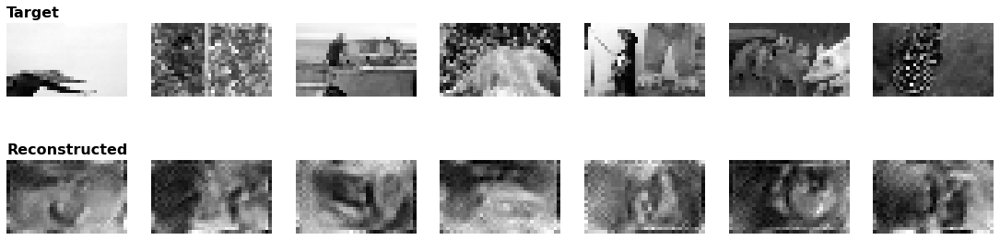

[159/600]
Training progress: [0/280 (0%)]  Loss: 0.020557
Training progress: [100/280 (36%)]  Loss: 0.017923
Training progress: [200/280 (71%)]  Loss: 0.021114
train_loss=0.0222


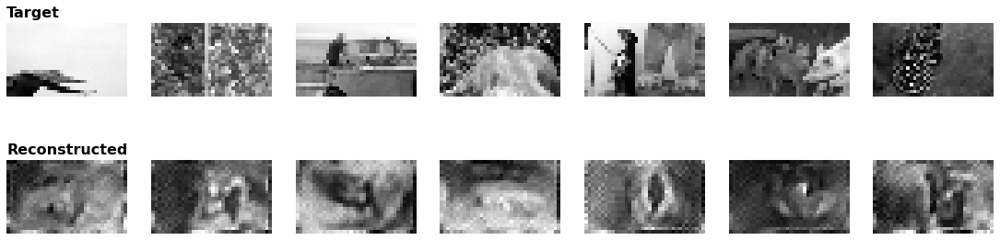

[160/600]
Training progress: [0/280 (0%)]  Loss: 0.021669
Training progress: [100/280 (36%)]  Loss: 0.017473
Training progress: [200/280 (71%)]  Loss: 0.024451
train_loss=0.0226


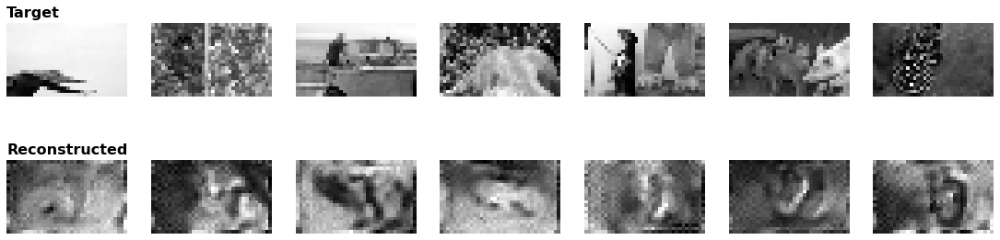

[161/600]
Training progress: [0/280 (0%)]  Loss: 0.020465
Training progress: [100/280 (36%)]  Loss: 0.017611
Training progress: [200/280 (71%)]  Loss: 0.017876
train_loss=0.0211


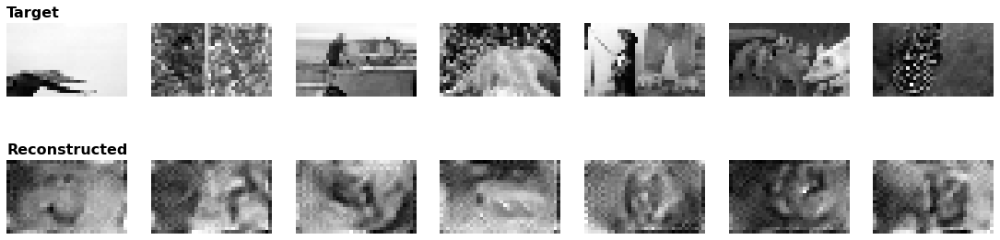

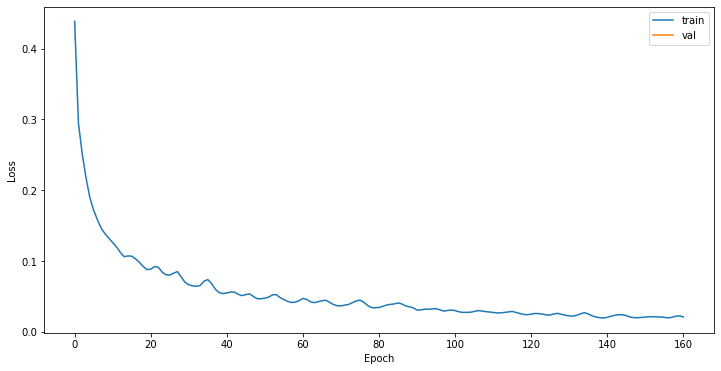

[162/600]
Training progress: [0/280 (0%)]  Loss: 0.021069
Training progress: [100/280 (36%)]  Loss: 0.016183
Training progress: [200/280 (71%)]  Loss: 0.014255
train_loss=0.0185


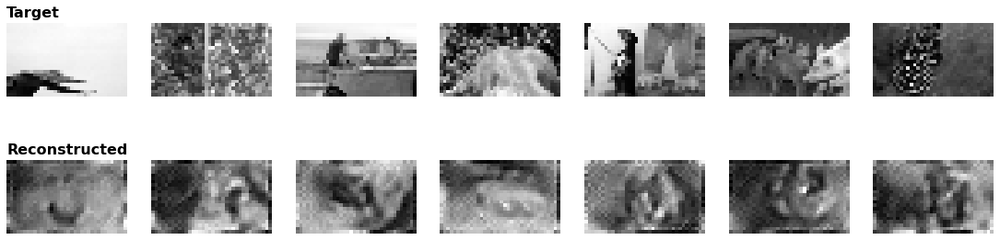

[163/600]
Training progress: [0/280 (0%)]  Loss: 0.018471
Training progress: [100/280 (36%)]  Loss: 0.013161
Training progress: [200/280 (71%)]  Loss: 0.012876
train_loss=0.0165


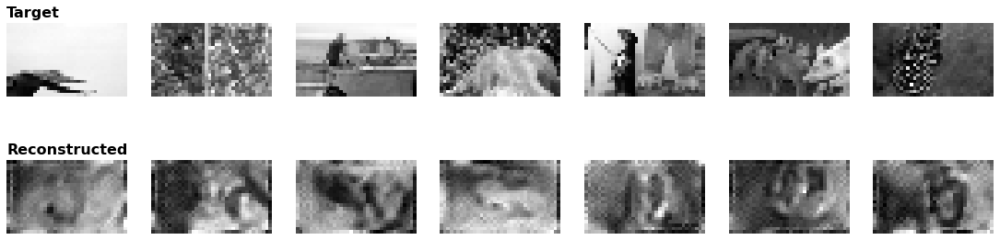

[164/600]
Training progress: [0/280 (0%)]  Loss: 0.014986
Training progress: [100/280 (36%)]  Loss: 0.013385
Training progress: [200/280 (71%)]  Loss: 0.012674
train_loss=0.0164


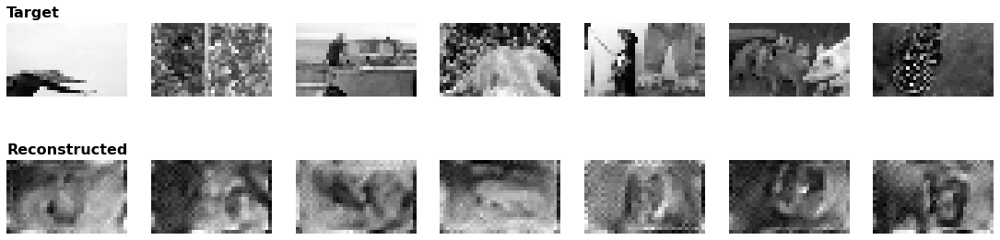

[165/600]
Training progress: [0/280 (0%)]  Loss: 0.013147
Training progress: [100/280 (36%)]  Loss: 0.014566
Training progress: [200/280 (71%)]  Loss: 0.016170
train_loss=0.0177


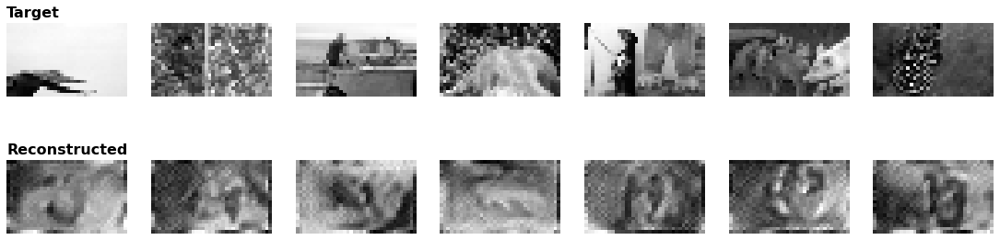

[166/600]
Training progress: [0/280 (0%)]  Loss: 0.013414
Training progress: [100/280 (36%)]  Loss: 0.017498
Training progress: [200/280 (71%)]  Loss: 0.016986
train_loss=0.0194


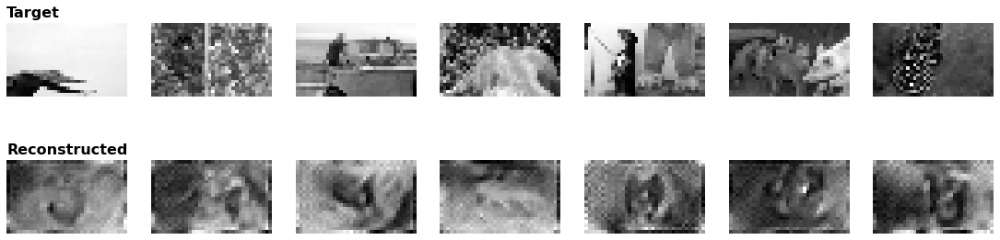

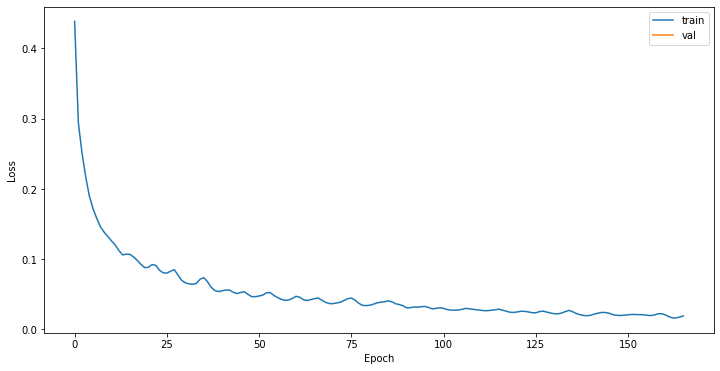

[167/600]
Training progress: [0/280 (0%)]  Loss: 0.015332
Training progress: [100/280 (36%)]  Loss: 0.021923
Training progress: [200/280 (71%)]  Loss: 0.019958
train_loss=0.0204


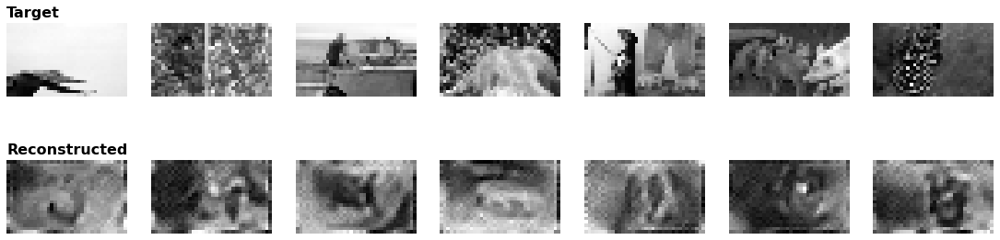

[168/600]
Training progress: [0/280 (0%)]  Loss: 0.019670
Training progress: [100/280 (36%)]  Loss: 0.017108
Training progress: [200/280 (71%)]  Loss: 0.018682
train_loss=0.0205


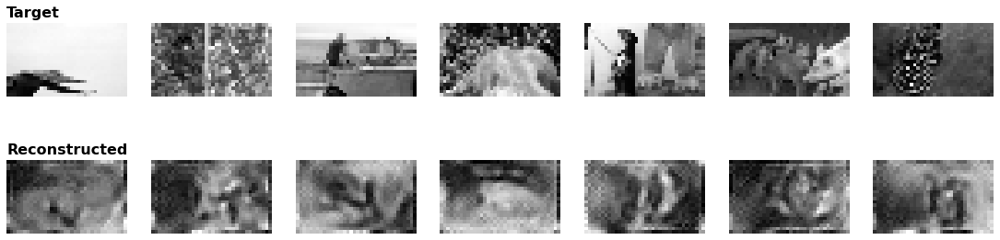

[169/600]
Training progress: [0/280 (0%)]  Loss: 0.019754
Training progress: [100/280 (36%)]  Loss: 0.015537
Training progress: [200/280 (71%)]  Loss: 0.013685
train_loss=0.0194


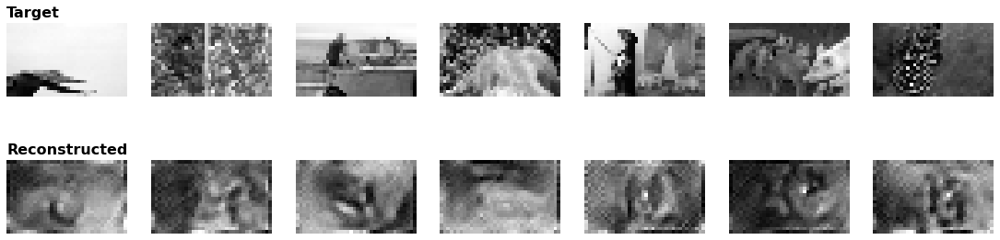

[170/600]
Training progress: [0/280 (0%)]  Loss: 0.015763
Training progress: [100/280 (36%)]  Loss: 0.014243
Training progress: [200/280 (71%)]  Loss: 0.020460
train_loss=0.0190


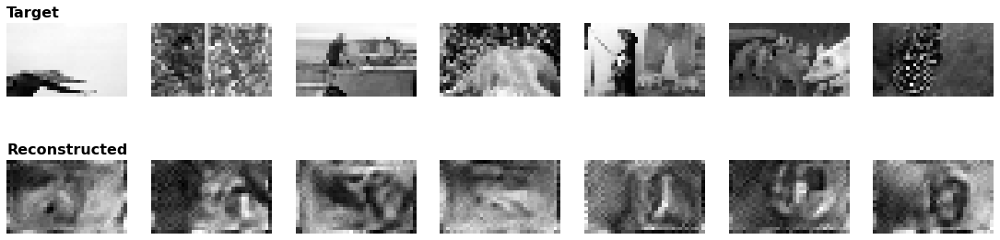

[171/600]
Training progress: [0/280 (0%)]  Loss: 0.015898
Training progress: [100/280 (36%)]  Loss: 0.015299
Training progress: [200/280 (71%)]  Loss: 0.018365
train_loss=0.0185


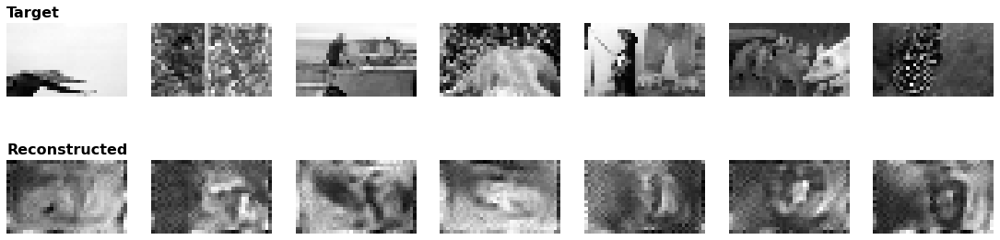

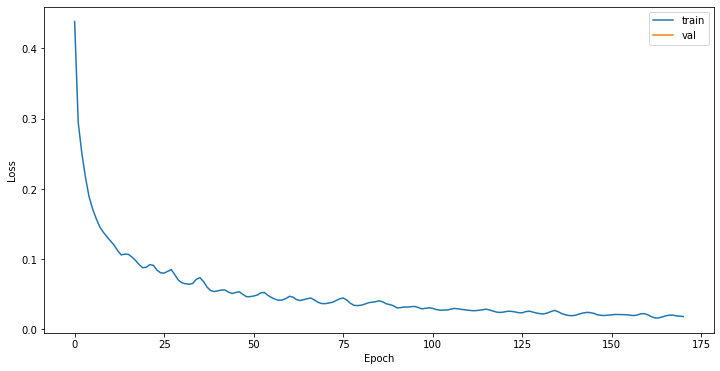

[172/600]
Training progress: [0/280 (0%)]  Loss: 0.025999
Training progress: [100/280 (36%)]  Loss: 0.017158
Training progress: [200/280 (71%)]  Loss: 0.013172
train_loss=0.0191


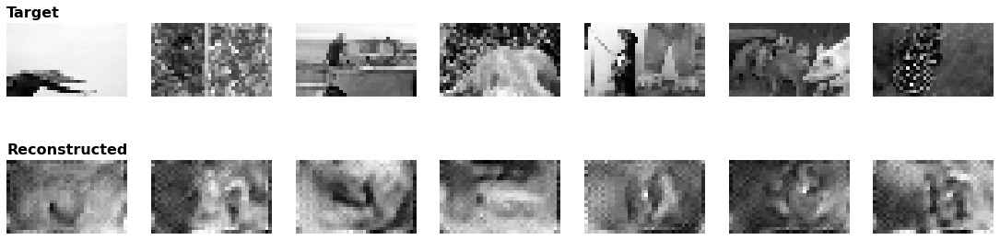

[173/600]
Training progress: [0/280 (0%)]  Loss: 0.018043
Training progress: [100/280 (36%)]  Loss: 0.015516
Training progress: [200/280 (71%)]  Loss: 0.012616
train_loss=0.0191


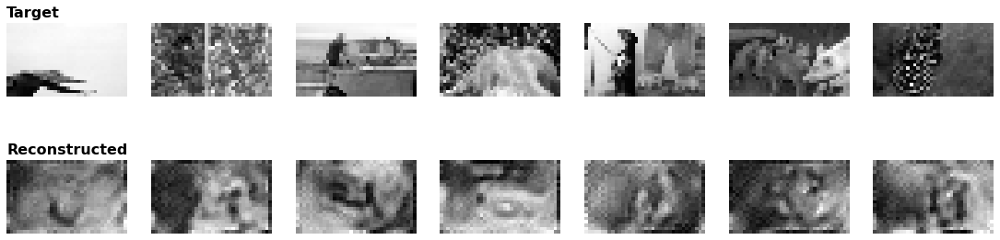

[174/600]
Training progress: [0/280 (0%)]  Loss: 0.023089
Training progress: [100/280 (36%)]  Loss: 0.014341
Training progress: [200/280 (71%)]  Loss: 0.012311
train_loss=0.0180


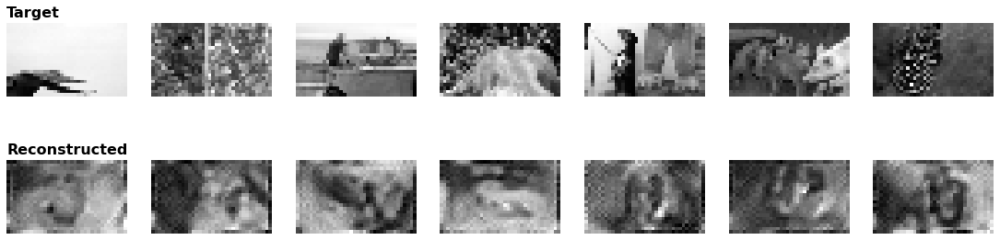

[175/600]
Training progress: [0/280 (0%)]  Loss: 0.014562
Training progress: [100/280 (36%)]  Loss: 0.013577
Training progress: [200/280 (71%)]  Loss: 0.012541
train_loss=0.0166


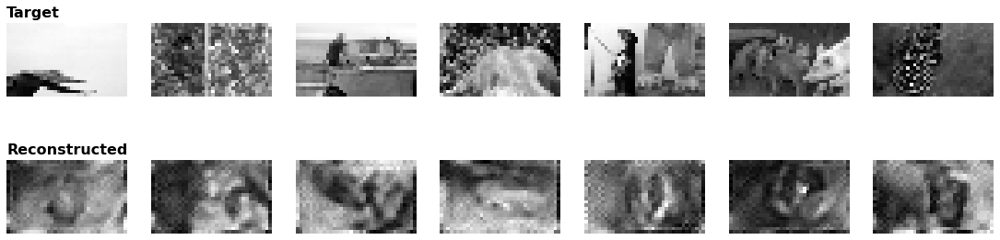

[176/600]
Training progress: [0/280 (0%)]  Loss: 0.012381
Training progress: [100/280 (36%)]  Loss: 0.016368
Training progress: [200/280 (71%)]  Loss: 0.016336
train_loss=0.0169


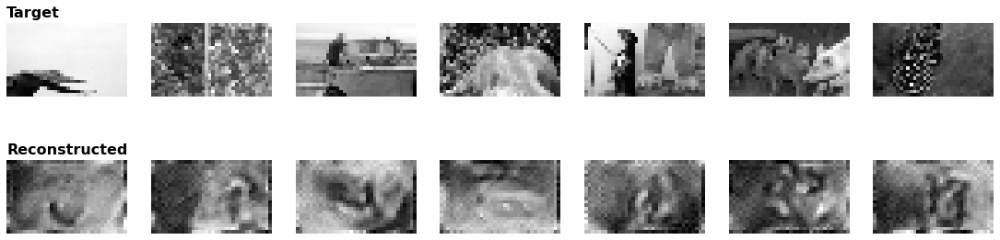

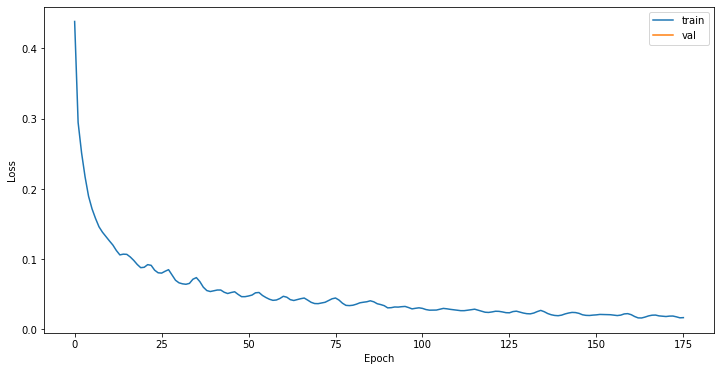

[177/600]
Training progress: [0/280 (0%)]  Loss: 0.013347
Training progress: [100/280 (36%)]  Loss: 0.014160
Training progress: [200/280 (71%)]  Loss: 0.020878
train_loss=0.0179


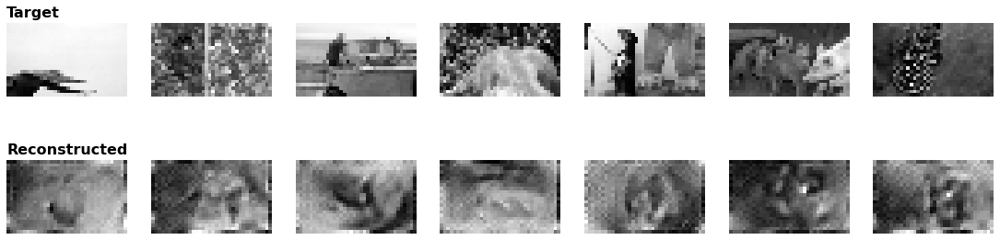

[178/600]
Training progress: [0/280 (0%)]  Loss: 0.015765
Training progress: [100/280 (36%)]  Loss: 0.015289
Training progress: [200/280 (71%)]  Loss: 0.021277
train_loss=0.0195


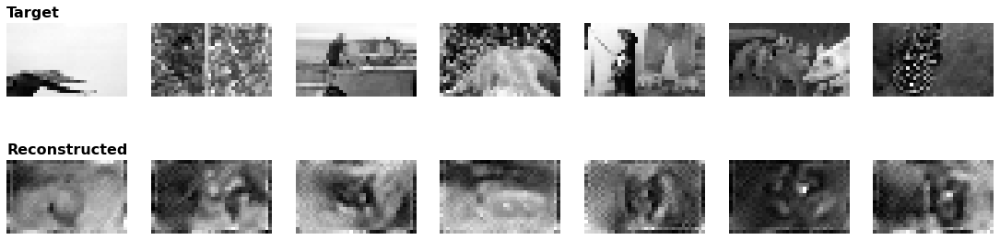

[179/600]
Training progress: [0/280 (0%)]  Loss: 0.021914
Training progress: [100/280 (36%)]  Loss: 0.014248
Training progress: [200/280 (71%)]  Loss: 0.019487
train_loss=0.0193


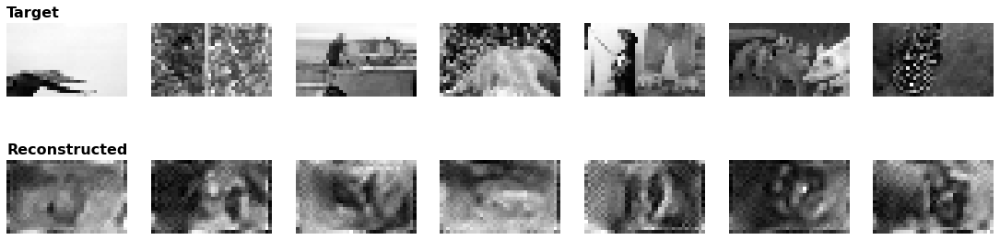

[180/600]
Training progress: [0/280 (0%)]  Loss: 0.016227
Training progress: [100/280 (36%)]  Loss: 0.014105
Training progress: [200/280 (71%)]  Loss: 0.015645
train_loss=0.0192


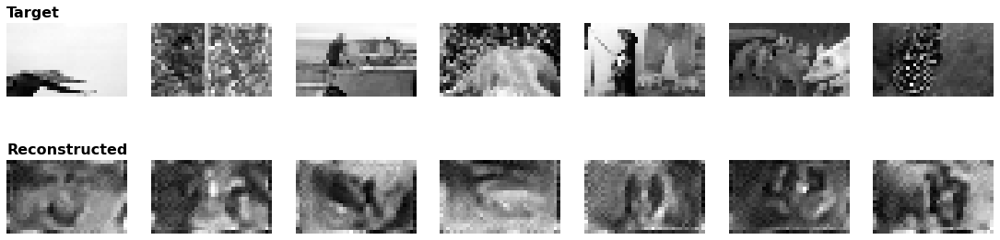

[181/600]
Training progress: [0/280 (0%)]  Loss: 0.018706
Training progress: [100/280 (36%)]  Loss: 0.012915
Training progress: [200/280 (71%)]  Loss: 0.015910
train_loss=0.0196


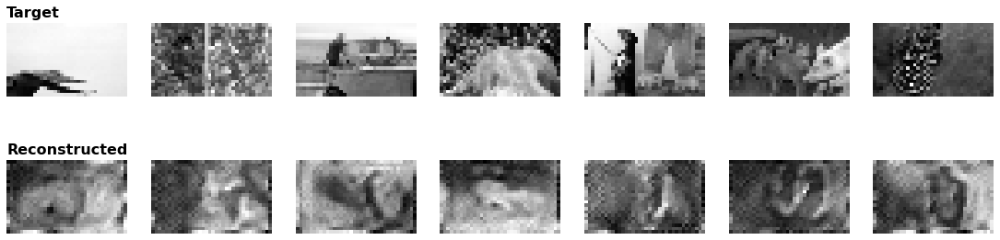

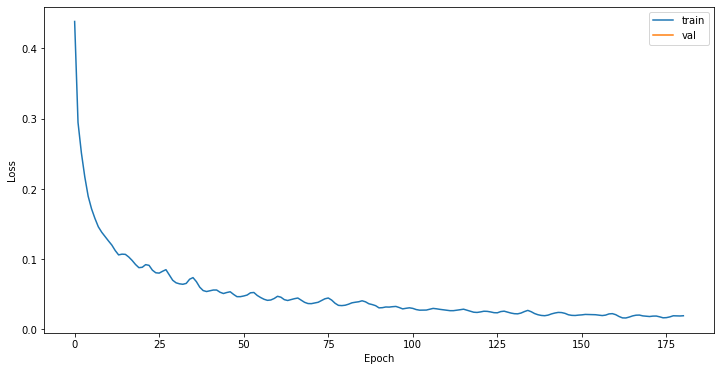

[182/600]
Training progress: [0/280 (0%)]  Loss: 0.026857
Training progress: [100/280 (36%)]  Loss: 0.013372
Training progress: [200/280 (71%)]  Loss: 0.016874
train_loss=0.0207


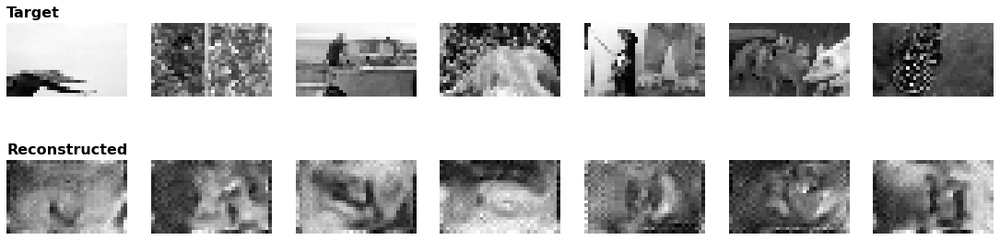

[183/600]
Training progress: [0/280 (0%)]  Loss: 0.017633
Training progress: [100/280 (36%)]  Loss: 0.016162
Training progress: [200/280 (71%)]  Loss: 0.017420
train_loss=0.0199


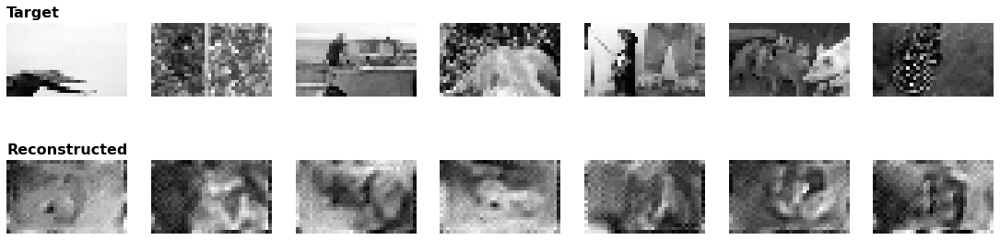

[184/600]
Training progress: [0/280 (0%)]  Loss: 0.022067
Training progress: [100/280 (36%)]  Loss: 0.013722
Training progress: [200/280 (71%)]  Loss: 0.015804
train_loss=0.0180


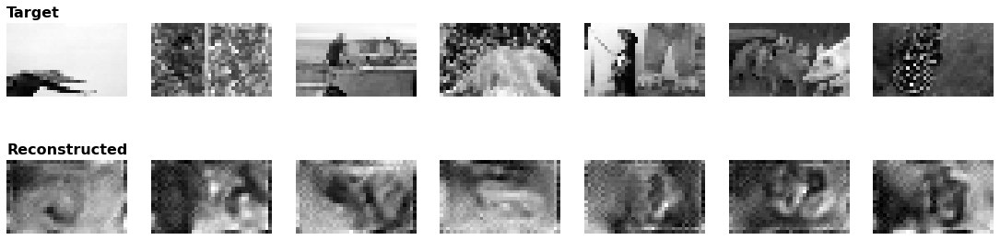

[185/600]
Training progress: [0/280 (0%)]  Loss: 0.019162
Training progress: [100/280 (36%)]  Loss: 0.011585
Training progress: [200/280 (71%)]  Loss: 0.016593
train_loss=0.0168


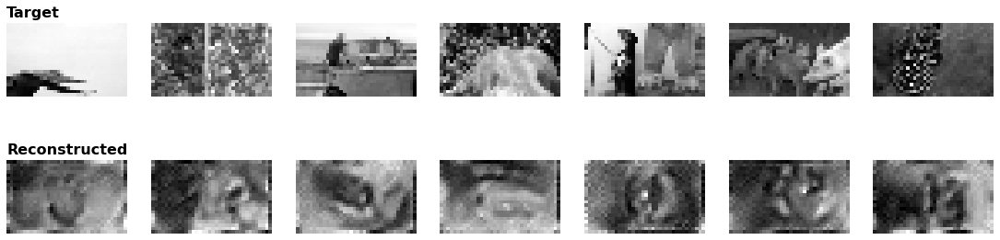

[186/600]
Training progress: [0/280 (0%)]  Loss: 0.014633
Training progress: [100/280 (36%)]  Loss: 0.011388
Training progress: [200/280 (71%)]  Loss: 0.013379
train_loss=0.0162


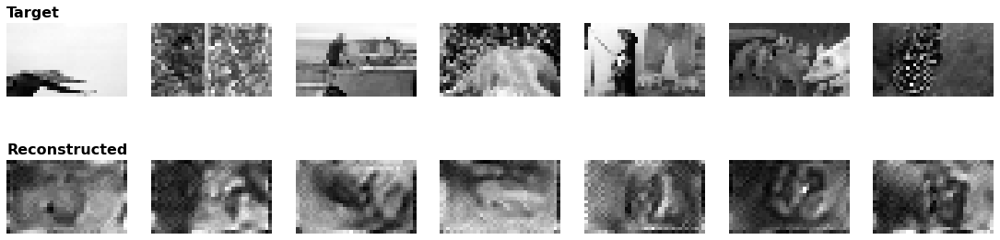

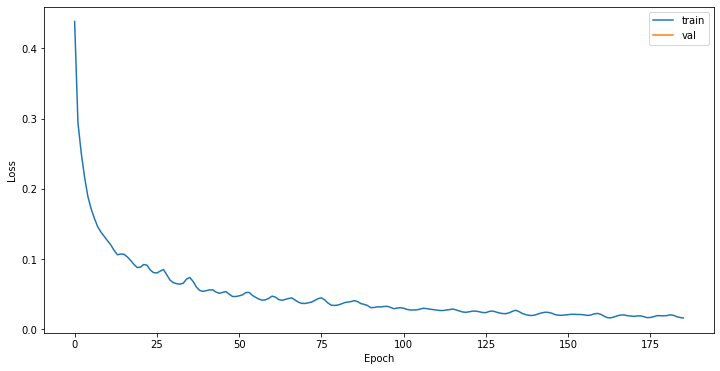

[187/600]
Training progress: [0/280 (0%)]  Loss: 0.012293
Training progress: [100/280 (36%)]  Loss: 0.011948
Training progress: [200/280 (71%)]  Loss: 0.013001
train_loss=0.0163


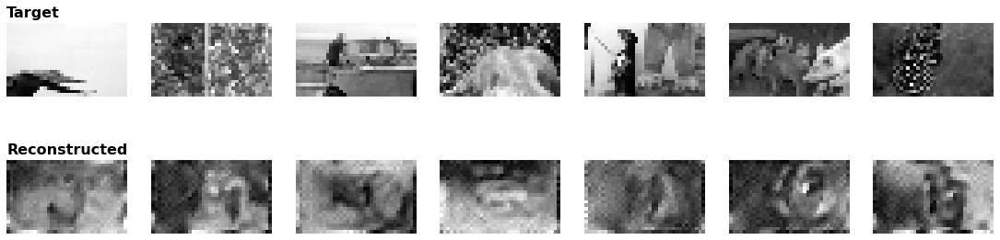

[188/600]
Training progress: [0/280 (0%)]  Loss: 0.014500
Training progress: [100/280 (36%)]  Loss: 0.011521
Training progress: [200/280 (71%)]  Loss: 0.016743
train_loss=0.0170


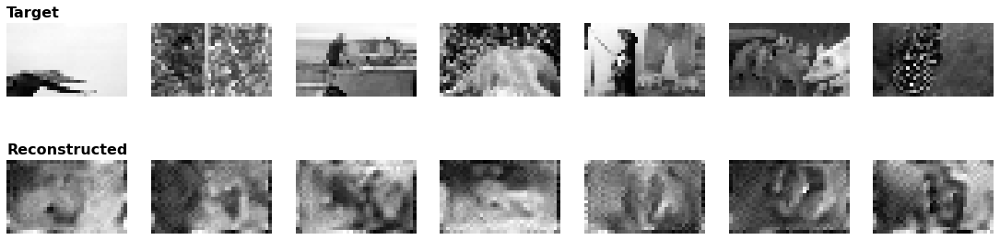

[189/600]
Training progress: [0/280 (0%)]  Loss: 0.015328
Training progress: [100/280 (36%)]  Loss: 0.013924
Training progress: [200/280 (71%)]  Loss: 0.015905
train_loss=0.0172


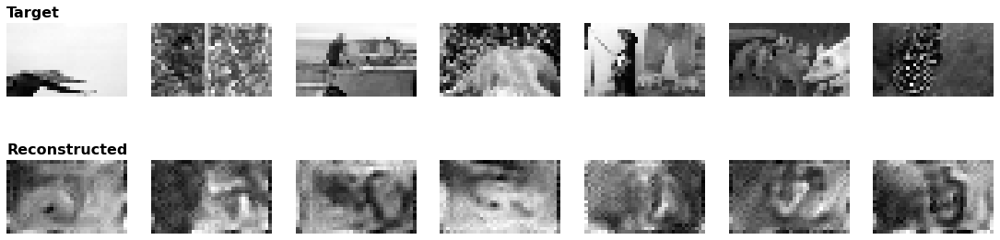

[190/600]
Training progress: [0/280 (0%)]  Loss: 0.015286
Training progress: [100/280 (36%)]  Loss: 0.012590
Training progress: [200/280 (71%)]  Loss: 0.013670
train_loss=0.0167


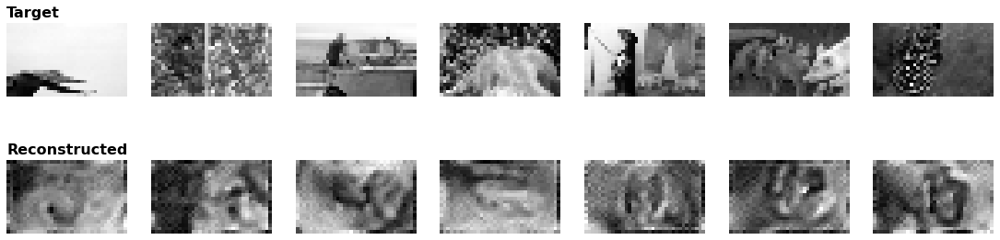

[191/600]
Training progress: [0/280 (0%)]  Loss: 0.014791
Training progress: [100/280 (36%)]  Loss: 0.013462
Training progress: [200/280 (71%)]  Loss: 0.017923
train_loss=0.0171


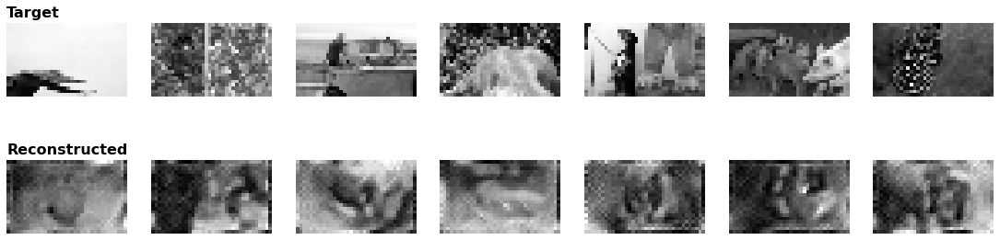

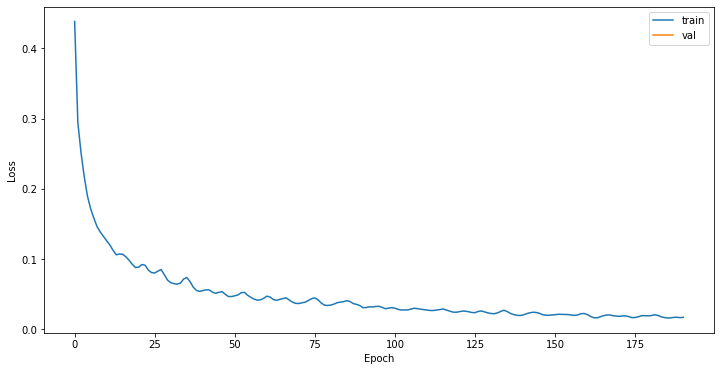

[192/600]
Training progress: [0/280 (0%)]  Loss: 0.016265
Training progress: [100/280 (36%)]  Loss: 0.018542
Training progress: [200/280 (71%)]  Loss: 0.014208
train_loss=0.0175


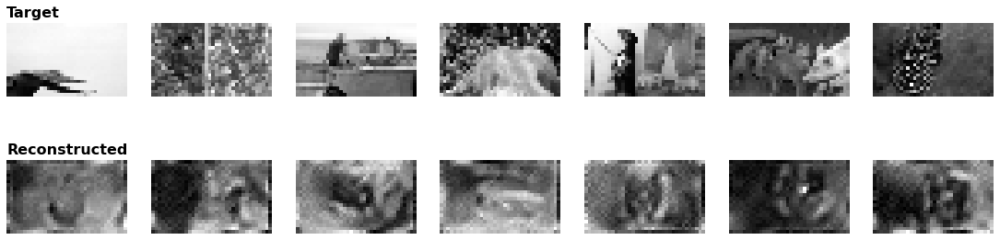

[193/600]
Training progress: [0/280 (0%)]  Loss: 0.015348
Training progress: [100/280 (36%)]  Loss: 0.014502
Training progress: [200/280 (71%)]  Loss: 0.013600
train_loss=0.0174


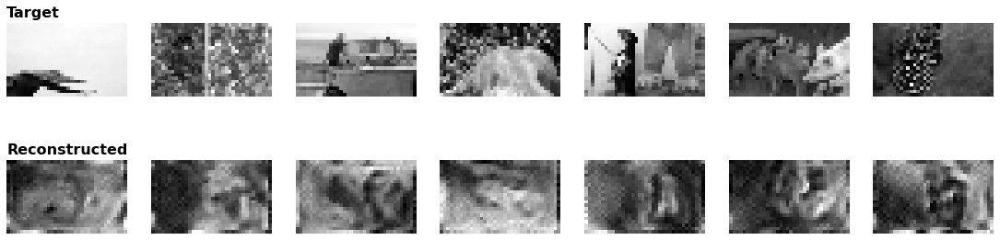

[194/600]
Training progress: [0/280 (0%)]  Loss: 0.014626
Training progress: [100/280 (36%)]  Loss: 0.014295
Training progress: [200/280 (71%)]  Loss: 0.015905
train_loss=0.0172


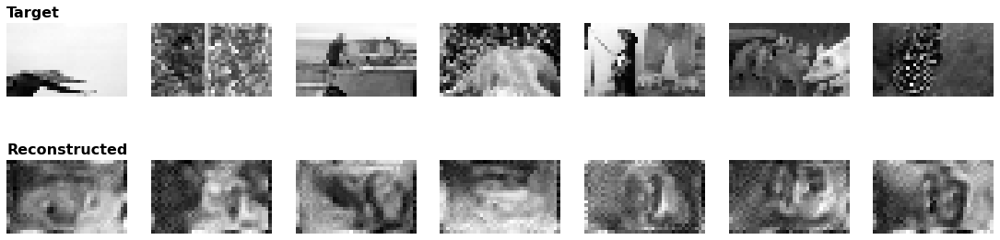

[195/600]
Training progress: [0/280 (0%)]  Loss: 0.017570
Training progress: [100/280 (36%)]  Loss: 0.015020
Training progress: [200/280 (71%)]  Loss: 0.015817
train_loss=0.0175


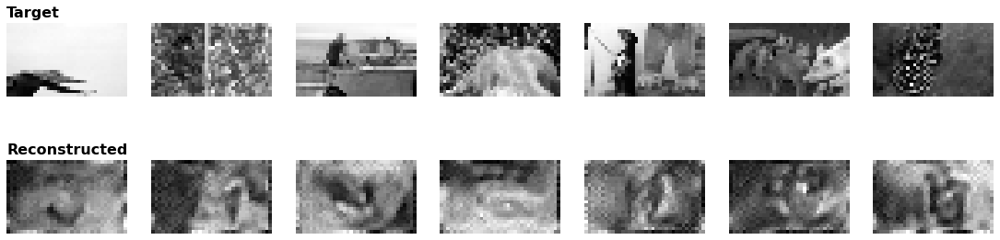

[196/600]
Training progress: [0/280 (0%)]  Loss: 0.015000
Training progress: [100/280 (36%)]  Loss: 0.014117
Training progress: [200/280 (71%)]  Loss: 0.014586
train_loss=0.0169


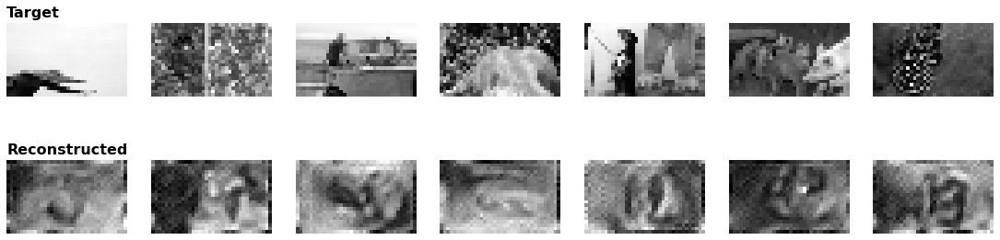

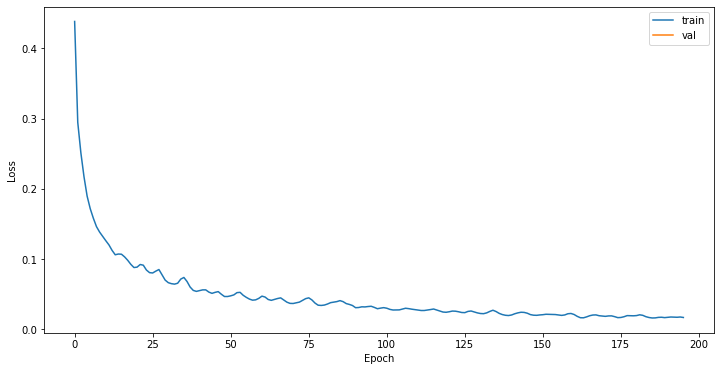

[197/600]
Training progress: [0/280 (0%)]  Loss: 0.016027
Training progress: [100/280 (36%)]  Loss: 0.010794
Training progress: [200/280 (71%)]  Loss: 0.012791
train_loss=0.0147


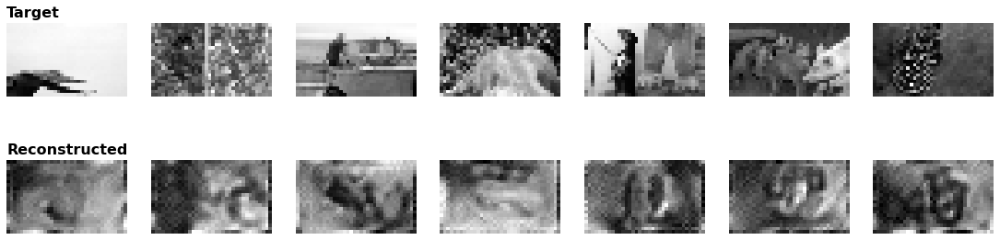

[198/600]
Training progress: [0/280 (0%)]  Loss: 0.012574
Training progress: [100/280 (36%)]  Loss: 0.013506
Training progress: [200/280 (71%)]  Loss: 0.011944
train_loss=0.0143


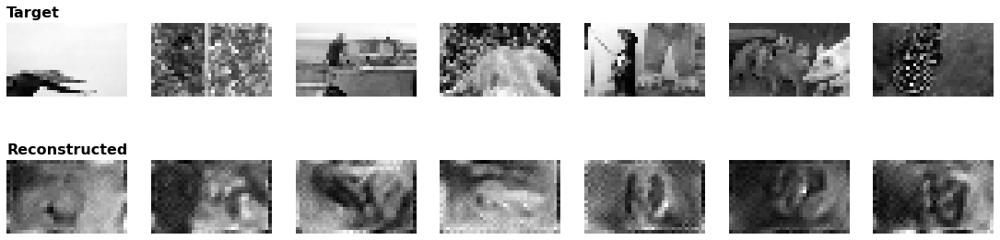

[199/600]
Training progress: [0/280 (0%)]  Loss: 0.011316
Training progress: [100/280 (36%)]  Loss: 0.015980
Training progress: [200/280 (71%)]  Loss: 0.012798
train_loss=0.0157


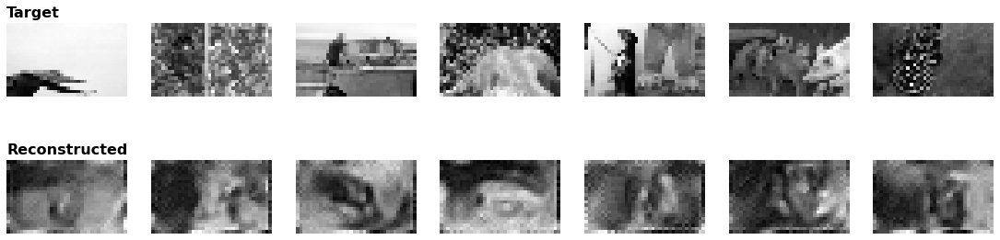

[200/600]
Training progress: [0/280 (0%)]  Loss: 0.012392
Training progress: [100/280 (36%)]  Loss: 0.015556
Training progress: [200/280 (71%)]  Loss: 0.013004
train_loss=0.0169


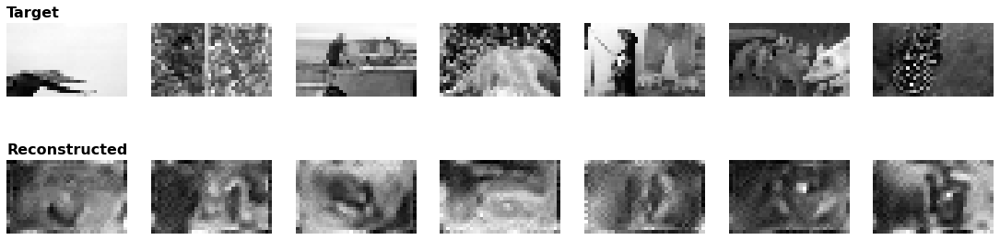

[201/600]
Training progress: [0/280 (0%)]  Loss: 0.012414
Training progress: [100/280 (36%)]  Loss: 0.015697
Training progress: [200/280 (71%)]  Loss: 0.012986
train_loss=0.0170


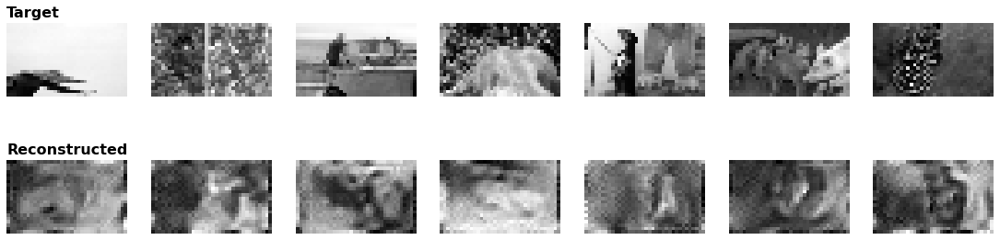

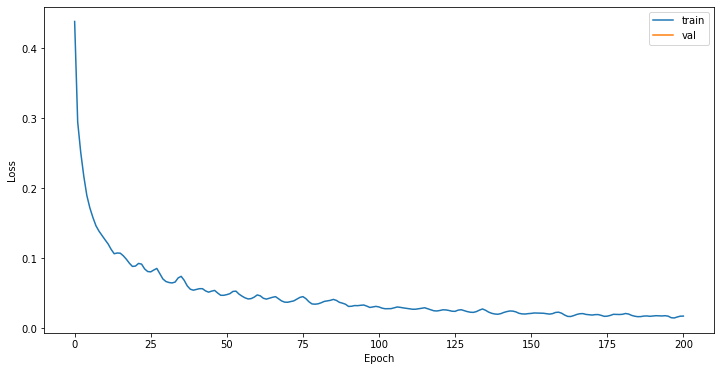

[202/600]
Training progress: [0/280 (0%)]  Loss: 0.012205
Training progress: [100/280 (36%)]  Loss: 0.016566
Training progress: [200/280 (71%)]  Loss: 0.012317
train_loss=0.0163


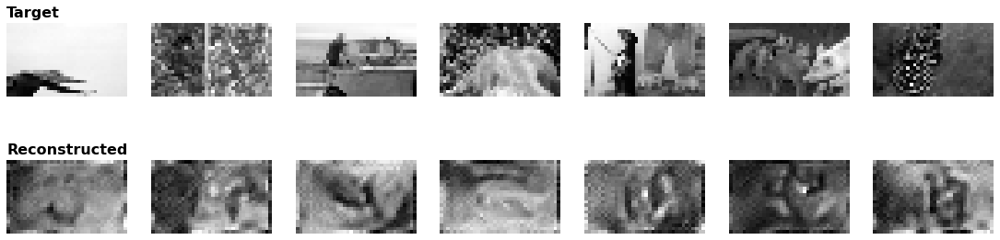

[203/600]
Training progress: [0/280 (0%)]  Loss: 0.010977
Training progress: [100/280 (36%)]  Loss: 0.012981
Training progress: [200/280 (71%)]  Loss: 0.011176
train_loss=0.0146


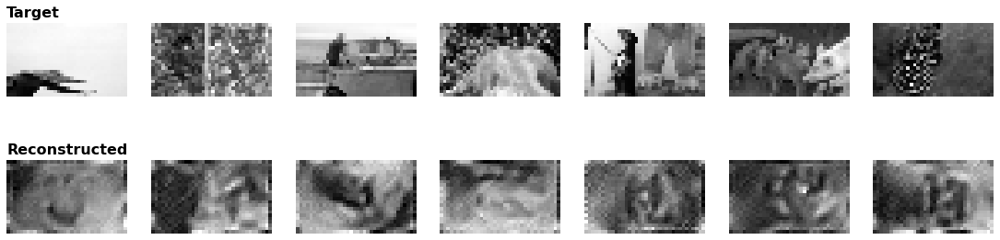

[204/600]
Training progress: [0/280 (0%)]  Loss: 0.010895
Training progress: [100/280 (36%)]  Loss: 0.011531
Training progress: [200/280 (71%)]  Loss: 0.013997
train_loss=0.0135


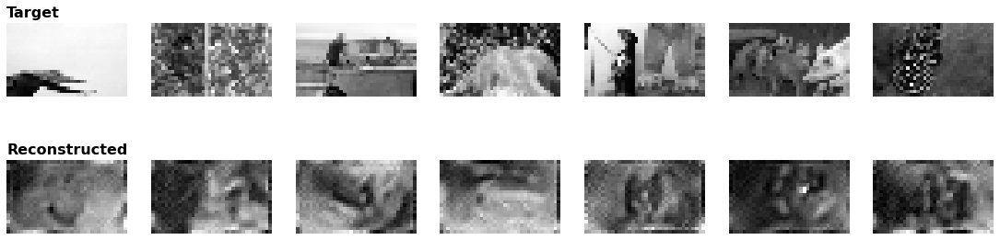

[205/600]
Training progress: [0/280 (0%)]  Loss: 0.011133
Training progress: [100/280 (36%)]  Loss: 0.012604
Training progress: [200/280 (71%)]  Loss: 0.012844
train_loss=0.0136


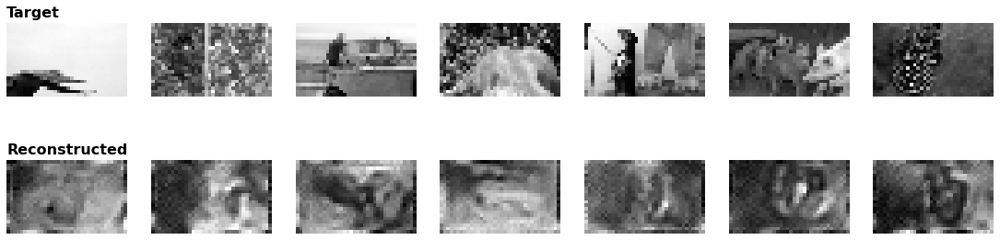

[206/600]
Training progress: [0/280 (0%)]  Loss: 0.012843
Training progress: [100/280 (36%)]  Loss: 0.010092
Training progress: [200/280 (71%)]  Loss: 0.012583
train_loss=0.0140


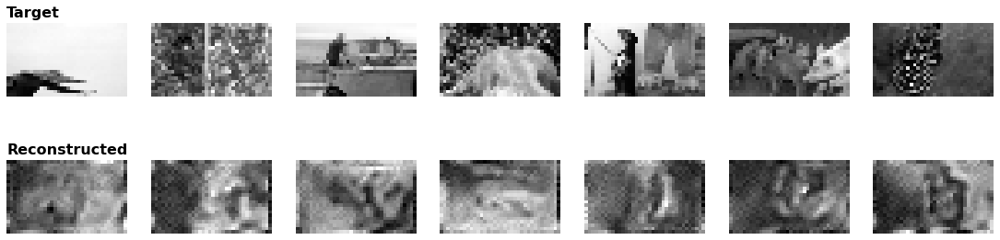

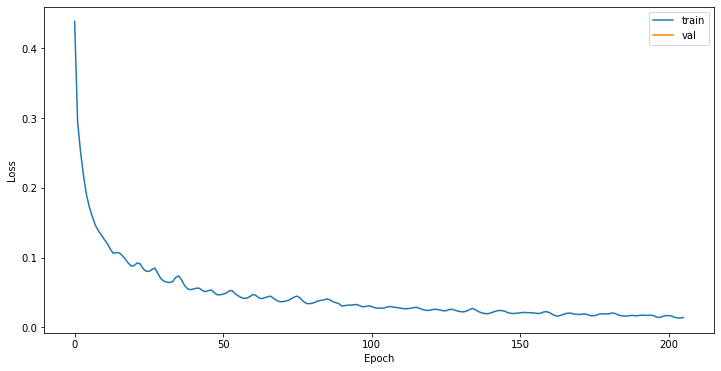

[207/600]
Training progress: [0/280 (0%)]  Loss: 0.014455
Training progress: [100/280 (36%)]  Loss: 0.011941
Training progress: [200/280 (71%)]  Loss: 0.015962
train_loss=0.0146


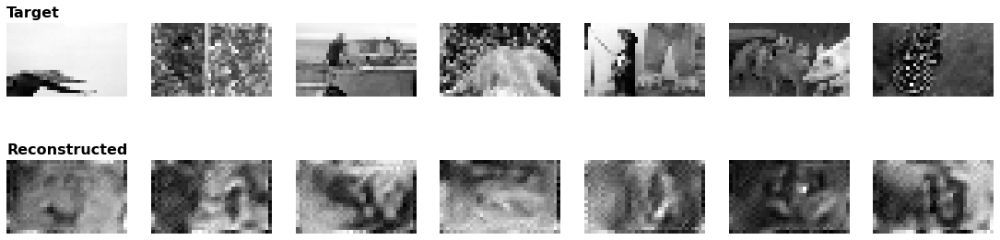

[208/600]
Training progress: [0/280 (0%)]  Loss: 0.011911
Training progress: [100/280 (36%)]  Loss: 0.013255
Training progress: [200/280 (71%)]  Loss: 0.013661
train_loss=0.0152


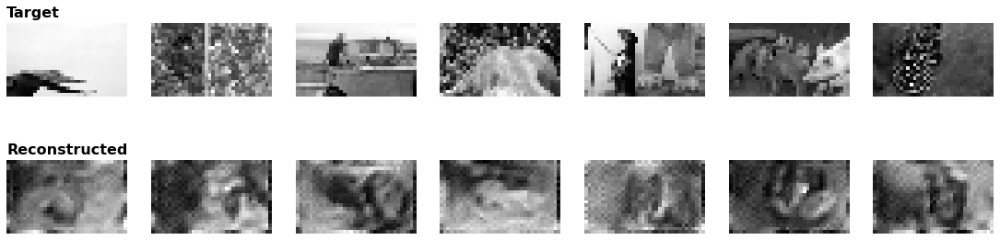

[209/600]
Training progress: [0/280 (0%)]  Loss: 0.013364
Training progress: [100/280 (36%)]  Loss: 0.015447
Training progress: [200/280 (71%)]  Loss: 0.010583
train_loss=0.0149


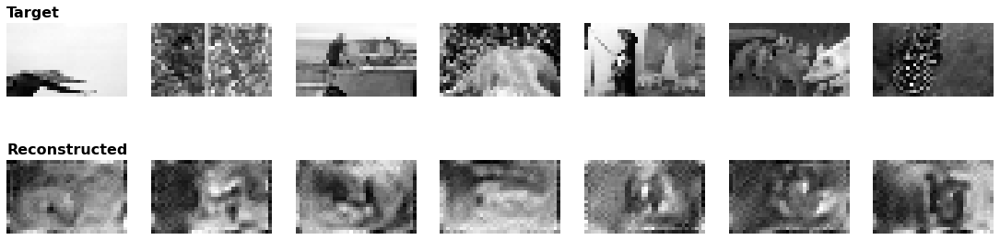

[210/600]
Training progress: [0/280 (0%)]  Loss: 0.010714
Training progress: [100/280 (36%)]  Loss: 0.012422
Training progress: [200/280 (71%)]  Loss: 0.008850
train_loss=0.0137


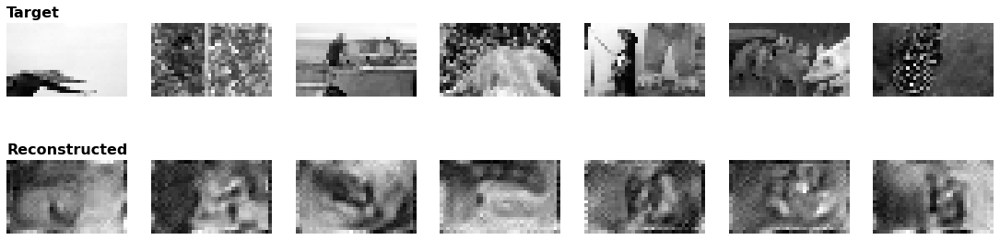

[211/600]
Training progress: [0/280 (0%)]  Loss: 0.011595
Training progress: [100/280 (36%)]  Loss: 0.010993
Training progress: [200/280 (71%)]  Loss: 0.009057
train_loss=0.0126


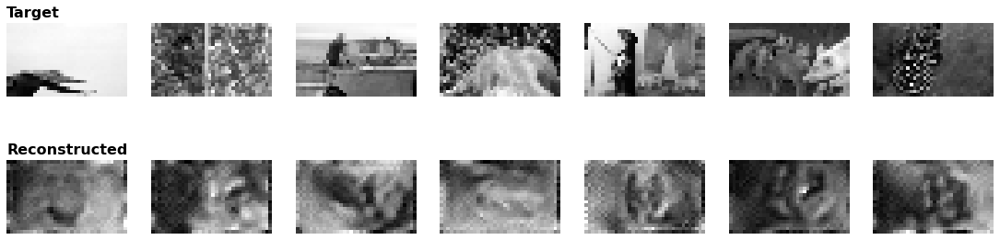

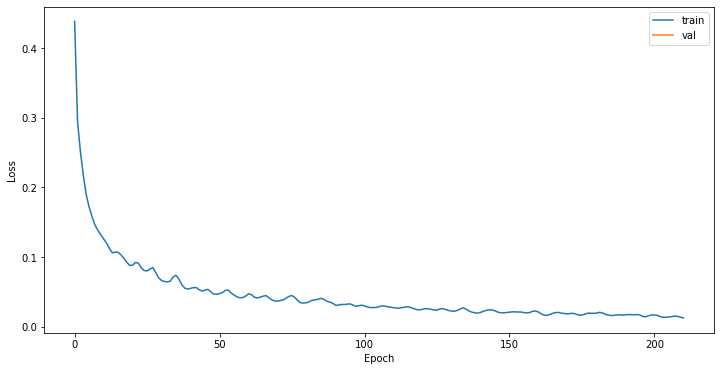

[212/600]
Training progress: [0/280 (0%)]  Loss: 0.011447
Training progress: [100/280 (36%)]  Loss: 0.014554
Training progress: [200/280 (71%)]  Loss: 0.010237
train_loss=0.0124


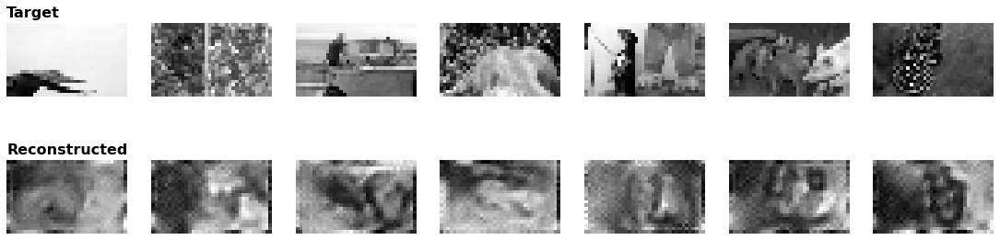

[213/600]
Training progress: [0/280 (0%)]  Loss: 0.011491
Training progress: [100/280 (36%)]  Loss: 0.011787
Training progress: [200/280 (71%)]  Loss: 0.011549
train_loss=0.0127


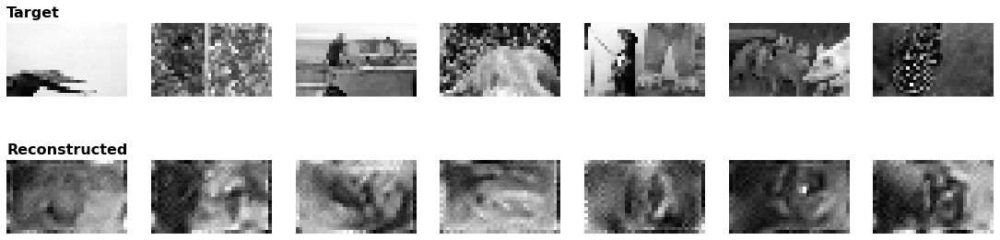

[214/600]
Training progress: [0/280 (0%)]  Loss: 0.009109
Training progress: [100/280 (36%)]  Loss: 0.010861
Training progress: [200/280 (71%)]  Loss: 0.010939
train_loss=0.0137


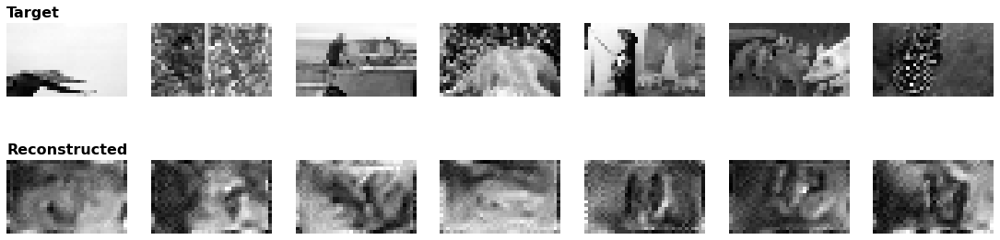

[215/600]
Training progress: [0/280 (0%)]  Loss: 0.010768
Training progress: [100/280 (36%)]  Loss: 0.011738
Training progress: [200/280 (71%)]  Loss: 0.011406
train_loss=0.0137


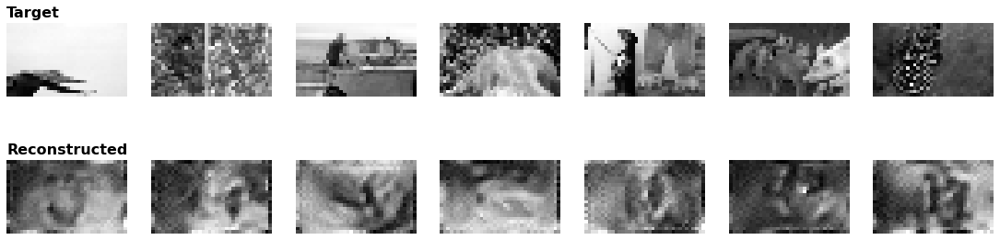

[216/600]
Training progress: [0/280 (0%)]  Loss: 0.011380
Training progress: [100/280 (36%)]  Loss: 0.011318
Training progress: [200/280 (71%)]  Loss: 0.010880
train_loss=0.0135


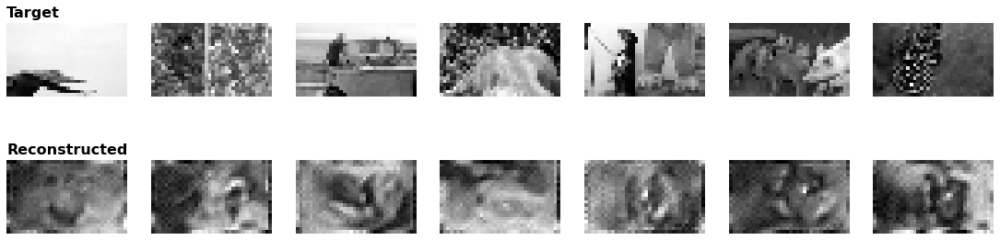

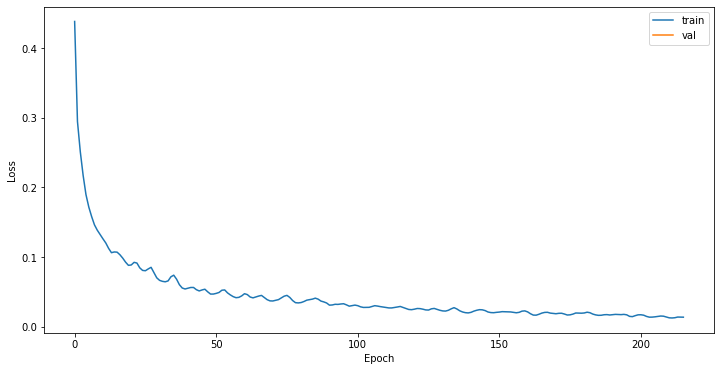

[217/600]
Training progress: [0/280 (0%)]  Loss: 0.010785
Training progress: [100/280 (36%)]  Loss: 0.012089
Training progress: [200/280 (71%)]  Loss: 0.010761
train_loss=0.0133


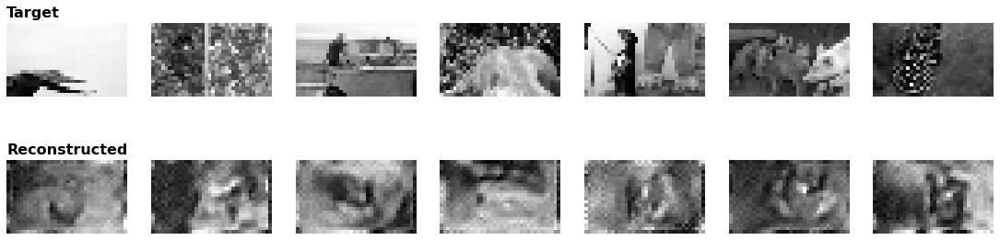

[218/600]
Training progress: [0/280 (0%)]  Loss: 0.010256
Training progress: [100/280 (36%)]  Loss: 0.015767
Training progress: [200/280 (71%)]  Loss: 0.012221
train_loss=0.0130


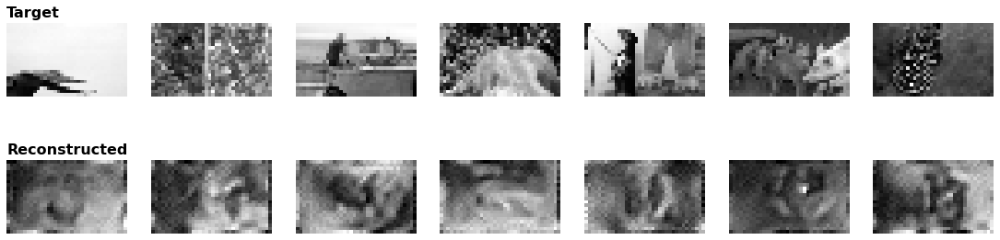

[219/600]
Training progress: [0/280 (0%)]  Loss: 0.010564
Training progress: [100/280 (36%)]  Loss: 0.009476
Training progress: [200/280 (71%)]  Loss: 0.012193
train_loss=0.0126


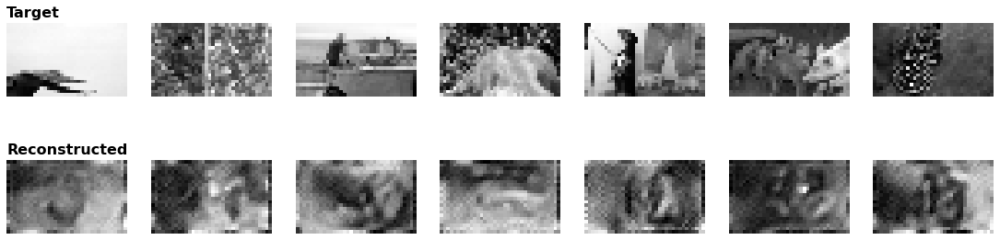

[220/600]
Training progress: [0/280 (0%)]  Loss: 0.011638
Training progress: [100/280 (36%)]  Loss: 0.011267
Training progress: [200/280 (71%)]  Loss: 0.011026
train_loss=0.0127


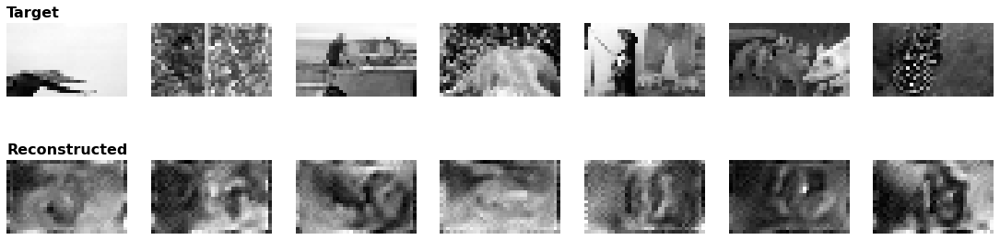

[221/600]
Training progress: [0/280 (0%)]  Loss: 0.012718
Training progress: [100/280 (36%)]  Loss: 0.010862
Training progress: [200/280 (71%)]  Loss: 0.012498
train_loss=0.0126


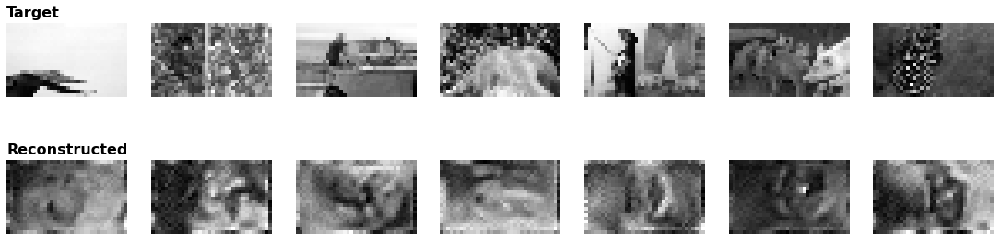

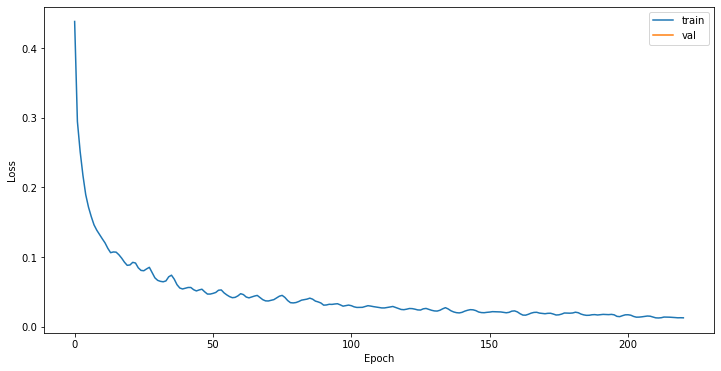

[222/600]
Training progress: [0/280 (0%)]  Loss: 0.012007
Training progress: [100/280 (36%)]  Loss: 0.010886
Training progress: [200/280 (71%)]  Loss: 0.010609
train_loss=0.0124


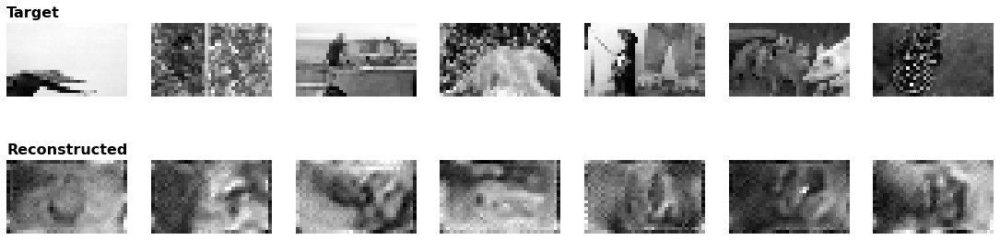

[223/600]
Training progress: [0/280 (0%)]  Loss: 0.011690
Training progress: [100/280 (36%)]  Loss: 0.009587
Training progress: [200/280 (71%)]  Loss: 0.011928
train_loss=0.0127


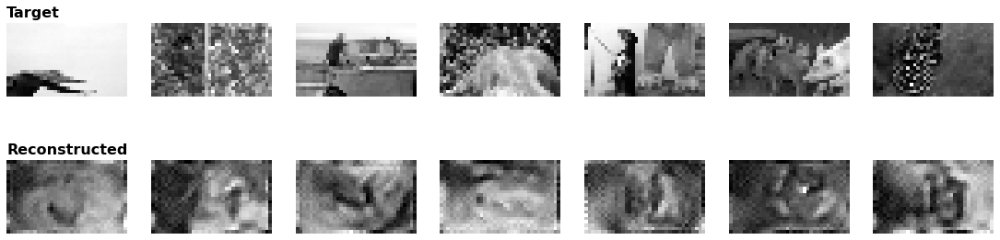

[224/600]
Training progress: [0/280 (0%)]  Loss: 0.010493
Training progress: [100/280 (36%)]  Loss: 0.010628
Training progress: [200/280 (71%)]  Loss: 0.008408
train_loss=0.0118


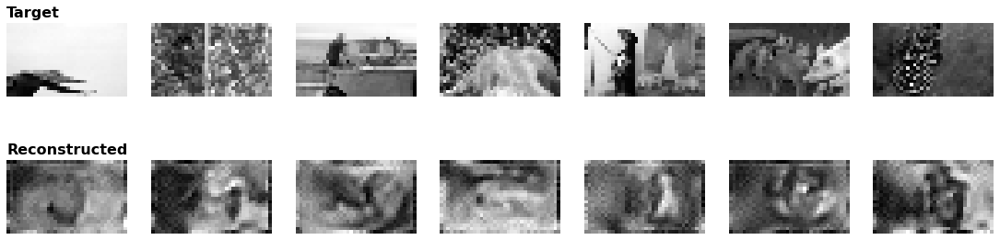

[225/600]
Training progress: [0/280 (0%)]  Loss: 0.011996
Training progress: [100/280 (36%)]  Loss: 0.008482
Training progress: [200/280 (71%)]  Loss: 0.009046
train_loss=0.0114


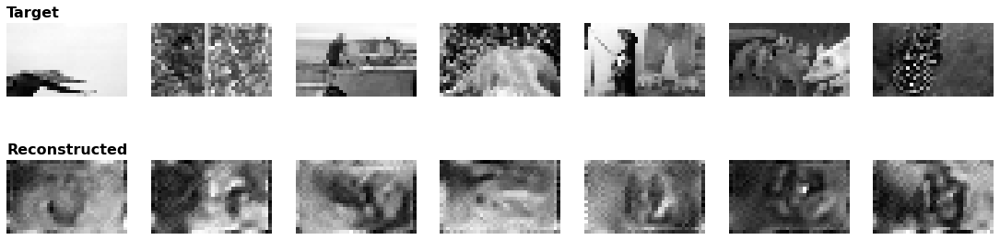

[226/600]
Training progress: [0/280 (0%)]  Loss: 0.009531
Training progress: [100/280 (36%)]  Loss: 0.010394
Training progress: [200/280 (71%)]  Loss: 0.009170
train_loss=0.0118


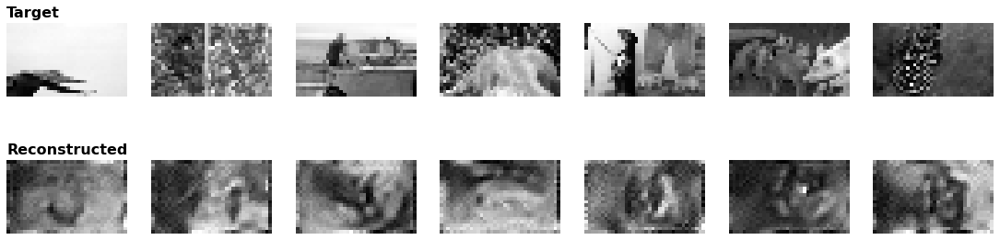

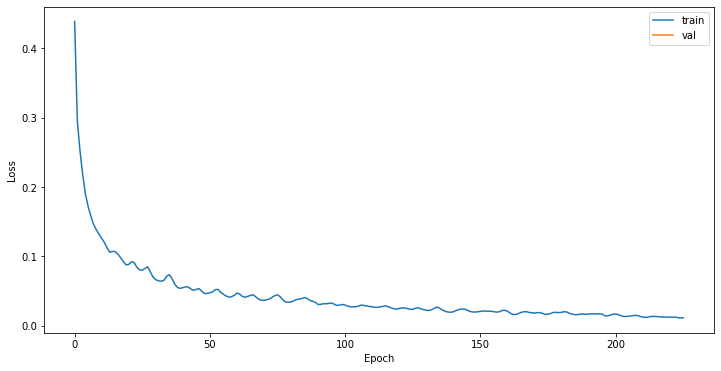

[227/600]
Training progress: [0/280 (0%)]  Loss: 0.008851
Training progress: [100/280 (36%)]  Loss: 0.010459
Training progress: [200/280 (71%)]  Loss: 0.014343
train_loss=0.0127


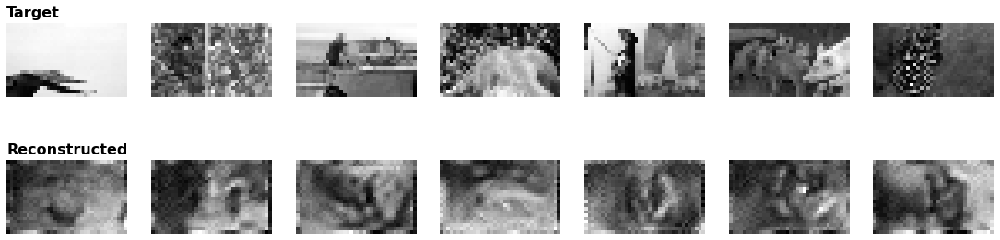

[228/600]
Training progress: [0/280 (0%)]  Loss: 0.011093
Training progress: [100/280 (36%)]  Loss: 0.010081
Training progress: [200/280 (71%)]  Loss: 0.011165
train_loss=0.0133


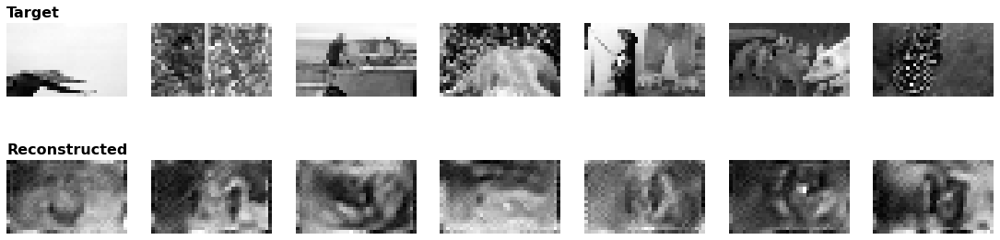

[229/600]
Training progress: [0/280 (0%)]  Loss: 0.009781
Training progress: [100/280 (36%)]  Loss: 0.012000
Training progress: [200/280 (71%)]  Loss: 0.010989
train_loss=0.0128


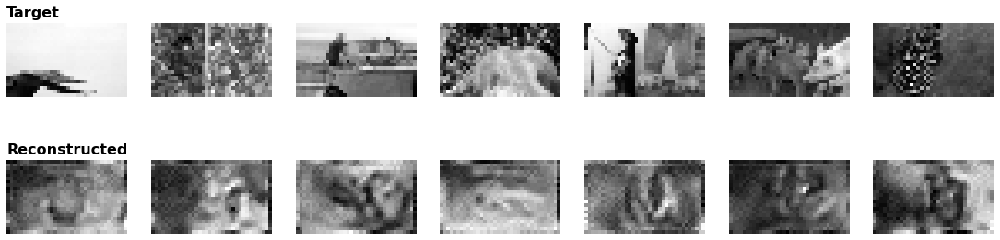

[230/600]
Training progress: [0/280 (0%)]  Loss: 0.010116
Training progress: [100/280 (36%)]  Loss: 0.012132
Training progress: [200/280 (71%)]  Loss: 0.008311
train_loss=0.0122


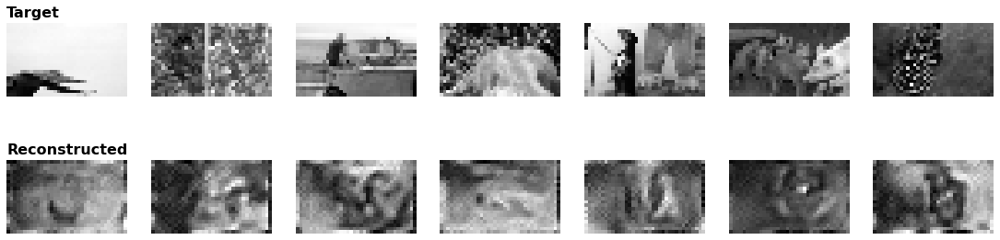

[231/600]
Training progress: [0/280 (0%)]  Loss: 0.010201
Training progress: [100/280 (36%)]  Loss: 0.008783
Training progress: [200/280 (71%)]  Loss: 0.009452
train_loss=0.0111


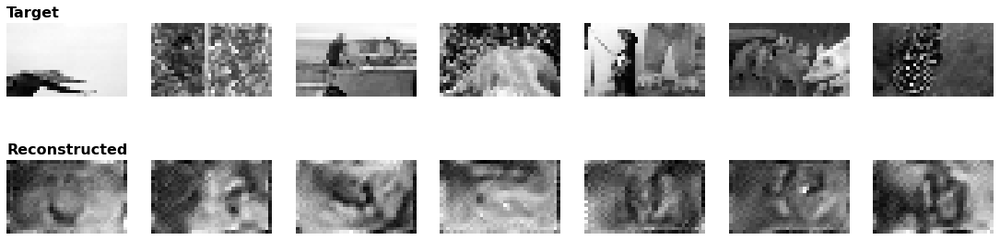

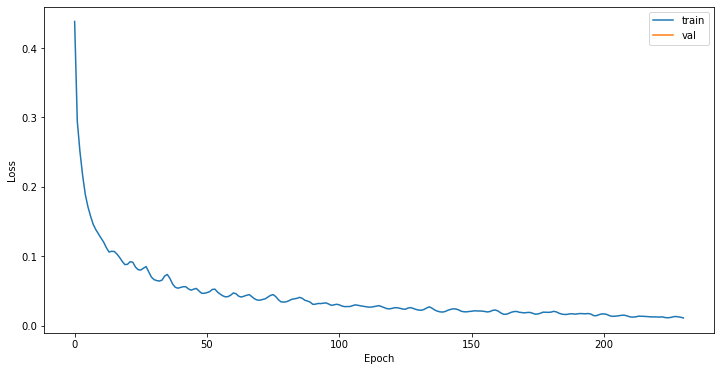

[232/600]
Training progress: [0/280 (0%)]  Loss: 0.009098
Training progress: [100/280 (36%)]  Loss: 0.009157
Training progress: [200/280 (71%)]  Loss: 0.008362
train_loss=0.0107


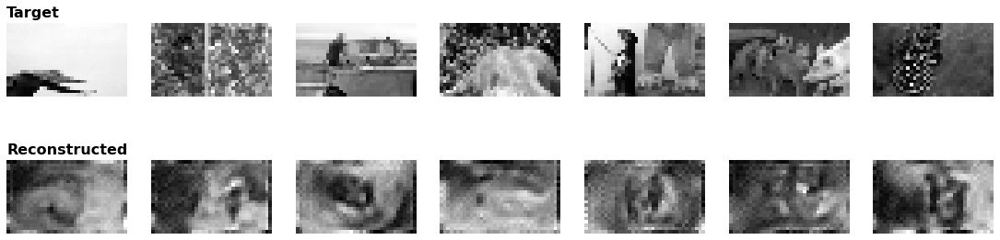

[233/600]
Training progress: [0/280 (0%)]  Loss: 0.010475
Training progress: [100/280 (36%)]  Loss: 0.009006
Training progress: [200/280 (71%)]  Loss: 0.008612
train_loss=0.0107


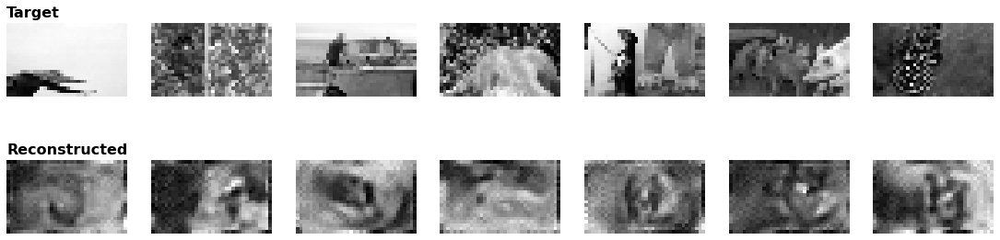

[234/600]
Training progress: [0/280 (0%)]  Loss: 0.011170
Training progress: [100/280 (36%)]  Loss: 0.009913
Training progress: [200/280 (71%)]  Loss: 0.008744
train_loss=0.0110


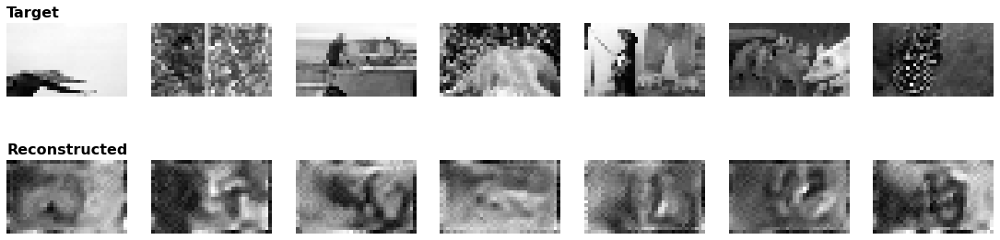

[235/600]
Training progress: [0/280 (0%)]  Loss: 0.009194
Training progress: [100/280 (36%)]  Loss: 0.009374
Training progress: [200/280 (71%)]  Loss: 0.010475
train_loss=0.0117


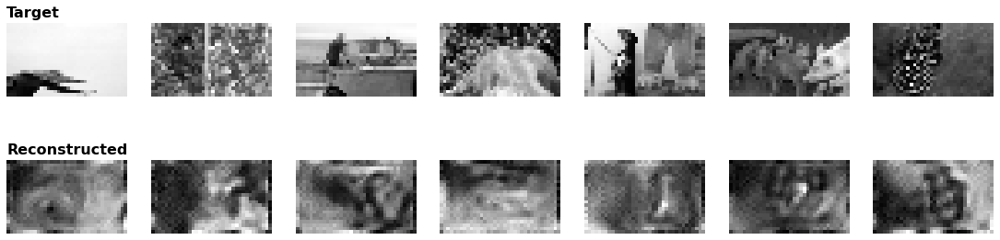

[236/600]
Training progress: [0/280 (0%)]  Loss: 0.010018
Training progress: [100/280 (36%)]  Loss: 0.010925
Training progress: [200/280 (71%)]  Loss: 0.010416
train_loss=0.0120


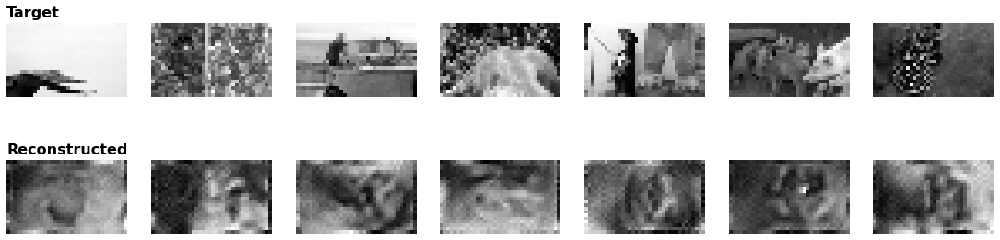

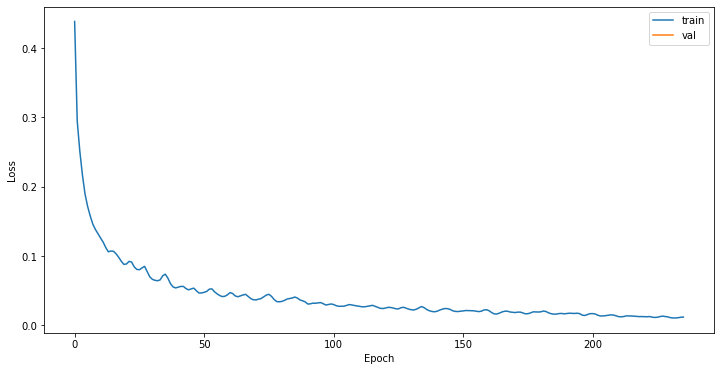

[237/600]
Training progress: [0/280 (0%)]  Loss: 0.009670
Training progress: [100/280 (36%)]  Loss: 0.015440
Training progress: [200/280 (71%)]  Loss: 0.010350
train_loss=0.0121


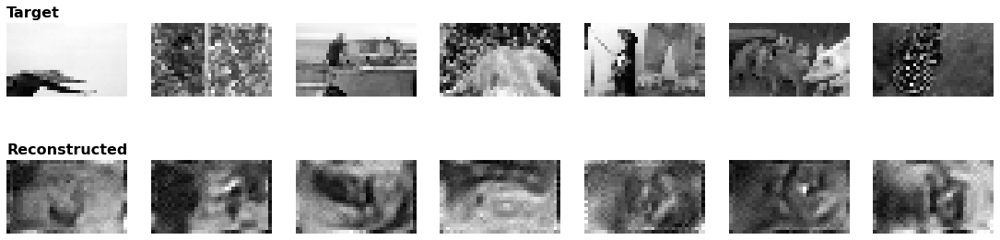

[238/600]
Training progress: [0/280 (0%)]  Loss: 0.008770
Training progress: [100/280 (36%)]  Loss: 0.012429
Training progress: [200/280 (71%)]  Loss: 0.009794
train_loss=0.0122


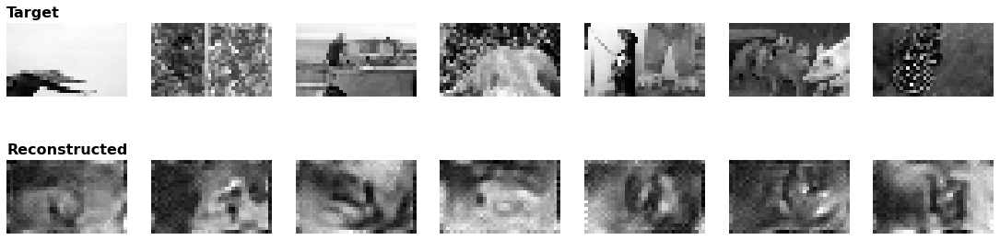

[239/600]
Training progress: [0/280 (0%)]  Loss: 0.011024
Training progress: [100/280 (36%)]  Loss: 0.010343
Training progress: [200/280 (71%)]  Loss: 0.010450
train_loss=0.0126


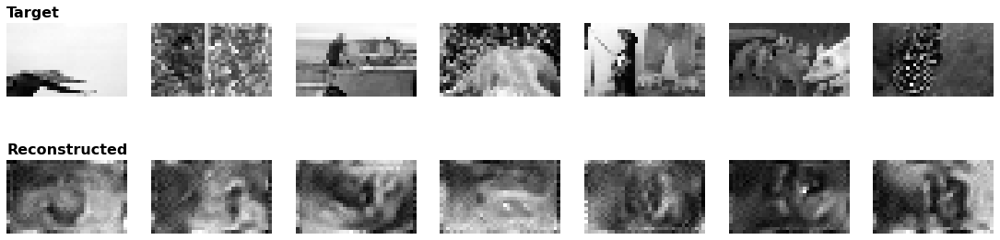

[240/600]
Training progress: [0/280 (0%)]  Loss: 0.012715
Training progress: [100/280 (36%)]  Loss: 0.009019
Training progress: [200/280 (71%)]  Loss: 0.008866
train_loss=0.0122


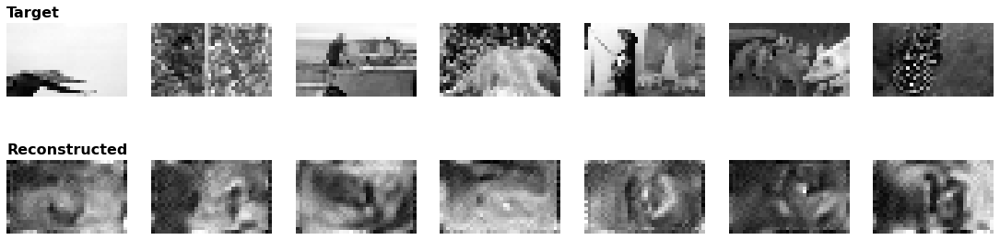

[241/600]
Training progress: [0/280 (0%)]  Loss: 0.010337
Training progress: [100/280 (36%)]  Loss: 0.010447
Training progress: [200/280 (71%)]  Loss: 0.008303
train_loss=0.0121


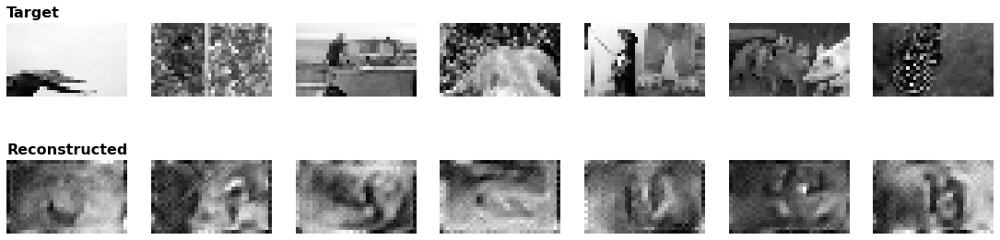

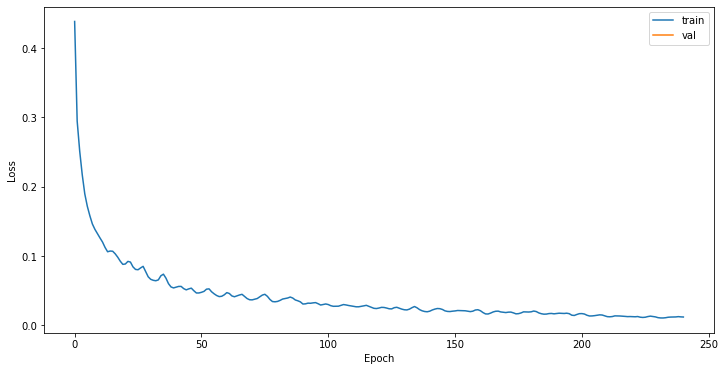

[242/600]
Training progress: [0/280 (0%)]  Loss: 0.011418
Training progress: [100/280 (36%)]  Loss: 0.009077
Training progress: [200/280 (71%)]  Loss: 0.009244
train_loss=0.0124


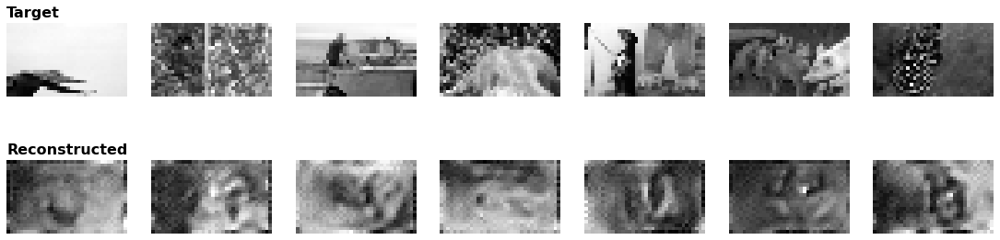

[243/600]
Training progress: [0/280 (0%)]  Loss: 0.011164
Training progress: [100/280 (36%)]  Loss: 0.009297
Training progress: [200/280 (71%)]  Loss: 0.008989
train_loss=0.0119


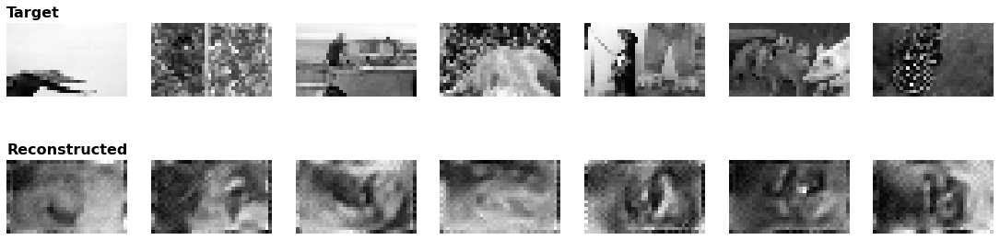

[244/600]
Training progress: [0/280 (0%)]  Loss: 0.015616
Training progress: [100/280 (36%)]  Loss: 0.008917
Training progress: [200/280 (71%)]  Loss: 0.010984
train_loss=0.0111


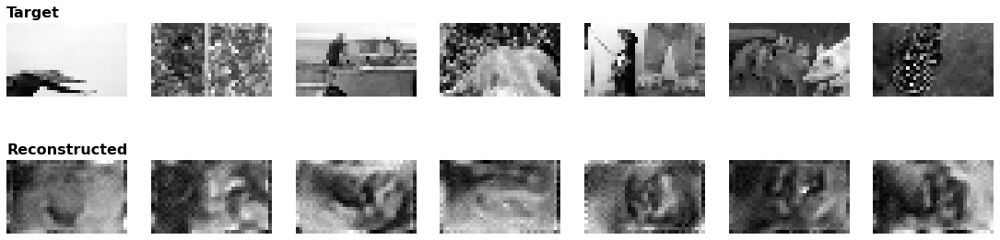

[245/600]
Training progress: [0/280 (0%)]  Loss: 0.011821
Training progress: [100/280 (36%)]  Loss: 0.009380
Training progress: [200/280 (71%)]  Loss: 0.010725
train_loss=0.0110


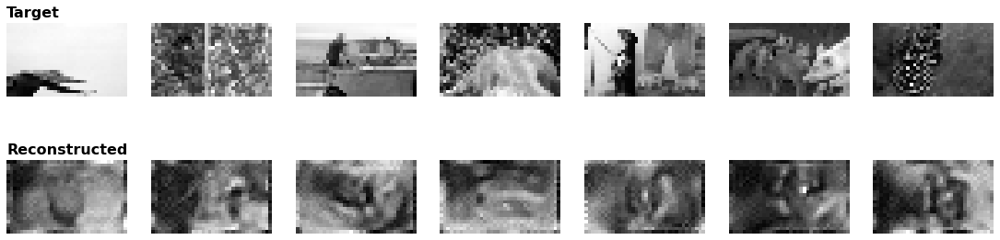

[246/600]
Training progress: [0/280 (0%)]  Loss: 0.011319
Training progress: [100/280 (36%)]  Loss: 0.011274
Training progress: [200/280 (71%)]  Loss: 0.008811
train_loss=0.0120


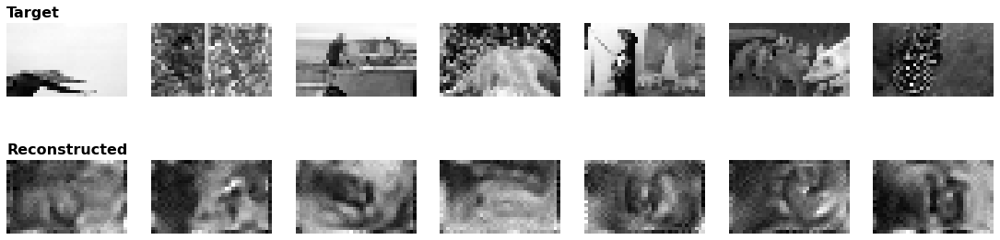

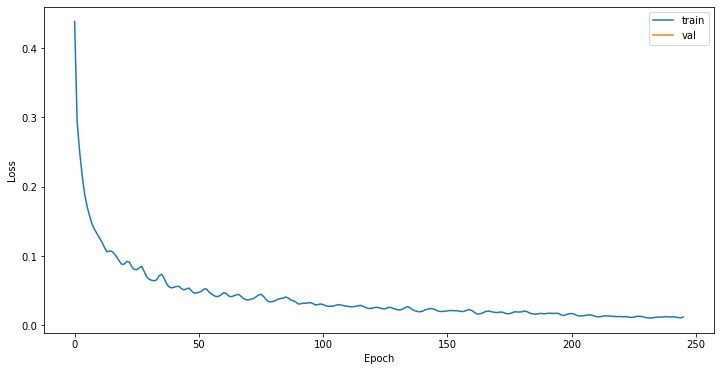

[247/600]
Training progress: [0/280 (0%)]  Loss: 0.012838
Training progress: [100/280 (36%)]  Loss: 0.011657
Training progress: [200/280 (71%)]  Loss: 0.008127
train_loss=0.0129


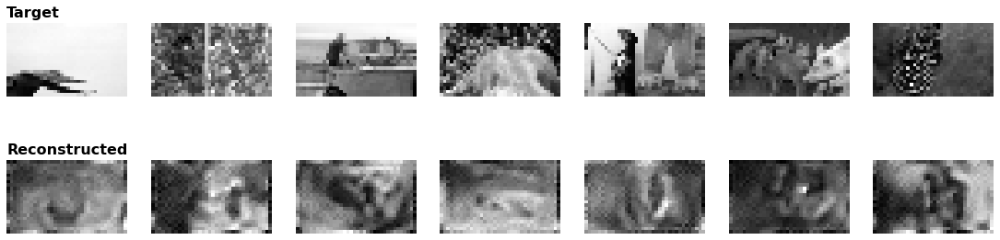

[248/600]
Training progress: [0/280 (0%)]  Loss: 0.013436
Training progress: [100/280 (36%)]  Loss: 0.011680
Training progress: [200/280 (71%)]  Loss: 0.009836
train_loss=0.0131


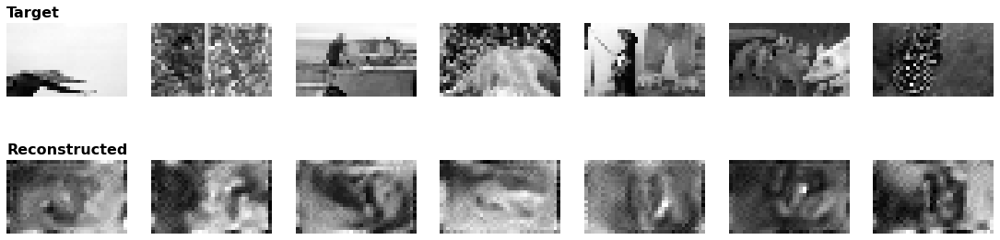

[249/600]
Training progress: [0/280 (0%)]  Loss: 0.012545
Training progress: [100/280 (36%)]  Loss: 0.012102
Training progress: [200/280 (71%)]  Loss: 0.008645
train_loss=0.0129


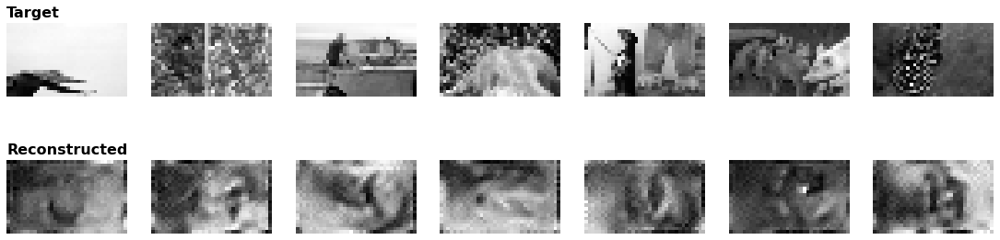

[250/600]
Training progress: [0/280 (0%)]  Loss: 0.009054


KeyboardInterrupt: 

In [17]:
### train
s, e = len(history["train_loss"]), config["decoder"]["n_epochs"]
for epoch in range(s, e):
    print(f"[{epoch + 1}/{e}]")

    ### train and val
    dls, neuron_coords = get_all_data(config=config)
    train_dataloader, val_dataloader = dls["mouse_v1"]["train"], dls["mouse_v1"]["val"]
    train_loss = train(
        model=decoder,
        dataloader=train_dataloader,
    )
    # val_losses = val(
    #     model=decoder,
    #     dataloader=val_dataloader,
    #     loss_fn=loss_fn_val,
    #     config=config,
    # )

    ### save best model
    # if val_losses["total"] < best["val_loss"]:
    #     best["val_loss"] = val_losses["total"]
    #     best["epoch"] = epoch
    #     best["model"] = deepcopy(decoder.state_dict())

    ### log
    history["train_loss"].append(train_loss)
    # history["val_loss"].append(val_losses["total"])
    # if config["wandb"]: wdb_run.log({"train_loss": train_loss, "val_loss": val_losses["total"]}, commit=False)
    # print(f"{train_loss=:.4f}, {val_losses['total']=:.4f}", end="")
    print(f"{train_loss=:.4f}", end="")
    # for data_key, loss in val_losses.items():
    #     if data_key != "total":
    #         print(f", {data_key}: {loss:.4f}", end="")
    print("")

    ### plot reconstructions
    stim_pred = decoder(
        resp[:8].to(config["device"]),
        train=False,
        data_key=sample_data_key,
        neuron_coords=neuron_coords[sample_data_key],
        pupil_center=pupil_center[:8].to(config["device"]),
    )[0].detach()
    fig = plot_comparison(target=crop(stim[:8], config["crop_win"]).cpu(), pred=crop(stim_pred[:8], config["crop_win"]).cpu(), save_to=make_sample_path(epoch, ""))
    if config["wandb"]: wdb_run.log({"val_stim_reconstruction": fig})

    ### plot losses
    if epoch % 5 == 0 and epoch > 0:
        plot_losses(history=history, epoch=epoch, save_to=os.path.join(config["dir"], f"losses_{epoch}.png") if config["decoder"]["save_run"] else None)

    ### save ckpt
    if epoch % 5 == 0 and epoch > 0:
        ### ckpt
        if config["decoder"]["save_run"]:
            torch.save({
                "decoder": decoder.state_dict(),
                "history": history,
                "config": config,
                "best": best,
            }, os.path.join(config["dir"], "ckpt", f"decoder_{epoch}.pt"), pickle_module=dill)

In [ ]:
### final evaluation + logging + saving
print(f"Best val loss: {best['val_loss']:.4f} at epoch {best['epoch']}")

### save final ckpt
if config["decoder"]["save_run"]:
    torch.save({
        "decoder": decoder.state_dict(),
        "history": history,
        "config": config,
        "best": best,
    }, os.path.join(config["dir"], f"decoder.pt"), pickle_module=dill)

### eval on test set w/ current params
print("Evaluating on test set with current model...")
dls, neuron_coords = get_all_data(config=config)
test_loss_curr = val(
    model=decoder,
    dataloader=dls["mouse_v1"]["test"],
    loss_fn=loss_fn_val,
    config=config,
)
print(f"  Test loss (current model): {test_loss_curr['total']:.4f}")

### load best model
decoder.load_state_dict(best["model"])

### eval on test set w/ best params
print("Evaluating on test set with best model...")
dls, neuron_coords = get_all_data(config=config)
test_loss_final = val(
    model=decoder,
    dataloader=dls["mouse_v1"]["test"],
    loss_fn=loss_fn_val,
    config=config,
)
print(f"  Test loss (best model): {test_loss_final['total']:.4f}")

### plot reconstructions of the final model
stim_pred_best, resp_pred_best, reconstruction_history = decoder(
    resp.to(config["device"]),
    train=False,
    data_key=sample_data_key,
    neuron_coords=neuron_coords[sample_data_key],
    pupil_center=pupil_center.to(config["device"]),
)
stim_pred_best = stim_pred_best.detach().cpu()
fig = plot_comparison(
    target=crop(stim[:8], config["crop_win"]).cpu(),
    pred=crop(stim_pred_best[:8], config["crop_win"]).cpu(),
    save_to=os.path.join(config["dir"], "stim_comparison_best.png") if config["decoder"]["save_run"] else None,
)

### log
if config["wandb"]:
    wandb.run.summary["best_val_loss"] = best["val_loss"]
    wandb.run.summary["best_epoch"] = best["epoch"]
    wandb.run.summary["curr_test_loss"] = test_loss_curr["total"]
    wandb.run.summary["final_test_loss"] = test_loss_final["total"]
    wandb.run.summary["best_reconstruction"] = fig

### save/delete wandb run
if config["wandb"]:
    if input("Delete run with 'd', save with anything else: ") == "d":
        print("Deleting wandb run...")
        api = wandb.Api()
        run = api.run(f"johnny1188/{config['wandb']['project']}/{wdb_run.id}")
        run.delete()
    else:
        wdb_run.finish()

### plot losses
plot_losses(
    history=history,
    save_to=None if not config["decoder"]["save_run"] else os.path.join(config["dir"], f"losses.png"),
)

In [ ]:
### show training reconstructions
datapoint_training = next(iter(dls["mouse_v1"]["train"].dataloaders[0]))
stim_training, resp_training, pupil_center_training = datapoint_training.images, datapoint_training.responses, datapoint_training.pupil_center
stim_training_pred_best = decoder(
    resp_training.to(config["device"]),
    train=False,
    data_key=sample_data_key,
    neuron_coords=neuron_coords[sample_data_key],
    pupil_center=pupil_center_training.to(config["device"]),
)[0].detach().cpu()
plot_comparison(
    target=crop(stim_training[:8], config["crop_win"]).cpu(),
    pred=crop(stim_training_pred_best[:8], config["crop_win"]).cpu(),
    save_to=os.path.join(config["dir"], "training_stim_comparison_best.png") if config["decoder"]["save_run"] else None,
)